<a href="https://colab.research.google.com/github/Nischay-verma/Specialization--Capstone-3--Integrated-Retail-Analytics-/blob/main/Advanced_Machine_Learning_Integrated_Retail_Analytics_for_Store_Optimization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name**:
####Integrated Retail Analytics for Store Optimization and Demand Forecasting
####**Project Type** - EDA/Regression/Classification/Unsupervised


##### **Contribution** — Individual
##### **Name**          - Nischay Verma

# **Project Objective**:
#####To leverage machine learning and data analysis techniques to optimize store performance, forecast demand, and enhance customer experience through customer segmentation and personalized marketing strategies

## **GitHub Link** :

https://github.com/Nischay-verma/Specialization--Capstone-3--Integrated-Retail-Analytics-




In [240]:
# Import libraries
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
import calendar


from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [241]:

# Dataset loading

sales_df = pd.read_csv('/content/drive/MyDrive/AlmaBetter masters assesment/ML Engineering/Module 3 ML Engineering/Integrated_Retail_Analytics/sales data-set.csv')
store_df = pd.read_csv('/content/drive/MyDrive/AlmaBetter masters assesment/ML Engineering/Module 3 ML Engineering/Integrated_Retail_Analytics/stores data-set.csv')
feature_df = pd.read_csv('/content/drive/MyDrive/AlmaBetter masters assesment/ML Engineering/Module 3 ML Engineering/Integrated_Retail_Analytics/Features data set.csv')



In [242]:
# Overview of sales data
print("Sales Data:")
sales_df.head()


Sales Data:


,Store,Dept,Date,Weekly_Sales,IsHoliday
0,1,1,05/02/2010,24924.50,False
1,1,1,12/02/2010,46039.49,True
2,1,1,19/02/2010,41595.55,False
3,1,1,26/02/2010,19403.54,False
4,1,1,05/03/2010,21827.90,False


In [243]:
# Overview of store data
print("\nStores Data:")
store_df.head()




Stores Data:


,Store,Type,Size
0,1,A,151315
1,2,A,202307
2,3,B,37392
3,4,A,205863
4,5,B,34875


In [244]:
# Overview of Feature data
print("\nFeatures Data:")
feature_df.head()


Features Data:


,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday
0,1,05/02/2010,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False
1,1,12/02/2010,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,True
2,1,19/02/2010,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,False
3,1,26/02/2010,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,False
4,1,05/03/2010,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,False


In [245]:
# count row  of dataset

Columns_row_sales = sales_df.shape
print('we have total ' , Columns_row_sales , 'Columns and rows in sales data')

Columns_row_store = store_df.shape
print('we have total ' , Columns_row_store , 'Columns and rows in store data')

Columns_row_feature = feature_df.shape
print('we have total ' , Columns_row_feature , 'Columns and rows in feature data')


we have total  (421570, 5) Columns and rows in sales data
we have total  (45, 3) Columns and rows in store data
we have total  (8190, 12) Columns and rows in feature data


In [246]:
# count Column  of dataset

Columns_row_sales = sales_df.shape
print('we have total ' , Columns_row_sales , 'Columns and rows in sales data')

Columns_row_store = store_df.shape
print('we have total ' , Columns_row_sales , 'Columns and rows in store data')

Columns_row_feature = feature_df.shape
print('we have total ' , Columns_row_sales , 'Columns and rows in feature data')

we have total  (421570, 5) Columns and rows in sales data
we have total  (421570, 5) Columns and rows in store data
we have total  (421570, 5) Columns and rows in feature data


In [247]:
# Check for missing values
print("Total Missing values in our sales data:")
print(sales_df.isnull().sum())

print("\nTotal Missing values in our stores data:")
print(store_df.isnull().sum())

print("\nTotal Missing values in our features:")
print(feature_df.isnull().sum())

# Check data types
print("\nChecking Data Types:")
print(sales_df.dtypes)
print(store_df.dtypes)
print(feature_df.dtypes)

Total Missing values in our sales data:
Store           0
Dept            0
Date            0
Weekly_Sales    0
IsHoliday       0
dtype: int64

Total Missing values in our stores data:
Store    0
Type     0
Size     0
dtype: int64

Total Missing values in our features:
Store              0
Date               0
Temperature        0
Fuel_Price         0
MarkDown1       4158
MarkDown2       5269
MarkDown3       4577
MarkDown4       4726
MarkDown5       4140
CPI              585
Unemployment     585
IsHoliday          0
dtype: int64

Checking Data Types:
Store             int64
Dept              int64
Date             object
Weekly_Sales    float64
IsHoliday          bool
dtype: object
Store     int64
Type     object
Size      int64
dtype: object
Store             int64
Date             object
Temperature     float64
Fuel_Price      float64
MarkDown1       float64
MarkDown2       float64
MarkDown3       float64
MarkDown4       float64
MarkDown5       float64
CPI             float64
Unemplo

#Exploratory Data Analysis

In [248]:
# change date format
feature_df['Date'] = pd.to_datetime(feature_df['Date'], format = 'mixed')
sales_df['Date'] = pd.to_datetime(sales_df['Date'], format = 'mixed')

In [249]:
# Merge different datasets
df = pd.merge(sales_df, feature_df, how = 'left', on = ['Store','Date','IsHoliday']) # merging sales and features by left since there are more rows for sales
df_new = pd.merge(df, store_df, how = 'left', on = 'Store') #merge df and df_stores by left to keep all the columns and rows
df_new = df_new.fillna(0)
df_new.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,Type,Size
0,1,1,2010-05-02,24924.50,False,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,A,151315
1,1,1,2010-12-02,46039.49,True,38.51,2.548,0.0,0.0,0.0,0.0,0.0,211.242170,8.106,A,151315
2,1,1,2010-02-19,41595.55,False,39.93,2.514,0.0,0.0,0.0,0.0,0.0,211.289143,8.106,A,151315
3,1,1,2010-02-26,19403.54,False,46.63,2.561,0.0,0.0,0.0,0.0,0.0,211.319643,8.106,A,151315
4,1,1,2010-05-03,21827.90,False,46.50,2.625,0.0,0.0,0.0,0.0,0.0,211.350143,8.106,A,151315


In [250]:
df_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 421570 entries, 0 to 421569
Data columns (total 16 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   Store         421570 non-null  int64         
 1   Dept          421570 non-null  int64         
 2   Date          421570 non-null  datetime64[ns]
 3   Weekly_Sales  421570 non-null  float64       
 4   IsHoliday     421570 non-null  bool          
 5   Temperature   421570 non-null  float64       
 6   Fuel_Price    421570 non-null  float64       
 7   MarkDown1     421570 non-null  float64       
 8   MarkDown2     421570 non-null  float64       
 9   MarkDown3     421570 non-null  float64       
 10  MarkDown4     421570 non-null  float64       
 11  MarkDown5     421570 non-null  float64       
 12  CPI           421570 non-null  float64       
 13  Unemployment  421570 non-null  float64       
 14  Type          421570 non-null  object        
 15  Size          421

In [251]:
#seperate Numerical and Categorical Variables
cat_cols =['Store', 'Dept', 'IsHoliday', 'Type']
num_cols = df_new.columns.drop(cat_cols)
num_cols = num_cols.drop('Date') # Drop 'Date' column from numerical columns

print('Categorical Variables:')
print(cat_cols)

print('Numerical Variables:')
print(num_cols)

Categorical Variables:
['Store', 'Dept', 'IsHoliday', 'Type']
Numerical Variables:
Index(['Weekly_Sales', 'Temperature', 'Fuel_Price', 'MarkDown1', 'MarkDown2',
       'MarkDown3', 'MarkDown4', 'MarkDown5', 'CPI', 'Unemployment', 'Size'],
      dtype='object')


In [252]:
def basic_eda(df, name):
    print(f"\n{'='*60}")
    print(f"EDA FOR: {name}")
    print(f"{'='*60}\n")

    # Shape
    print("Shape:", df.shape)

    # Info
    print("\nInfo:")
    df.info()

    # Missing values
    print("\nMissing Values:")
    print(df.isnull().sum())

    # Duplicate rows
    print("\nDuplicate Rows:", df.duplicated().sum())

    # Statistical summary
    print("\nNumerical Summary:")
    display(df.describe())

    # Categorical summary
    cat_cols = df.select_dtypes(include='object').columns
    if len(cat_cols) > 0:
        print("\nCategorical Columns Summary:")
        for col in cat_cols:
            print(f"\n{col} value counts:")
            print(df[col].value_counts().head())

print(basic_eda(sales_df, "Sales Data"))
print(basic_eda(store_df, "Store Data"))
print(basic_eda(feature_df, "Feature Data"))




EDA FOR: Sales Data

Shape: (421570, 5)

Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 421570 entries, 0 to 421569
Data columns (total 5 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   Store         421570 non-null  int64         
 1   Dept          421570 non-null  int64         
 2   Date          421570 non-null  datetime64[ns]
 3   Weekly_Sales  421570 non-null  float64       
 4   IsHoliday     421570 non-null  bool          
dtypes: bool(1), datetime64[ns](1), float64(1), int64(2)
memory usage: 13.3 MB

Missing Values:
Store           0
Dept            0
Date            0
Weekly_Sales    0
IsHoliday       0
dtype: int64

Duplicate Rows: 0

Numerical Summary:


,Store,Dept,Date,Weekly_Sales
count,421570.000000,421570.000000,421570,421570.000000
mean,22.200546,44.260317,2011-06-19 05:35:51.733757184,15981.258123
min,1.000000,1.000000,2010-01-10 00:00:00,-4988.940000
25%,11.000000,18.000000,2010-10-12 00:00:00,2079.650000
50%,22.000000,37.000000,2011-06-17 00:00:00,7612.030000
75%,33.000000,74.000000,2012-03-02 00:00:00,20205.852500
max,45.000000,99.000000,2012-12-10 00:00:00,693099.360000
std,12.785297,30.492054,NaN,22711.183519


None

EDA FOR: Store Data

Shape: (45, 3)

Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45 entries, 0 to 44
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Store   45 non-null     int64 
 1   Type    45 non-null     object
 2   Size    45 non-null     int64 
dtypes: int64(2), object(1)
memory usage: 1.2+ KB

Missing Values:
Store    0
Type     0
Size     0
dtype: int64

Duplicate Rows: 0

Numerical Summary:


,Store,Size
count,45.000000,45.000000
mean,23.000000,130287.600000
std,13.133926,63825.271991
min,1.000000,34875.000000
25%,12.000000,70713.000000
50%,23.000000,126512.000000
75%,34.000000,202307.000000
max,45.000000,219622.000000



Categorical Columns Summary:

Type value counts:
Type
A    22
B    17
C     6
Name: count, dtype: int64
None

EDA FOR: Feature Data

Shape: (8190, 12)

Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8190 entries, 0 to 8189
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Store         8190 non-null   int64         
 1   Date          8190 non-null   datetime64[ns]
 2   Temperature   8190 non-null   float64       
 3   Fuel_Price    8190 non-null   float64       
 4   MarkDown1     4032 non-null   float64       
 5   MarkDown2     2921 non-null   float64       
 6   MarkDown3     3613 non-null   float64       
 7   MarkDown4     3464 non-null   float64       
 8   MarkDown5     4050 non-null   float64       
 9   CPI           7605 non-null   float64       
 10  Unemployment  7605 non-null   float64       
 11  IsHoliday     8190 non-null   bool          
dtypes: bool(1), datetime64[ns](1)

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment
count,8190.000000,8190,8190.000000,8190.000000,4032.000000,2921.000000,3613.000000,3464.000000,4050.000000,7605.000000,7605.000000
mean,23.000000,2011-11-04 13:19:07.252747264,59.356198,3.405992,7032.371786,3384.176594,1760.100180,3292.935886,4132.216422,172.460809,7.826821
min,1.000000,2010-01-10 00:00:00,-7.290000,2.472000,-2781.450000,-265.760000,-179.260000,0.220000,-185.170000,126.064000,3.684000
25%,12.000000,2010-12-17 00:00:00,45.902500,3.041000,1577.532500,68.880000,6.600000,304.687500,1440.827500,132.364839,6.634000
50%,23.000000,2011-10-30 12:00:00,60.710000,3.513000,4743.580000,364.570000,36.260000,1176.425000,2727.135000,182.764003,7.806000
75%,34.000000,2012-09-11 00:00:00,73.880000,3.743000,8923.310000,2153.350000,163.150000,3310.007500,4832.555000,213.932412,8.567000
max,45.000000,2013-12-07 00:00:00,101.950000,4.468000,103184.980000,104519.540000,149483.310000,67474.850000,771448.100000,228.976456,14.313000
std,12.987966,NaN,18.678607,0.431337,9262.747448,8793.583016,11276.462208,6792.329861,13086.690278,39.738346,1.877259


None


#Weekly Sales Performance Over Time

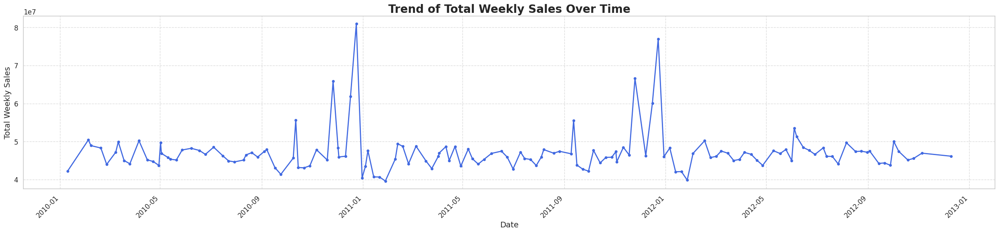

In [253]:
# Set style
sns.set_style("whitegrid")

# Sum of sales across time
sales_across_time = df_new.groupby(by=['Date'], as_index=False)['Weekly_Sales'].sum()

# Plot
plt.figure(figsize=(25, 6))
plt.plot(sales_across_time.Date, sales_across_time.Weekly_Sales,
         marker='o', linestyle='-', color='royalblue', linewidth=2, markersize=4)

# Title and labels
plt.title("Trend of Total Weekly Sales Over Time", fontsize=20, fontweight='bold')
plt.xlabel("Date", fontsize=14)
plt.ylabel("Total Weekly Sales", fontsize=14)

# Rotate x-axis labels
plt.xticks(rotation=45, ha='right')

# Grid and tight layout
plt.grid(True, which='major', linestyle='--', alpha=0.7)
plt.tight_layout()

plt.show()


In [254]:
print("Sales columns",sales_df.columns)
print("Store columns",store_df.columns)
print("feature columns",feature_df.columns)

Sales columns Index(['Store', 'Dept', 'Date', 'Weekly_Sales', 'IsHoliday'], dtype='object')
Store columns Index(['Store', 'Type', 'Size'], dtype='object')
feature columns Index(['Store', 'Date', 'Temperature', 'Fuel_Price', 'MarkDown1', 'MarkDown2',
       'MarkDown3', 'MarkDown4', 'MarkDown5', 'CPI', 'Unemployment',
       'IsHoliday'],
      dtype='object')


#Weekly Sales Distribution

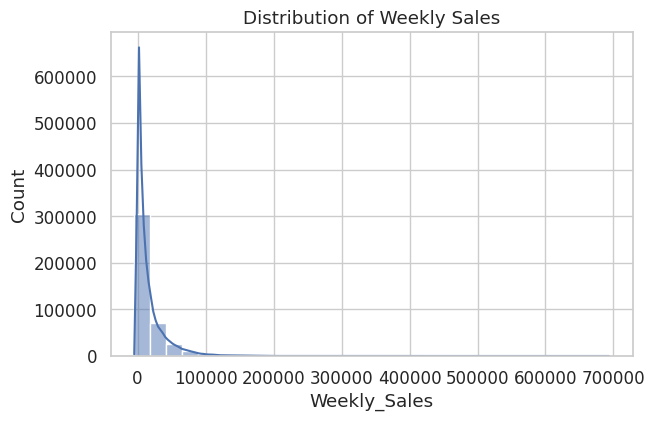

In [255]:
plt.figure(figsize=(6,4))
sns.histplot(sales_df['Weekly_Sales'], bins=30, kde=True)
plt.title("Distribution of Weekly Sales")
plt.show()


#Sales by Holiday vs Non-Holiday

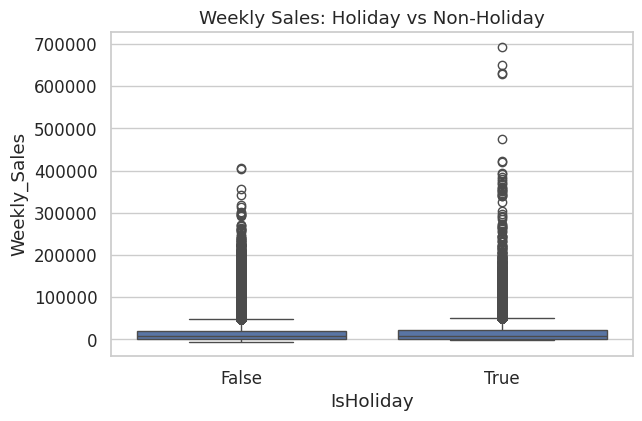

In [256]:
plt.figure(figsize=(6,4))
sns.boxplot(x='IsHoliday', y='Weekly_Sales', data=sales_df)
plt.title("Weekly Sales: Holiday vs Non-Holiday")
plt.show()


#Yearly Total Sales Overview (in Millions)

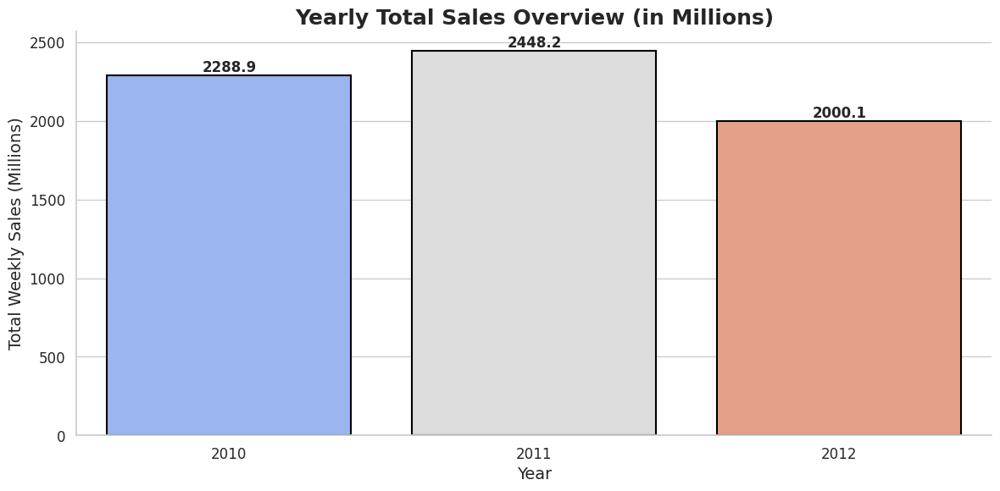

In [257]:
# =========================
# Prepare Yearly Sales Data
# =========================
yearly_sales = (
    df_new
    .groupby(df_new['Date'].dt.year)['Weekly_Sales']
    .sum() / 1_000_000
)

# =========================
# Plot Configuration
# =========================
plt.figure(figsize=(12, 6))
sns.set_style("whitegrid")

# Custom color palette (you can change this)
custom_palette = sns.color_palette("coolwarm", len(yearly_sales))

# =========================
# Bar Plot
# =========================
bars = sns.barplot(
    x=yearly_sales.index,
    y=yearly_sales.values,
    palette=custom_palette,
    edgecolor="black",
    linewidth=1.5
)

# =========================
# Add Value Labels on Bars
# =========================
for index, value in enumerate(yearly_sales.values):
    plt.text(
        index,
        value + 1,
        f"{value:.1f}",
        ha='center',
        va='bottom',
        fontsize=12,
        fontweight='bold'
    )

# =========================
# Titles & Labels
# =========================
plt.title(
    "Yearly Total Sales Overview (in Millions)",
    fontsize=18,
    fontweight='bold'
)
plt.xlabel("Year", fontsize=14)
plt.ylabel("Total Weekly Sales (Millions)", fontsize=14)

# =========================
# Final Touches
# =========================
sns.despine()
plt.tight_layout()
plt.show()


#Monthly Distribution of Weekly Sales (in Millions)

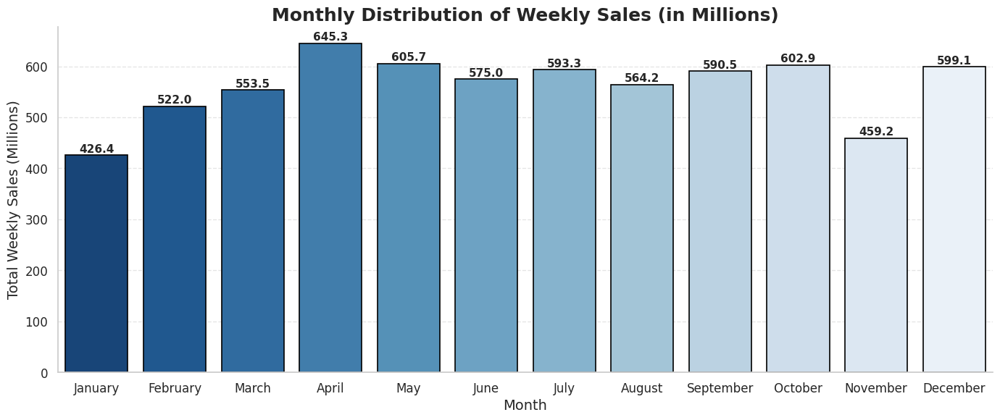

In [258]:
# =========================
# Prepare Monthly Sales Data
# =========================
monthly_sales = (
    df_new
    .groupby(df_new['Date'].dt.month)['Weekly_Sales']
    .sum() / 1_000_000
)

# Convert month numbers to month names
months = [calendar.month_name[m] for m in monthly_sales.index]

# =========================
# Plot Configuration
# =========================
plt.figure(figsize=(14, 6))
sns.set_style("whitegrid")

# Custom color palette
custom_palette = sns.color_palette("Blues_r", len(monthly_sales))

# =========================
# Bar Plot
# =========================
bars = sns.barplot(
    x=months,
    y=monthly_sales.values,
    palette=custom_palette,
    edgecolor="black",
    linewidth=1.2
)

# =========================
# Add Value Labels
# =========================
for index, value in enumerate(monthly_sales.values):
    plt.text(
        index,
        value + 1,
        f"{value:.1f}",
        ha='center',
        va='bottom',
        fontsize=11,
        fontweight='bold'
    )

# =========================
# Titles & Axis Labels
# =========================
plt.title(
    "Monthly Distribution of Weekly Sales (in Millions)",
    fontsize=18,
    fontweight='bold'
)
plt.xlabel("Month", fontsize=14)
plt.ylabel("Total Weekly Sales (Millions)", fontsize=14)

# =========================
# Final Styling
# =========================
sns.despine()
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


**Insight:**

Sales increased significantly during major promotional and holiday seasons such as Black Friday, Christmas, and New Year, followed by a temporary decline before gradually recovering in later months. November showed relatively lower sales activity, likely because customers delayed purchases in anticipation of upcoming festive discounts and year-end offers. Additionally, the December 2013 sales data appears incomplete, as sales showed a spike but did not reach expected levels due to limited data availability for that period.


#Sales Trends by Time:

In [259]:

# Further deepdive into specific dates that drives highest weekly sales
# Top 5 dates where weekly_sales are the highest
sort_sales_across_time = sales_across_time.sort_values('Weekly_Sales', ascending = False) # sort in descending order
sort_sales_across_time.head(5)

,Date,Weekly_Sales
46,2010-12-24,80931415.60
98,2011-12-23,76998241.31
95,2011-11-25,66593605.26
41,2010-11-26,65821003.24
45,2010-12-17,61820799.85


#Temporal Trend of Average Unemployment Rate Across All Stores

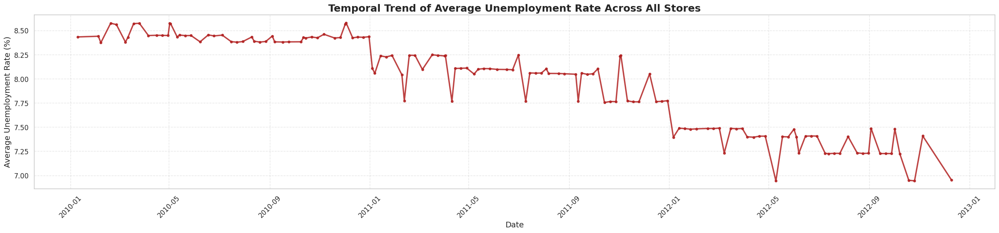

In [260]:
# Prepare data
unn_across_time = df_new.groupby(by=['Date'], as_index=False)['Unemployment'].mean()

# Set visualization style
sns.set_style("whitegrid")

# Create plot
plt.figure(figsize=(25, 6))
plt.plot(
    unn_across_time['Date'],
    unn_across_time['Unemployment'],
    color='firebrick',
    linewidth=2.5,
    marker='o',
    markersize=4,
    alpha=0.85
)

# Labels and title
plt.xlabel("Date", fontsize=14)
plt.ylabel("Average Unemployment Rate (%)", fontsize=14)
plt.title(
    "Temporal Trend of Average Unemployment Rate Across All Stores",
    fontsize=18,
    fontweight='bold'
)

# Rotate x-axis labels for readability
plt.xticks(rotation=45)

# Grid and layout
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


**Findings:**
From January 2010 to December 2012, the unemployment rate gradually declined, indicating improving employment conditions. As employment increased, consumers gained higher purchasing power, which positively contributed to overall sales growth and business performance.


#Temporal Trend of Average Consumer Price Index (CPI) Across All Stores

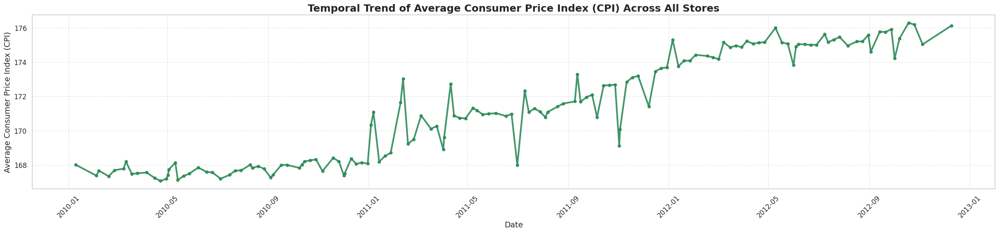

In [261]:
# Prepare data
cpi_across_time = df_new.groupby(by=['Date'], as_index=False)['CPI'].mean()

# Set visualization style
sns.set_style("whitegrid")

# Create plot
plt.figure(figsize=(25, 6))
plt.plot(
    cpi_across_time['Date'],
    cpi_across_time['CPI'],
    color='seagreen',
    linewidth=3,
    marker='o',
    markersize=5,
    alpha=0.9
)

# Labels and title
plt.xlabel("Date", fontsize=14)
plt.ylabel("Average Consumer Price Index (CPI)", fontsize=14)
plt.title(
    "Temporal Trend of Average Consumer Price Index (CPI) Across All Stores",
    fontsize=18,
    fontweight='bold'
)

# X-axis formatting
plt.xticks(rotation=45)

# Grid and layout
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


**Findings:**
Between January 2010 and December 2012, the Consumer Price Index (CPI) showed a steady upward trend, reflecting increasing inflation levels throughout the period.


#Temporal Trend of Average Fuel Price Across All Stores

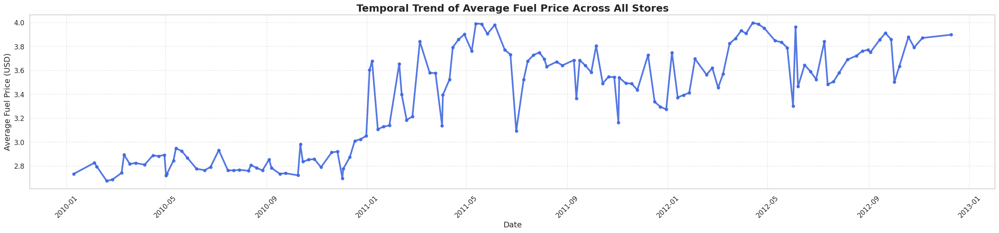

In [262]:
# Prepare data
fuel_across_time = df_new.groupby(by=['Date'], as_index=False)['Fuel_Price'].mean()

# Set visualization style
sns.set_style("whitegrid")

# Create plot
plt.figure(figsize=(25, 6))
plt.plot(
    fuel_across_time['Date'],
    fuel_across_time['Fuel_Price'],
    color='royalblue',          # changed color
    linewidth=3,
    marker='o',
    markersize=5,
    alpha=0.9
)

# Labels and title
plt.xlabel("Date", fontsize=14)
plt.ylabel("Average Fuel Price (USD)", fontsize=14)
plt.title(
    "Temporal Trend of Average Fuel Price Across All Stores",
    fontsize=18,
    fontweight='bold'
)

# X-axis formatting
plt.xticks(rotation=45)

# Grid and layout
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


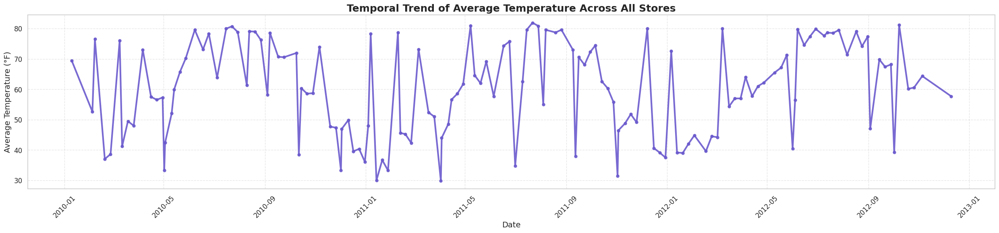

In [263]:
# Prepare data
temp_across_time = df_new.groupby(by=['Date'], as_index=False)['Temperature'].mean()

# Set visualization style
sns.set_style("whitegrid")

# Create plot
plt.figure(figsize=(25, 6))
plt.plot(
    temp_across_time['Date'],
    temp_across_time['Temperature'],
    color='slateblue',
    linewidth=3,
    marker='o',
    markersize=5,
    alpha=0.9
)

# Labels and title
plt.xlabel("Date", fontsize=14)
plt.ylabel("Average Temperature (°F)", fontsize=14)
plt.title(
    "Temporal Trend of Average Temperature Across All Stores",
    fontsize=18,
    fontweight='bold'
)

# X-axis formatting
plt.xticks(rotation=45)

# Grid and layout
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


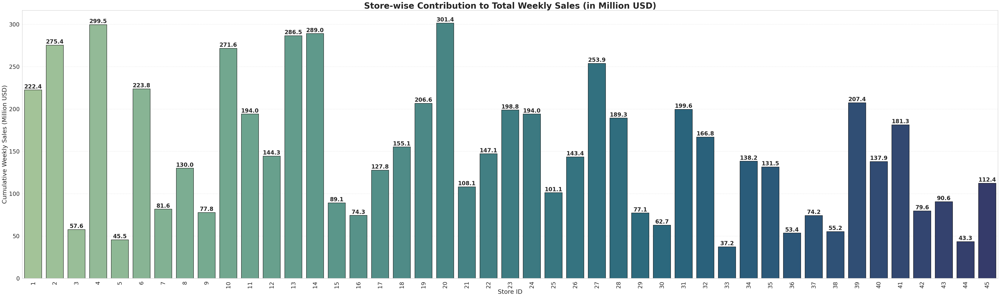

In [264]:
# Prepare data
stores_sales = df_new.groupby(by=['Store'], as_index=False)['Weekly_Sales'].sum()
stores_sales['Weekly_Sales'] = stores_sales['Weekly_Sales'] / 1_000_000  # Convert to millions

# Set visualization style
sns.set_style("whitegrid")

# Create plot
plt.figure(figsize=(50, 15))
bars = sns.barplot(
    x='Store',
    y='Weekly_Sales',
    data=stores_sales,
    palette='crest',
    edgecolor='black',
    linewidth=1.2
)

# Add value labels on bars
for bar in bars.patches:
    height = bar.get_height()
    bars.annotate(
        f'{height:.1f}',
        (bar.get_x() + bar.get_width() / 2, height + 0.5),
        ha='center',
        va='bottom',
        fontsize=20,
        fontweight='bold'
    )

# Labels and title
plt.xlabel("Store ID", fontsize=22)
plt.ylabel("Cumulative Weekly Sales (Million USD)", fontsize=22)
plt.title(
    "Store-wise Contribution to Total Weekly Sales (in Million USD)",
    fontsize=30,
    fontweight='bold'
)

# Axis styling
plt.xticks(rotation=90, fontsize=20)
plt.yticks(fontsize=20)

# Grid and layout
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


**Findings:**
Stores 20 and 4 emerged as the highest-performing stores based on weekly sales, while stores 44 and 5 recorded the lowest sales, making them the least profitable during the analyzed period.


#Comparison of Total Weekly Sales Across Store Types

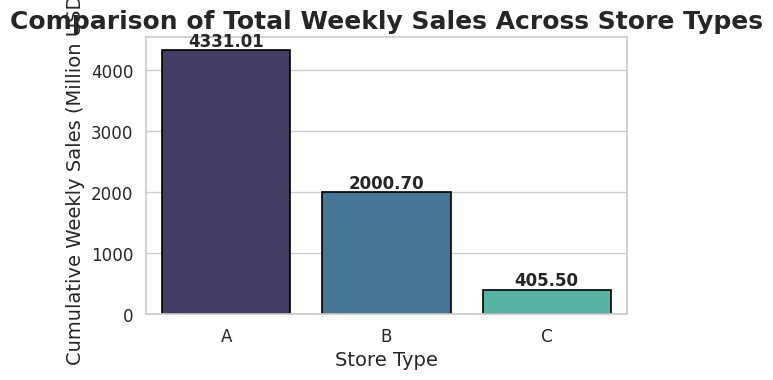

In [265]:
# Prepare data
type_sales = df_new.groupby(by=['Type'], as_index=False)['Weekly_Sales'].sum()
type_sales['Weekly_Sales'] = type_sales['Weekly_Sales'] / 1_000_000  # Convert to millions

# Set visualization style
sns.set_style("whitegrid")

# Create plot
plt.figure(figsize=(6, 4))
bars = sns.barplot(
    x='Type',
    y='Weekly_Sales',
    data=type_sales,
    palette='mako',
    edgecolor='black',
    linewidth=1.2
)

# Add value labels on bars
for bar in bars.patches:
    height = bar.get_height()
    bars.annotate(
        f'{height:.2f}',
        (bar.get_x() + bar.get_width() / 2, height + 0.2),
        ha='center',
        va='bottom',
        fontsize=12,
        fontweight='bold'
    )

# Labels and title
plt.xlabel("Store Type", fontsize=14)
plt.ylabel("Cumulative Weekly Sales (Million USD)", fontsize=14)
plt.title(
    "Comparison of Total Weekly Sales Across Store Types",
    fontsize=18,
    fontweight='bold'
)

plt.tight_layout()
plt.show()


**Findings:**
Store Type A generated the highest weekly sales, followed by Store Type B, while Store Type C recorded the lowest sales performance during the analyzed period.


#Temporal Trends of Average Promotional Markdown Values Across All Stores

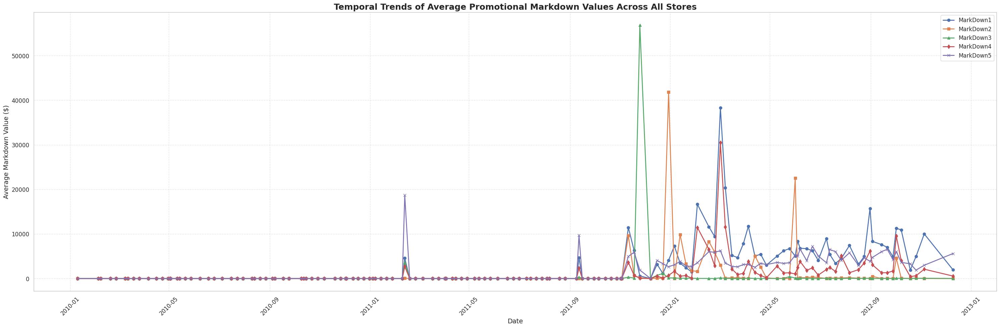

In [266]:
# Grouping and aggregating markdown means
df_markdown = df_new.groupby('Date').agg({
    'MarkDown1': 'mean',
    'MarkDown2': 'mean',
    'MarkDown3': 'mean',
    'MarkDown4': 'mean',
    'MarkDown5': 'mean'
})

# Set visualization style
sns.set_style("whitegrid")

# Create plot
plt.figure(figsize=(30, 10))

# Plot each markdown series
plt.plot(df_markdown.index, df_markdown['MarkDown1'], label='MarkDown1', marker='o', linewidth=2)
plt.plot(df_markdown.index, df_markdown['MarkDown2'], label='MarkDown2', marker='s', linewidth=2)
plt.plot(df_markdown.index, df_markdown['MarkDown3'], label='MarkDown3', marker='^', linewidth=2)
plt.plot(df_markdown.index, df_markdown['MarkDown4'], label='MarkDown4', marker='d', linewidth=2)
plt.plot(df_markdown.index, df_markdown['MarkDown5'], label='MarkDown5', marker='x', linewidth=2)

# Labels and title
plt.xlabel("Date", fontsize=14)
plt.ylabel("Average Markdown Value ($)", fontsize=14)
plt.title(
    "Temporal Trends of Average Promotional Markdown Values Across All Stores",
    fontsize=18,
    fontweight='bold'
)

# Legend and formatting
plt.legend(loc='best', fontsize=12)
plt.xticks(rotation=45)
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


#Monthly Distribution of Average Promotional Markdown Values

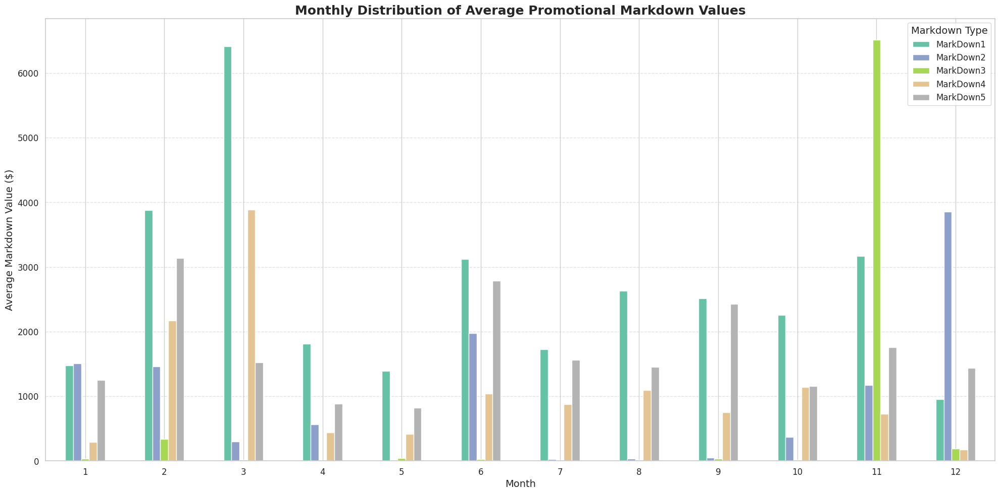

In [267]:
# Aggregate mean markdowns per month
df_markdown_month = df_new.groupby(df_new.Date.dt.month).agg({
    'MarkDown1': 'mean',
    'MarkDown2': 'mean',
    'MarkDown3': 'mean',
    'MarkDown4': 'mean',
    'MarkDown5': 'mean'
})

# Set visualization style
sns.set_style("whitegrid")

# Create plot
ax = df_markdown_month.plot(
    kind='bar',
    figsize=(20, 10),
    rot=0,
    colormap='Set2'
)

# Labels and title
plt.xlabel("Month", fontsize=14)
plt.ylabel("Average Markdown Value ($)", fontsize=14)
plt.title(
    "Monthly Distribution of Average Promotional Markdown Values",
    fontsize=18,
    fontweight='bold'
)

# Legend and layout
plt.legend(title='Markdown Type', fontsize=12, title_fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


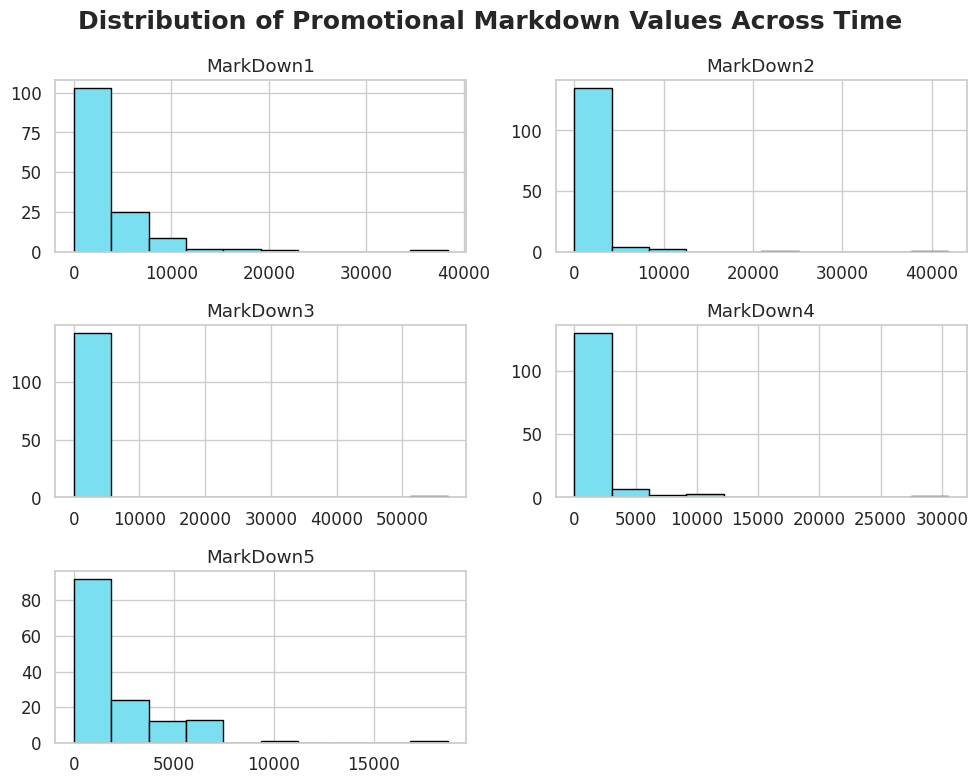

In [268]:
# Frequency distribution of markdown values
sns.set_style("whitegrid")

df_markdown.hist(
    bins=10,
    figsize=(10, 8),
    color='#7bdff2',
    edgecolor='black'
)

# Title and layout
plt.suptitle(
    "Distribution of Promotional Markdown Values Across Time",
    fontsize=18,
    fontweight='bold'
)

plt.tight_layout()
plt.show()


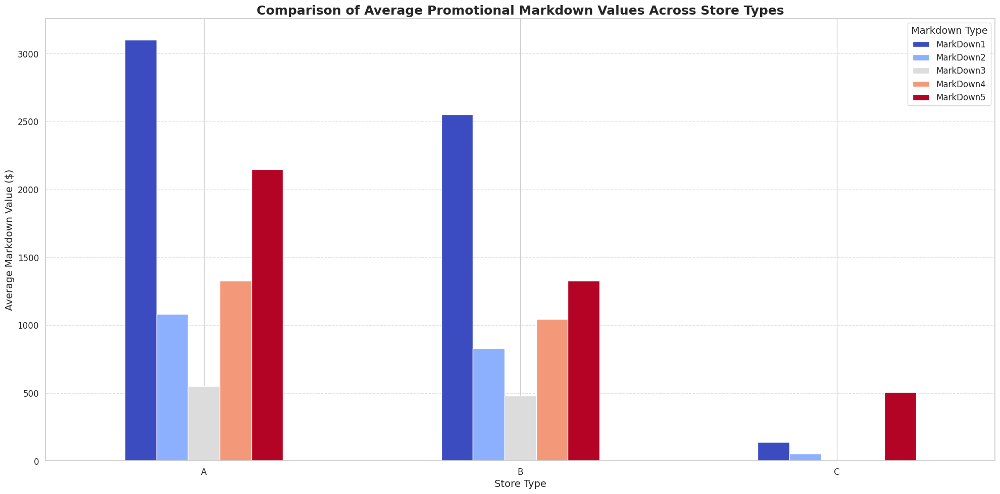

In [269]:
# Aggregate mean markdowns per Store Type
df_markdown_type = df_new.groupby('Type').agg({
    'MarkDown1': 'mean',
    'MarkDown2': 'mean',
    'MarkDown3': 'mean',
    'MarkDown4': 'mean',
    'MarkDown5': 'mean'
})

# Set visualization style
sns.set_style("whitegrid")

# Create plot (color changed)
ax = df_markdown_type.plot(
    kind='bar',
    figsize=(20, 10),
    rot=0,
    colormap='coolwarm'   # <-- color changed here
)

# Labels and title
plt.xlabel("Store Type", fontsize=14)
plt.ylabel("Average Markdown Value ($)", fontsize=14)
plt.title(
    "Comparison of Average Promotional Markdown Values Across Store Types",
    fontsize=18,
    fontweight='bold'
)

# Legend and layout
plt.legend(title='Markdown Type', fontsize=12, title_fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


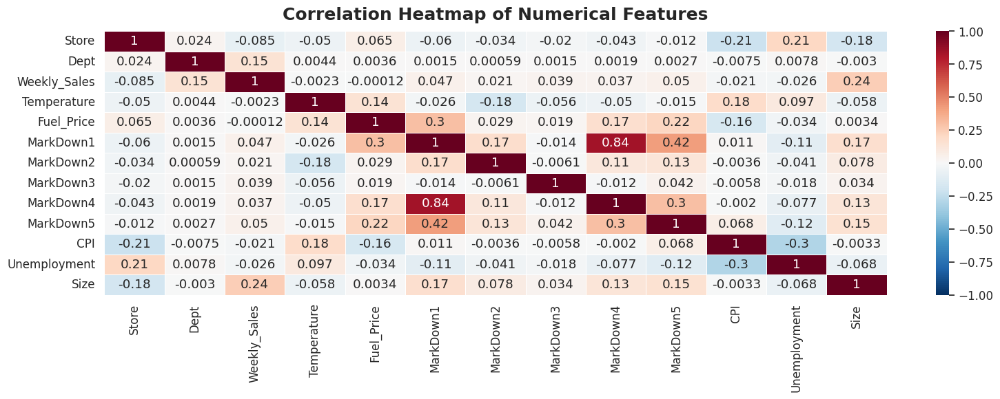

In [270]:
plt.figure(figsize=(16, 6))

# Select only numerical columns for correlation calculation
df_corr = df_new.select_dtypes(include=np.number)

# Heatmap (color changed)
heatmap = sns.heatmap(
    df_corr.corr(),
    vmin=-1,
    vmax=1,
    annot=True,
    cmap='RdBu_r',   # ❁ color changed
    linewidths=0.5
)

# Title
heatmap.set_title(
    "Correlation Heatmap of Numerical Features",
    fontdict={'fontsize': 18, 'fontweight': 'bold'},
    pad=12
)

plt.tight_layout()
plt.show()

# Insight

Weekly sales did not exhibit a strong correlation with the other analyzed variables. A negative correlation was observed between the Consumer Price Index (CPI) and unemployment, suggesting that unemployment tended to decrease as inflation increased during the analyzed period. Additionally, fuel prices and unemployment also showed a negative relationship.


# Date-wise Analysis

In this section, sales trends were analyzed over time to identify date-based patterns and seasonal variations. The sales dataset was first merged with the feature dataset using the Date column to create a unified timeline for analysis. Weekly Sales values were then converted into millions to improve readability and make trend interpretation easier. Additionally, the holiday indicator was refined to clearly distinguish holiday periods from non-holiday periods for better understanding of festive sales behavior.


In [271]:
# Aggregate mean and sum of selected features grouped by Date
data_date = df_new.groupby("Date").agg({
    "Temperature": "mean",      # Average temperature per day
    "Fuel_Price": "mean",       # Average fuel price per day
    "IsHoliday": "sum",         # Total holidays per day (sum used since it's likely binary)
    "CPI": "mean",              # Average CPI per day
    "Unemployment": "mean"      # Average unemployment rate per day
})

# Sort data by Date index to maintain chronological order
data_date = data_date.sort_index()

# Select data up to a cutoff date (December 10, 2012)
temp_date_data = data_date.loc[:'2012-12-10']

# Aggregate total weekly sales grouped by Date
data_sales_date = sales_df.groupby("Date").agg({
    "Weekly_Sales": "sum"       # Sum of weekly sales per date
})

# Sort sales data by Date index
data_sales_date.sort_index(inplace=True)

# Convert sales to millions and cast to integers for easier readability
data_sales_date["Weekly_Sales"] = (data_sales_date["Weekly_Sales"] / 1_000_000).astype(int)

# Merge sales and other feature data on Date index (left join to keep all sales dates)
data = pd.merge(
    data_sales_date,
    temp_date_data,
    left_index=True,
    right_index=True,
    how='left'
)

# Convert 'IsHoliday' sum to boolean: True if sum equals 45 (special case), else False
data["IsHoliday"] = data["IsHoliday"].apply(lambda x: True if x == 45.0 else False)

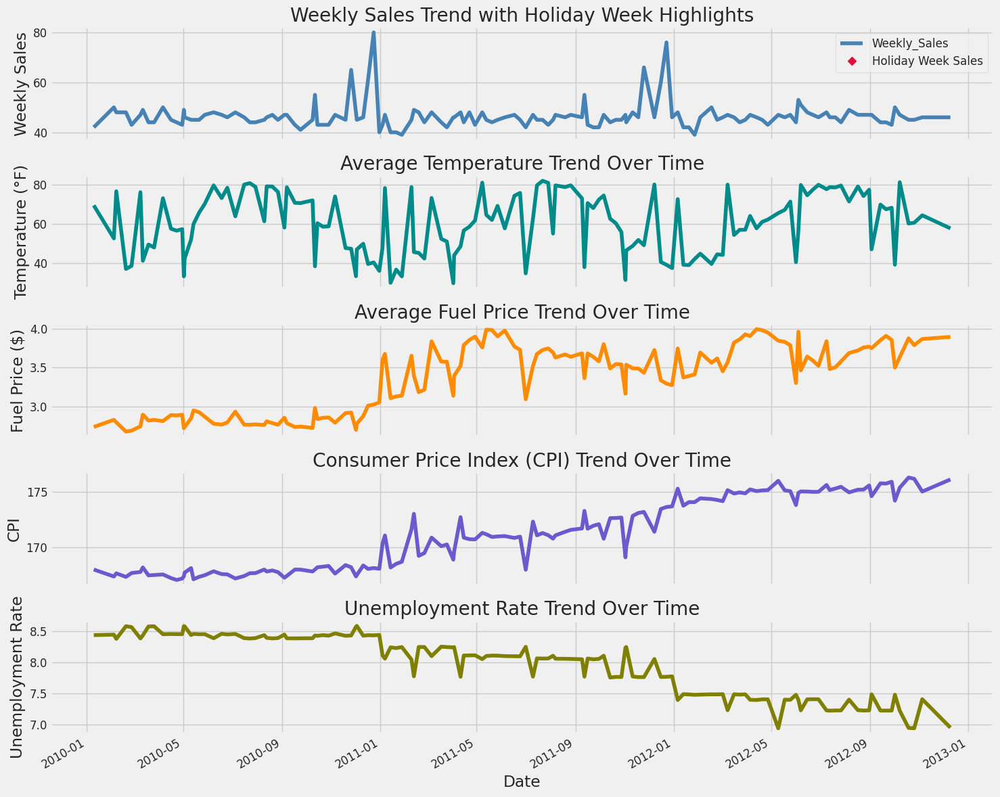

In [272]:
# Style
plt.style.use('fivethirtyeight')

# Create subplots
fig, axes = plt.subplots(5, 1, figsize=(15, 12), sharex=True)

# 1️⃣ Weekly Sales with highlighted Holiday weeks (color changed)
data["Weekly_Sales"].plot(
    ax=axes[0],
    title="Weekly Sales Trend with Holiday Week Highlights",
    color='steelblue'
)

data[data.IsHoliday == True]["Weekly_Sales"].plot(
    marker="D",
    linestyle='',
    ax=axes[0],
    color='crimson',
    label="Holiday Week Sales"
)

axes[0].legend(loc='upper right')
axes[0].set_ylabel("Weekly Sales")

# 2️⃣ Temperature over time (color changed)
data["Temperature"].plot(
    ax=axes[1],
    title="Average Temperature Trend Over Time",
    color='darkcyan'
)
axes[1].set_ylabel("Temperature (°F)")

# 3️⃣ Fuel Price over time (color changed)
data["Fuel_Price"].plot(
    ax=axes[2],
    title="Average Fuel Price Trend Over Time",
    color='darkorange'
)
axes[2].set_ylabel("Fuel Price ($)")

# 4️⃣ CPI over time (color changed)
data["CPI"].plot(
    ax=axes[3],
    title="Consumer Price Index (CPI) Trend Over Time",
    color='slateblue'
)
axes[3].set_ylabel("CPI")

# 5️⃣ Unemployment rate over time (color changed)
data["Unemployment"].plot(
    ax=axes[4],
    title="Unemployment Rate Trend Over Time",
    color='olive'
)
axes[4].set_ylabel("Unemployment Rate")
axes[4].set_xlabel("Date")

# Layout adjustment
plt.tight_layout()
plt.show()


# Key Observations

Weekly sales experience significant spikes during November and December, although sales do not show a steady increase throughout the entire year. Sales activity reaches its peak around holiday periods, demonstrating the strong influence of festive seasons on customer purchasing behavior.

Fuel Price and the Consumer Price Index (CPI) both display a gradual upward trend over the years, reflecting increasing economic costs and inflation. In contrast, unemployment consistently declines year over year, indicating improving employment conditions.

Temperature does not exhibit any clear upward or downward trend and instead fluctuates randomly over time.


# Data Preprocessing and Feature Engineering

Missing values were handled carefully, with special focus on the MarkDown variables to maintain data consistency and improve reliability. Additional meaningful features such as store size, store type, and regional characteristics were also incorporated to strengthen the model’s ability to accurately predict sales performance.


In [273]:
#Merging all the 3 dataset together
sale_store_df = sales_df.merge(store_df, on = 'Store',how='left')
sale_store_df.shape
retail_df = sale_store_df.merge(feature_df, on = ['Store','Date','IsHoliday'],how='left')
retail_df.shape

(421570, 16)

In [274]:
final_df=retail_df.copy()

In [275]:
#Check for missing values
final_df.isnull().sum()

,0
Store,0
Dept,0
Date,0
Weekly_Sales,0
IsHoliday,0
Type,0
Size,0
Temperature,0
Fuel_Price,0
MarkDown1,270889


In [276]:
#Check for duplicate rows
final_df.duplicated().sum()

np.int64(0)

In [277]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 421570 entries, 0 to 421569
Data columns (total 16 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   Store         421570 non-null  int64         
 1   Dept          421570 non-null  int64         
 2   Date          421570 non-null  datetime64[ns]
 3   Weekly_Sales  421570 non-null  float64       
 4   IsHoliday     421570 non-null  bool          
 5   Type          421570 non-null  object        
 6   Size          421570 non-null  int64         
 7   Temperature   421570 non-null  float64       
 8   Fuel_Price    421570 non-null  float64       
 9   MarkDown1     150681 non-null  float64       
 10  MarkDown2     111248 non-null  float64       
 11  MarkDown3     137091 non-null  float64       
 12  MarkDown4     134967 non-null  float64       
 13  MarkDown5     151432 non-null  float64       
 14  CPI           421570 non-null  float64       
 15  Unemployment  421

In [278]:
# Convert dates to datetime objects
final_df['Date'] = pd.to_datetime(final_df['Date'],format='%d/%m/%Y')

In [279]:
final_df.describe()

,Store,Dept,Date,Weekly_Sales,Size,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment
count,421570.000000,421570.000000,421570,421570.000000,421570.000000,421570.000000,421570.000000,150681.000000,111248.000000,137091.000000,134967.000000,151432.000000,421570.000000,421570.000000
mean,22.200546,44.260317,2011-06-19 05:35:51.733757184,15981.258123,136727.915739,60.090059,3.361027,7246.420196,3334.628621,1439.421384,3383.168256,4628.975079,171.201947,7.960289
min,1.000000,1.000000,2010-01-10 00:00:00,-4988.940000,34875.000000,-2.060000,2.472000,0.270000,-265.760000,-29.100000,0.220000,135.160000,126.064000,3.879000
25%,11.000000,18.000000,2010-10-12 00:00:00,2079.650000,93638.000000,46.680000,2.933000,2240.270000,41.600000,5.080000,504.220000,1878.440000,132.022667,6.891000
50%,22.000000,37.000000,2011-06-17 00:00:00,7612.030000,140167.000000,62.090000,3.452000,5347.450000,192.000000,24.600000,1481.310000,3359.450000,182.318780,7.866000
75%,33.000000,74.000000,2012-03-02 00:00:00,20205.852500,202505.000000,74.280000,3.738000,9210.900000,1926.940000,103.990000,3595.040000,5563.800000,212.416993,8.572000
max,45.000000,99.000000,2012-12-10 00:00:00,693099.360000,219622.000000,100.140000,4.468000,88646.760000,104519.540000,141630.610000,67474.850000,108519.280000,227.232807,14.313000
std,12.785297,30.492054,NaN,22711.183519,60980.583328,18.447931,0.458515,8291.221345,9475.357325,9623.078290,6292.384031,5962.887455,39.159276,1.863296


# Data Preparation for Anomaly Detection

## Handling Missing Values

Missing values in the sales data were addressed using appropriate imputation techniques such as mean, median, or interpolation. This ensured data completeness and reduced the risk of bias in the analysis.

## Sales Data Normalization

Sales values were normalized using suitable scaling methods to bring all observations onto a consistent scale, enabling fair comparison and improving model stability.

## Square Root Transformation

A square root transformation was applied to reduce skewness in the sales distribution and stabilize variance across the dataset.

## Anomaly Detection on Weekly Sales

The cleaned, transformed, and normalized dataset was then used for anomaly detection on weekly sales to identify unusual patterns and outliers effectively.

## Outcome

This structured preprocessing pipeline ensured that the anomaly detection model operated on high-quality, consistent data, thereby improving accuracy, robustness, and overall reliability.


#Kernel Density Distributions of Promotional Markdown Features

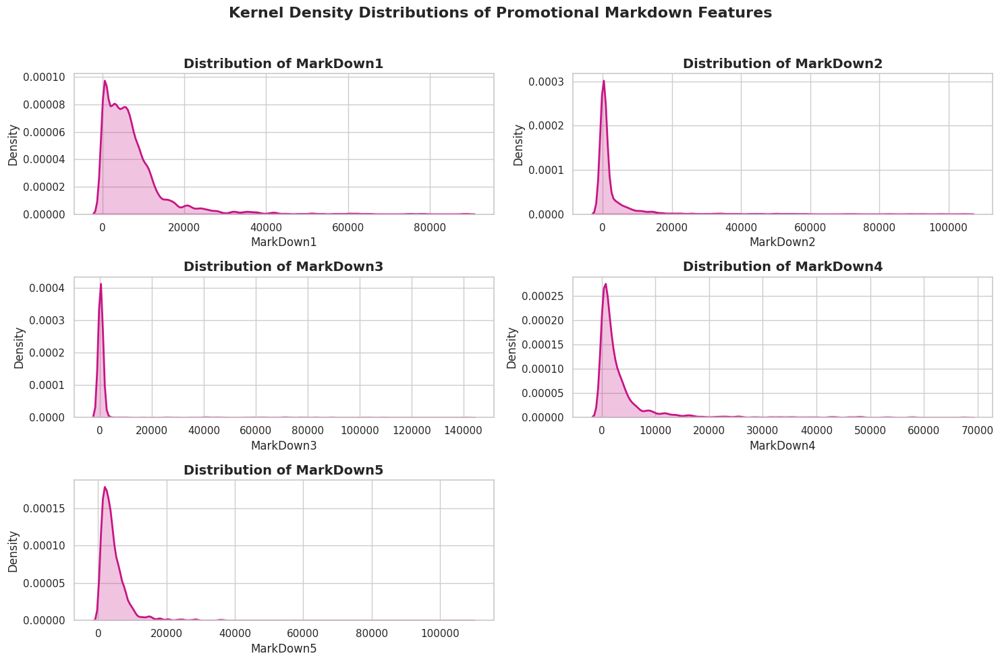

In [280]:
# Define the features to visualize
features = ['MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5']

# Set Seaborn style
sns.set(style="whitegrid")

# Define subplot dimensions
num_features = len(features)
num_cols = 2
num_rows = (num_features + 1) // 2

# Create subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, 10))
axes = axes.flatten()

# Generate KDE plots (color changed)
for i, feature in enumerate(features):
    sns.kdeplot(
        data=final_df,
        x=feature,
        ax=axes[i],
        fill=True,
        color='mediumvioletred',   # 🔁 color changed
        linewidth=2
    )
    axes[i].set_title(
        f'Distribution of {feature}',
        fontsize=14,
        fontweight='bold'
    )
    axes[i].set_xlabel(feature, fontsize=12)
    axes[i].set_ylabel('Density')

# Hide unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Overall title and layout
plt.suptitle(
    "Kernel Density Distributions of Promotional Markdown Features",
    fontsize=16,
    fontweight='bold'
)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


#Combined Histogram and Density Analysis of Promotional Markdown Features

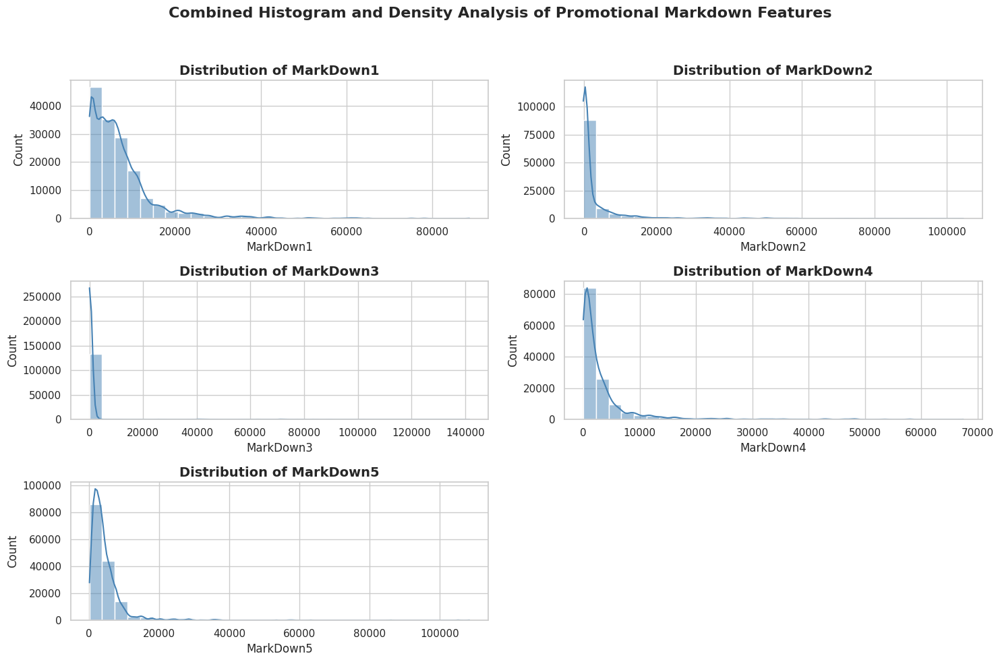

In [281]:
# Set Seaborn style
sns.set(style="whitegrid")

# Features to visualize
features = ['MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5']

# Calculate subplot layout
num_features = len(features)
num_cols = 2
num_rows = (num_features + 1) // 2

# Create subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, 10))
axes = axes.flatten()

# Plot histogram + KDE for each feature (color changed)
for i, feature in enumerate(features):
    sns.histplot(
        data=final_df,
        x=feature,
        kde=True,
        ax=axes[i],
        color='steelblue',   # 🔁 color changed
        bins=30
    )
    axes[i].set_title(
        f'Distribution of {feature}',
        fontsize=14,
        fontweight='bold'
    )
    axes[i].set_xlabel(feature, fontsize=12)
    axes[i].set_ylabel("Count")

# Hide unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Overall title and layout
plt.suptitle(
    "Combined Histogram and Density Analysis of Promotional Markdown Features",
    fontsize=16,
    fontweight='bold'
)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


#Distribution Analysis of Promotional Markdown Features Using Violin Plots

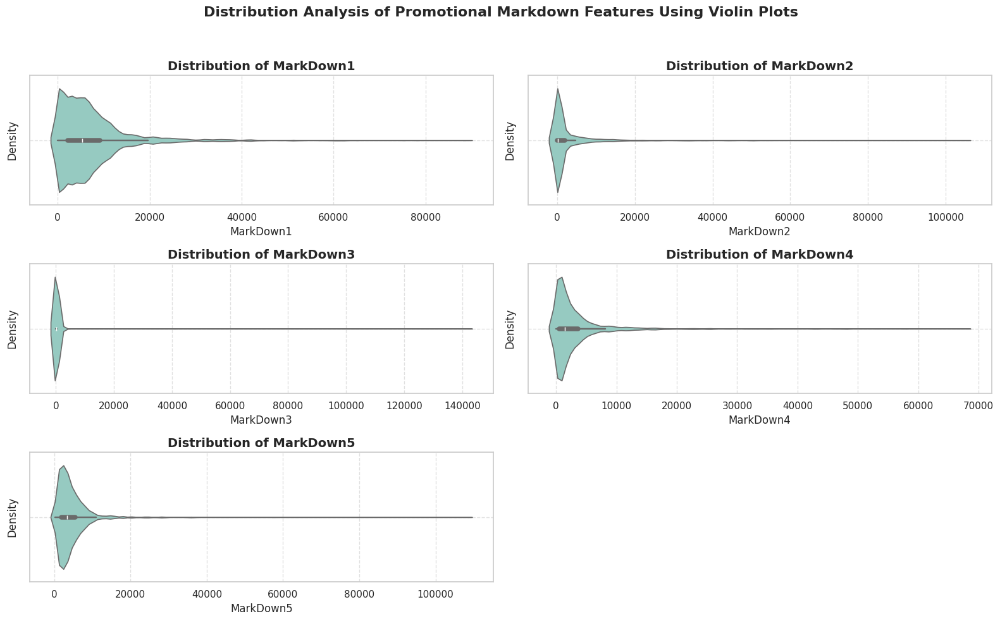

In [282]:
# Set theme for better visuals
sns.set_theme(style="whitegrid")

# Define the Markdown features
features = ['MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5']

# Calculate layout size
num_features = len(features)
num_cols = 2
num_rows = (num_features + 1) // 2

# Set up subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(16, 10))
axes = axes.flatten()

# Plot violin plots (color changed)
for i, feature in enumerate(features):
    sns.violinplot(
        data=final_df,
        x=feature,
        ax=axes[i],
        palette='Set3',   # 🔁 color changed
        inner='box',
        linewidth=1.2
    )
    axes[i].set_title(
        f'Distribution of {feature}',
        fontsize=14,
        fontweight='bold'
    )
    axes[i].set_xlabel(feature, fontsize=12)
    axes[i].set_ylabel('Density')
    axes[i].grid(True, linestyle='--', alpha=0.6)

# Hide unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Overall title and layout
plt.suptitle(
    "Distribution Analysis of Promotional Markdown Features Using Violin Plots",
    fontsize=16,
    fontweight='bold'
)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


# Findings and Approach

## Findings

Histogram analysis shows that the Markdown features are not normally distributed and instead exhibit a right-skewed pattern. In addition, boxplot analysis reveals the presence of outliers, which account for approximately 5–8% of the total records.

## Approach

Outlier removal using the Interquartile Range (IQR) method was avoided, as it would eliminate nearly 10% of the dataset, leading to significant data loss and reduced training effectiveness.

Instead, a more robust strategy was adopted by using median-based imputation for handling missing values. The median is less sensitive to extreme values compared to the mean, making it a more stable choice for skewed distributions.

## Outcome

This approach helps stabilize the Markdown feature distribution, reduces the impact of outliers, and improves the overall robustness and reliability of the model.


**Data Handling**

In [283]:
from sklearn.preprocessing import StandardScaler

# Step 1: Handle Missing Values (Impute with Mean)
median_markdown1 = final_df['MarkDown1'].median()
median_markdown2 = final_df['MarkDown2'].median()
median_markdown3 = final_df['MarkDown3'].median()
median_markdown4 = final_df['MarkDown4'].median()
median_markdown5 = final_df['MarkDown5'].median()

final_df['MarkDown1'].fillna(median_markdown1, inplace=True)
final_df['MarkDown2'].fillna(median_markdown2, inplace=True)
final_df['MarkDown3'].fillna(median_markdown3, inplace=True)
final_df['MarkDown4'].fillna(median_markdown4, inplace=True)
final_df['MarkDown5'].fillna(median_markdown5, inplace=True)

In [284]:
final_df.isnull().sum()

,0
Store,0
Dept,0
Date,0
Weekly_Sales,0
IsHoliday,0
Type,0
Size,0
Temperature,0
Fuel_Price,0
MarkDown1,0


**Markdowns after handling missing values**

#Kernel Density Estimation (KDE) of Promotional Markdown Features

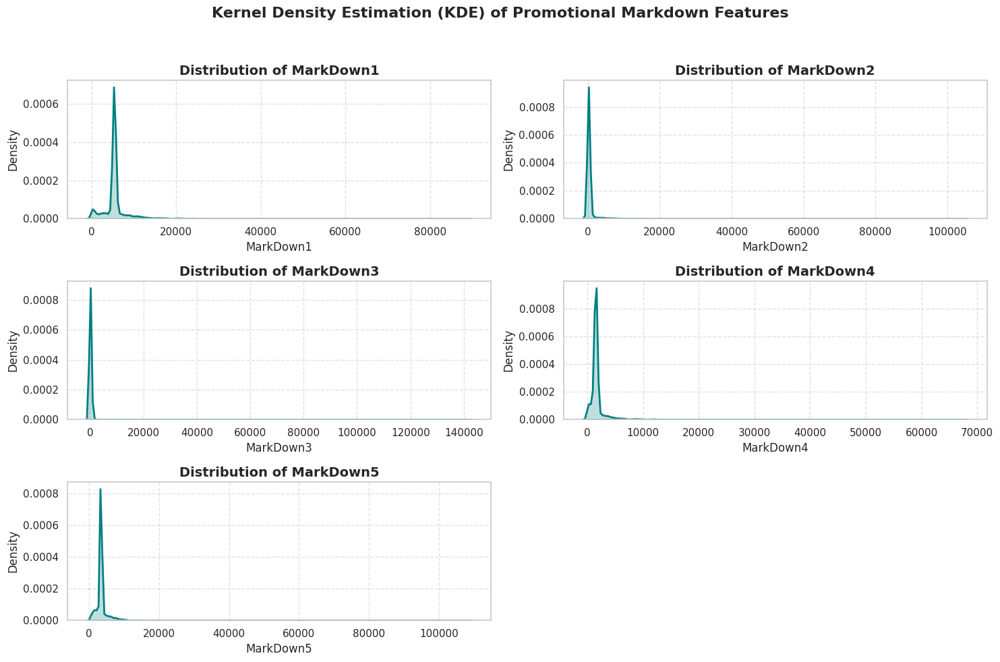

In [285]:
# Set Seaborn style
sns.set_theme(style="whitegrid")

# Features to visualize
features = ['MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5']

# Determine layout
num_features = len(features)
num_cols = 2
num_rows = (num_features + 1) // 2

# Create subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, 10))
axes = axes.flatten()

# Plot KDE for each feature (color changed)
for i, feature in enumerate(features):
    sns.kdeplot(
        data=final_df,
        x=feature,
        ax=axes[i],
        fill=True,
        color='teal',   # 🔁 color changed
        linewidth=2
    )
    axes[i].set_title(
        f'Distribution of {feature}',
        fontsize=14,
        fontweight='bold'
    )
    axes[i].set_xlabel(feature, fontsize=12)
    axes[i].set_ylabel("Density")
    axes[i].grid(True, linestyle='--', alpha=0.6)

# Hide unused axes
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Overall title
plt.suptitle(
    "Kernel Density Estimation (KDE) of Promotional Markdown Features",
    fontsize=16,
    fontweight='bold'
)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


#Combined Histogram and Density Analysis of Promotional Markdown Features

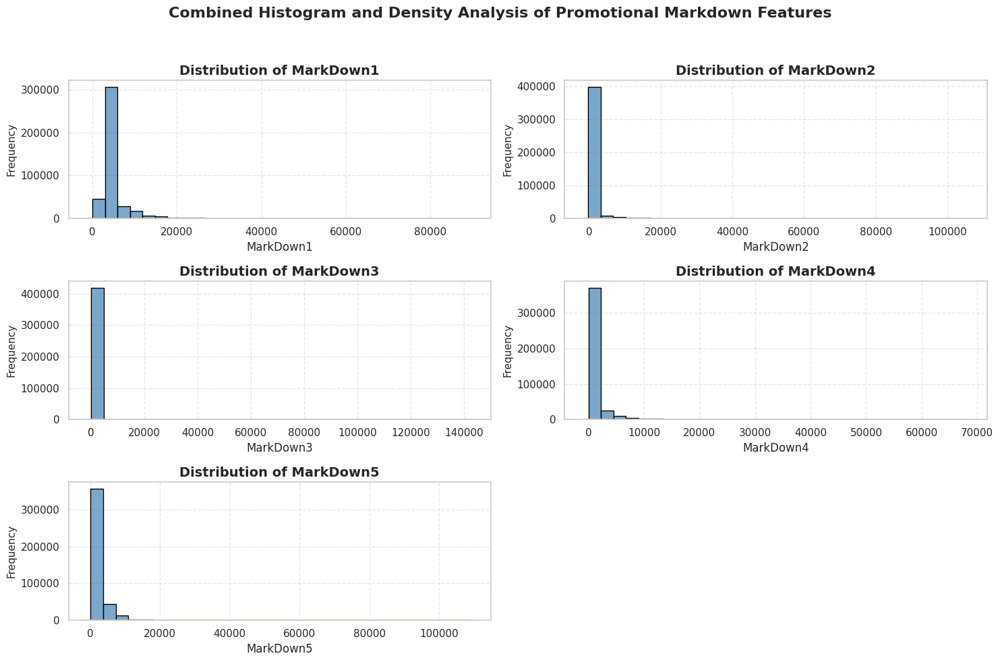

In [286]:
# Set theme
sns.set_theme(style="whitegrid")

# Define the features to visualize
features = ['MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5']

# Layout configuration
num_features = len(features)
num_cols = 2
num_rows = (num_features + 1) // num_cols

# Create subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, 10))
axes = axes.flatten()

# Plot histograms with KDE overlay (colors changed)
for i, feature in enumerate(features):
    sns.histplot(
        data=final_df,
        x=feature,
        ax=axes[i],
        bins=30,
        color='steelblue',     # 🔁 changed
        edgecolor='black',
        alpha=0.7
    )

    sns.kdeplot(
        data=final_df,
        x=feature,
        ax=axes[i],
        color='darkorange',    # 🔁 changed
        linewidth=2
    )

    axes[i].set_title(
        f'Distribution of {feature}',
        fontsize=14,
        fontweight='bold'
    )
    axes[i].set_xlabel(feature, fontsize=12)
    axes[i].set_ylabel("Frequency", fontsize=11)
    axes[i].grid(True, linestyle='--', alpha=0.5)

# Remove unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Overall title
plt.suptitle(
    "Combined Histogram and Density Analysis of Promotional Markdown Features",
    fontsize=16,
    fontweight='bold'
)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


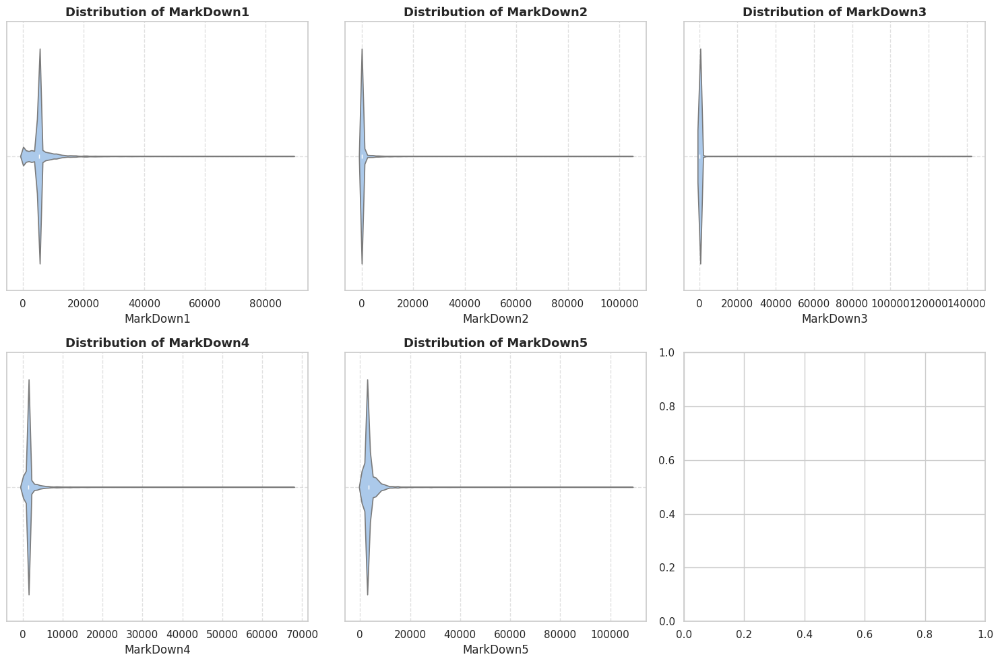

In [287]:
# Set Seaborn theme
sns.set_theme(style="whitegrid")

# Define the features for violin plots
features = ['MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5']

# Calculate layout
num_features = len(features)
num_rows = num_features // 2
num_cols = 2 if num_features % 2 == 0 else 3

# Set up subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, 10))

# Flatten axes if needed
if num_rows > 1:
    axes = axes.flatten()

# Create violin plots
for i, feature in enumerate(features):
    sns.violinplot(
        data=final_df,
        x=feature,
        ax=axes[i],
        palette='pastel',      # 🔁 color refined
        inner='box',
        linewidth=1.2
    )
    axes[i].set_title(
        f'Distribution of {feature}',
        fontsize=13,
        fontweight='bold'
    )
    axes[i].set_xlabel(feature)
    axes[i].grid(True, linestyle='--', alpha=0.6)

# Adjust layout
plt.tight_layout()
plt.show()


# Normalize Sales Data

Normalization is applied to ensure that all sales values are brought onto a consistent scale, improving comparability across observations and enhancing overall model performance.

To manage anomalous data points, data transformation techniques are used to reduce the impact of extreme values and bring them within a more stable and interpretable range. One commonly used method is standardization, where sales data is transformed to have a mean of 0 and a standard deviation of 1. This process helps normalize the distribution, minimizes the influence of outliers, and improves interpretability for both statistical analysis and machine learning models.


In [288]:
# Step 2: Normalize Sales Data (Standardization)
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

# Reshape the column to a 2D array and apply min-max scaling
final_df['Weekly_Sales_normalized'] = scaler.fit_transform(final_df['Weekly_Sales'].values.reshape(-1, 1))

# Square Root Transformation to Handle Skewness

Skewed data distributions deviate from normality, meaning the values are not symmetrically distributed around the mean. Such distributions often contain a long tail of extreme values that can distort analysis and hide meaningful patterns.

The square root transformation is an effective technique for addressing right-skewed data, especially when the dataset includes zero or small positive values. It reduces skewness by compressing larger values while preserving the relative differences among smaller observations.

By applying this transformation, the variance becomes more stable and the distribution more symmetric, which in turn improves the performance and interpretability of statistical and machine learning models.


In [289]:
final_df['Sales_sqrt'] = final_df['Weekly_Sales_normalized'].apply(lambda x: x ** 0.5)
final_df.head(2)

,Store,Dept,Date,Weekly_Sales,IsHoliday,Type,Size,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,Weekly_Sales_normalized,Sales_sqrt
0,1,1,2010-05-02,24924.50,False,A,151315,42.31,2.572,5347.45,192.0,24.6,1481.31,3359.45,211.096358,8.106,0.042851,0.207004
1,1,1,2010-12-02,46039.49,True,A,151315,38.51,2.548,5347.45,192.0,24.6,1481.31,3359.45,211.242170,8.106,0.073097,0.270365


In [290]:
from scipy.stats import skew

# Calculate skewness of a column 'data_column'
skewness = skew(final_df['Sales_sqrt'])
print("Skewness:", skewness)

Skewness: 1.5372648545920218


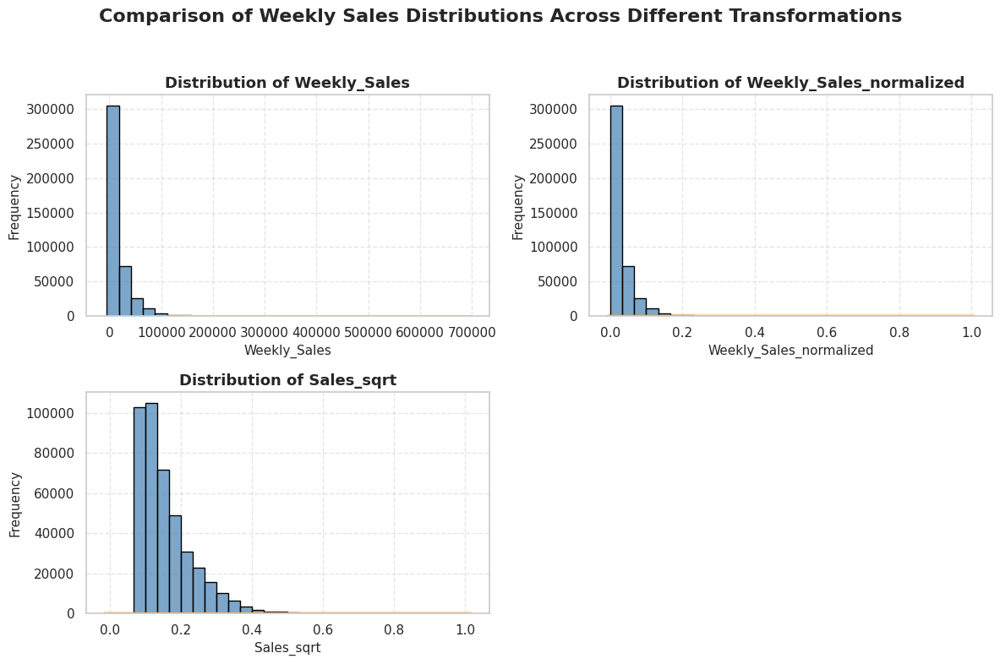

In [291]:
# Features to plot
features = ['Weekly_Sales', 'Weekly_Sales_normalized', 'Sales_sqrt']

# Set up layout
num_features = len(features)
num_cols = 2
num_rows = (num_features + 1) // num_cols

# Set visual theme
sns.set_style("whitegrid")

# Create subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(12, 8))
axes = axes.flatten()

# Plot histograms with KDE overlay
for i, feature in enumerate(features):
    sns.histplot(
        data=final_df,
        x=feature,
        ax=axes[i],
        bins=30,
        color='steelblue',     # 🔁 color changed
        edgecolor='black',
        alpha=0.7
    )

    sns.kdeplot(
        data=final_df,
        x=feature,
        ax=axes[i],
        color='darkorange',    # 🔁 color changed
        linewidth=2
    )

    axes[i].set_title(
        f'Distribution of {feature}',
        fontsize=13,
        fontweight='bold'
    )
    axes[i].set_xlabel(feature, fontsize=11)
    axes[i].set_ylabel("Frequency", fontsize=11)
    axes[i].grid(True, linestyle='--', alpha=0.5)

# Remove empty subplots if any
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Improved overall title
plt.suptitle(
    "Comparison of Weekly Sales Distributions Across Different Transformations",
    fontsize=16,
    fontweight='bold'
)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


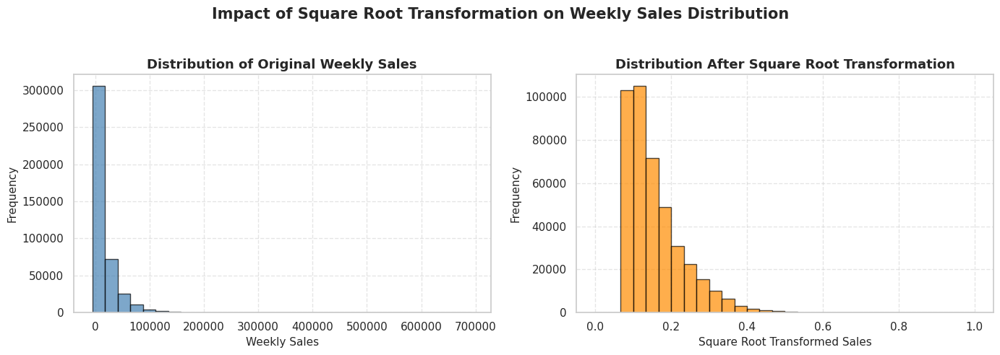

In [292]:
# Set visual style
sns.set_style("whitegrid")

# Create a 1x2 subplot for side-by-side comparison
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Original Weekly Sales distribution (color changed)
axes[0].hist(
    final_df['Weekly_Sales'],
    bins=30,
    color='steelblue',      # 🔁 changed
    edgecolor='black',
    alpha=0.7
)
axes[0].set_title(
    "Distribution of Original Weekly Sales",
    fontsize=13,
    fontweight='bold'
)
axes[0].set_xlabel("Weekly Sales", fontsize=11)
axes[0].set_ylabel("Frequency", fontsize=11)
axes[0].grid(True, linestyle='--', alpha=0.5)

# Square Root Transformed distribution (color changed)
axes[1].hist(
    final_df['Sales_sqrt'],
    bins=30,
    color='darkorange',     # 🔁 changed
    edgecolor='black',
    alpha=0.7
)
axes[1].set_title(
    "Distribution After Square Root Transformation",
    fontsize=13,
    fontweight='bold'
)
axes[1].set_xlabel("Square Root Transformed Sales", fontsize=11)
axes[1].set_ylabel("Frequency", fontsize=11)
axes[1].grid(True, linestyle='--', alpha=0.5)

# Improved overall title
plt.suptitle(
    "Impact of Square Root Transformation on Weekly Sales Distribution",
    fontsize=15,
    fontweight='bold'
)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


# Anomaly Detection in Sales Data

Sales data across stores and departments is analyzed to identify unusual or unexpected patterns in performance. Detected anomalies are further examined to understand their possible causes, including holiday effects, markdown events, or changes in economic conditions.

Appropriate anomaly-handling techniques are applied to ensure the dataset remains reliable and suitable for downstream analysis and modeling.

## Mitigation Strategies

Instead of removing anomalous observations, the following approaches are used to reduce their impact while preserving important information:

* **Data Cleaning:** Inconsistencies and errors are identified and corrected using manual checks or automated validation methods.
* **Data Normalization:** Data is transformed into a consistent scale to stabilize distributions, making anomalies less influential on model outcomes.
* **Data Imputation:** Missing values are handled using statistical or machine learning–based imputation techniques to maintain dataset completeness and integrity.


# Descriptive Statistics for Anomaly Detection

Descriptive statistics are among the most fundamental techniques used for anomaly detection in retail data analysis. Measures such as mean, median, and standard deviation are used to summarize the data and understand its overall distribution.

These summary statistics help in identifying point anomalies by highlighting values that significantly deviate from the expected range of normal behavior.


In [293]:
# Calculate mean and standard deviation
mean_sales = np.mean(final_df['Sales_sqrt'])
std_deviation = np.std(final_df['Sales_sqrt'])

# Set a threshold for flagging anomalies (e.g., 3 standard deviations from the mean)
threshold = mean_sales + 3 * std_deviation

# Identify anomalies
anomalies = [data_point for data_point in final_df['Sales_sqrt'] if data_point > threshold]

#If the data point exceeds the threshold, it assigns a value of 1 (indicating an anomaly), otherwise it assigns a value of 0.
final_df['Anomaly'] = [1 if data_point > threshold else 0 for data_point in final_df['Sales_sqrt']]

print("Retail Weekly Sales Data:")
print("Mean Sales:", mean_sales)
print("Standard Deviation:", std_deviation)
print("Anomalies (2 standard deviations from the mean)-Total number of Anomalies in Weekly Sales :", len(anomalies))
print("Total number of Anomalies in Weekly Sales (percentage-wise) :", round((len(anomalies)/len(sales_df))*100,2))

#Flagged anomalies in Sales dataset

print("Anomalies in Weekly_Sales:",final_df[final_df['Anomaly']==1].shape[0])

Retail Weekly Sales Data:
Mean Sales: 0.1569383540371942
Standard Deviation: 0.07355145612450474
Anomalies (2 standard deviations from the mean)-Total number of Anomalies in Weekly Sales : 6155
Total number of Anomalies in Weekly Sales (percentage-wise) : 1.46
Anomalies in Weekly_Sales: 6155


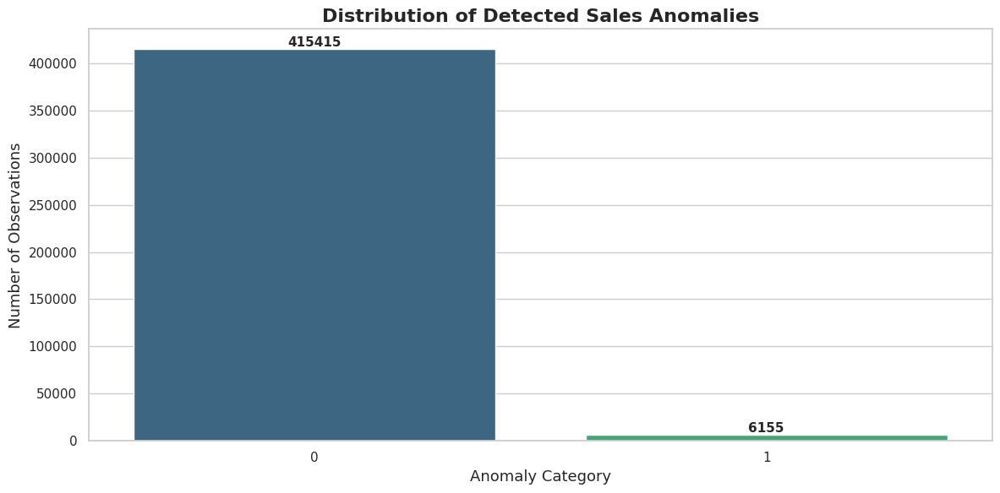

In [294]:
# Set visual style
sns.set_style("whitegrid")

# Set figure size
plt.figure(figsize=(12, 6))

# Create the barplot for Anomaly value counts (color changed)
ax = sns.barplot(
    x=final_df['Anomaly'].value_counts().index,
    y=final_df['Anomaly'].value_counts().values,
    palette='viridis'   # 🔁 color changed
)

# Add data labels above each bar
for p in ax.patches:
    ax.annotate(
        f'{int(p.get_height())}',
        (p.get_x() + p.get_width() / 2., p.get_height()),
        ha='center',
        va='bottom',
        fontsize=11,
        fontweight='bold'
    )

# Improved title and labels
ax.set_title(
    "Distribution of Detected Sales Anomalies",
    fontsize=16,
    fontweight='bold'
)
ax.set_xlabel("Anomaly Category", fontsize=13)
ax.set_ylabel("Number of Observations", fontsize=13)

# Layout adjustment
plt.tight_layout()
plt.show()


# Potential Causes of Anomalies in Weekly Sales

## Comparative Analysis of Features with Respect to Anomalies

To identify the drivers of anomalous behavior in weekly sales, key influencing features are analyzed in relation to detected anomalies. This comparative approach helps determine whether unusual sales patterns are driven by internal operational factors or external economic conditions.

## Role of Unemployment in Sales Anomalies

Unemployment is evaluated as a potential factor contributing to anomalies in weekly sales. Changes in unemployment levels can significantly impact consumer purchasing power and spending behavior. Periods of higher unemployment may align with sudden declines in sales, while decreasing unemployment may be associated with unexpected sales increases. Studying this relationship helps assess whether fluctuations in employment conditions are linked to abnormal sales behavior.


In [295]:
len(final_df[(final_df['Anomaly']==1) & (final_df['Unemployment']>=final_df['Unemployment'].mean())])*100/len(final_df[(final_df['Anomaly']==1)])

42.17709179528838

In [296]:
len(final_df[(final_df['Anomaly']==1) & (final_df['Unemployment']<=final_df['Unemployment'].mean())])*100/len(final_df[(final_df['Anomaly']==1)])

57.82290820471162

# Assessing the Relationship Between Consumer Price Index (CPI) and Sales Anomalies

The Consumer Price Index (CPI) is analyzed to evaluate its potential relationship with anomalies in weekly sales. Since CPI represents changes in the overall price level, it can indirectly influence consumer purchasing behavior and spending patterns.

This analysis compares CPI trends during both anomalous and non-anomalous periods to determine whether inflationary fluctuations align with unusual variations in sales. The focus is not on establishing causality, but on identifying whether CPI movements correspond with observed sales anomalies and contribute to abnormal sales behavior.


In [297]:
len(final_df[(final_df['Anomaly']==1) & (final_df['CPI']>=final_df['CPI'].mean())])*100/len(final_df[(final_df['Anomaly']==1)])

52.948822095857025

In [298]:
len(final_df[(final_df['Anomaly']==1) & (final_df['CPI']<=final_df['CPI'].mean())])*100/len(final_df[(final_df['Anomaly']==1)])

47.051177904142975

# Assessing the Impact of Fuel Price on Sales Anomalies

Fuel price is analyzed to determine its potential influence on anomalies observed in weekly sales. The objective is to explore possible associations between fluctuations in fuel prices and abnormal sales patterns, without assuming a direct causal relationship.

By comparing fuel price trends during both anomalous and non-anomalous periods, the analysis evaluates whether changes in fuel costs align with unusual variations in weekly sales behavior.


In [299]:
len(final_df[(final_df['Anomaly']==1) & (final_df['Fuel_Price']>=final_df['Fuel_Price'].mean())])*100/len(final_df[(final_df['Anomaly']==1)])

51.616571892770104

In [300]:
len(final_df[(final_df['Anomaly']==1) & (final_df['Fuel_Price']<=final_df['Fuel_Price'].mean())])*100/len(final_df[(final_df['Anomaly']==1)])

48.383428107229896

# Assessing the Relationship Between Temperature and Sales Anomalies

Temperature is analyzed to evaluate its potential association with anomalies in weekly sales. Since variations in temperature can influence consumer behavior and seasonal demand, they may contribute to unexpected fluctuations in sales patterns.

This analysis compares temperature trends during both anomalous and non-anomalous periods to determine whether extreme or irregular temperature changes align with abnormal sales variations. The objective is to identify potential relationships rather than establish direct causality.
.

In [301]:
len(final_df[(final_df['Anomaly']==1) & (final_df['Temperature']>=final_df['Temperature'].mean())])*100/len(final_df[(final_df['Anomaly']==1)])

48.80584890333063

In [302]:
len(final_df[(final_df['Anomaly']==1) & (final_df['Temperature']<=final_df['Temperature'].mean())])*100/len(final_df[(final_df['Anomaly']==1)])

51.19415109666937

# Assessing the Relationship Between Store Size and Sales Anomalies

Store size is analyzed to determine its potential association with anomalies observed in weekly sales. Generally, larger stores tend to have higher sales capacity, while smaller stores may show greater volatility due to lower transaction volumes.

This analysis compares sales anomalies across different store size categories to assess whether unusual sales patterns are more frequently observed in specific store segments. The focus is on identifying possible associations rather than establishing direct causality between store size and sales anomalies.


In [303]:
len(final_df[(final_df['Anomaly']==1) & (final_df['Size']>=final_df['Size'].mean())])*100/len(final_df[(final_df['Anomaly']==1)])

86.4987814784728

In [304]:
len(final_df[(final_df['Anomaly']==1) & (final_df['Size']<=final_df['Size'].mean())])*100/len(final_df[(final_df['Anomaly']==1)])

13.501218521527214

# Assessing the Relationship Between Holidays and Sales Anomalies

Holiday periods are analyzed to evaluate their potential association with anomalies in weekly sales. Since holidays often influence consumer purchasing behavior, they can lead to unusually high or low sales compared to regular weeks.

This analysis compares sales patterns during holiday and non-holiday periods to determine whether anomalies occur more frequently around festive or seasonal events. The focus is on identifying possible associations between holidays and abnormal sales behavior, without assuming direct causality.


In [305]:
len(final_df[(final_df['Anomaly']==1) & (final_df['IsHoliday']==True)])*100/len(final_df[(final_df['Anomaly']==1)])

9.033306255077173

In [306]:
len(final_df[(final_df['Anomaly']==1) & (final_df['IsHoliday']==False)])*100/len(final_df[(final_df['Anomaly']==1)])

90.96669374492282

# Assessing the Relationship Between MarkDown1 and Sales Anomalies

MarkDown1 is analyzed to evaluate its potential association with anomalies observed in weekly sales. Since markdowns influence pricing and consumer demand, they can significantly affect purchasing behavior and sales fluctuations.

This analysis compares MarkDown1 levels during anomalous and non-anomalous sales periods to determine whether higher or irregular markdown activity aligns with unusual changes in weekly sales. The objective is to identify possible associations rather than establish direct causality between markdowns and sales anomalies.


In [307]:
len(final_df[(final_df['Anomaly']==1) & (final_df['MarkDown1']>=final_df['MarkDown1'].mean())])*100/len(final_df[(final_df['Anomaly']==1)])

22.274573517465477

In [308]:
len(final_df[(final_df['Anomaly']==1) & (final_df['MarkDown1']<=final_df['MarkDown1'].mean())])*100/len(final_df[(final_df['Anomaly']==1)])

77.72542648253453

# Assessing the Relationship Between MarkDown2 and Sales Anomalies

MarkDown2 is analyzed to evaluate its potential association with anomalies observed in weekly sales. As a promotional pricing factor, MarkDown2 can influence customer demand and contribute to fluctuations in sales volumes.

This analysis compares MarkDown2 levels during anomalous and non-anomalous periods to assess whether variations in markdown intensity align with abnormal sales behavior. The focus is on identifying possible associations rather than establishing direct causality.


In [309]:
len(final_df[(final_df['Anomaly']==1) & (final_df['MarkDown2']>=final_df['MarkDown2'].mean())])*100/len(final_df[(final_df['Anomaly']==1)])

9.277010560519903

In [310]:
len(final_df[(final_df['Anomaly']==1) & (final_df['MarkDown2']<=final_df['MarkDown2'].mean())])*100/len(final_df[(final_df['Anomaly']==1)])

90.7229894394801

# Assessing the Relationship Between MarkDown3 and Sales Anomalies

MarkDown3 is analyzed to evaluate its potential association with anomalies observed in weekly sales. As a promotional pricing variable, MarkDown3 may influence customer purchasing behavior and contribute to irregular fluctuations in sales patterns.

This assessment compares MarkDown3 values during anomalous and non-anomalous periods to determine whether changes in markdown intensity align with abnormal variations in weekly sales. The objective is to identify possible relationships rather than establish direct causation.


In [311]:
len(final_df[(final_df['Anomaly']==1) & (final_df['MarkDown3']>=final_df['MarkDown3'].mean())])*100/len(final_df[(final_df['Anomaly']==1)])

7.733549959382616

In [312]:
len(final_df[(final_df['Anomaly']==1) & (final_df['MarkDown3']<=final_df['MarkDown3'].mean())])*100/len(final_df[(final_df['Anomaly']==1)])

92.26645004061739

# Assessing the Relationship Between MarkDown4 and Sales Anomalies

MarkDown4 is analyzed to evaluate its potential association with anomalies observed in weekly sales. As a promotional markdown variable, it may influence customer purchasing behavior and contribute to unexpected fluctuations in sales performance.

This analysis compares MarkDown4 levels during anomalous and non-anomalous periods to determine whether variations in markdown activity align with abnormal weekly sales patterns. The focus is on identifying potential relationships rather than establishing direct causation.


In [313]:
len(final_df[(final_df['Anomaly']==1) & (final_df['MarkDown4']>=final_df['MarkDown4'].mean())])*100/len(final_df[(final_df['Anomaly']==1)])

18.44029244516653

In [314]:
len(final_df[(final_df['Anomaly']==1) & (final_df['MarkDown4']<=final_df['MarkDown4'].mean())])*100/len(final_df[(final_df['Anomaly']==1)])

81.55970755483347

# Assessing the Relationship Between MarkDown5 and Sales Anomalies

MarkDown5 is analyzed to evaluate its potential association with anomalies observed in weekly sales. As a promotional pricing factor, MarkDown5 may influence customer demand and contribute to irregular fluctuations in sales patterns.

This analysis compares MarkDown5 values during anomalous and non-anomalous periods to assess whether variations in markdown intensity align with abnormal changes in weekly sales. The objective is to identify possible relationships rather than infer direct causality.


In [315]:
len(final_df[(final_df['Anomaly']==1) & (final_df['MarkDown5']>=final_df['MarkDown5'].mean())])*100/len(final_df[(final_df['Anomaly']==1)])

24.06173842404549

In [316]:
len(final_df[(final_df['Anomaly']==1) & (final_df['MarkDown5']<=final_df['MarkDown5'].mean())])*100/len(final_df[(final_df['Anomaly']==1)])

75.93826157595451

In [317]:
df_anomalies=final_df[(final_df['Anomaly']==1)].reset_index(drop=True)
df_anomalies.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday,Type,Size,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,Weekly_Sales_normalized,Sales_sqrt,Anomaly
0,1,7,2010-12-17,96198.12,False,A,151315,49.84,2.869,5347.45,192.00,24.6,1481.31,3359.45,211.405312,7.838,0.144949,0.380721,1
1,1,7,2010-12-24,166697.72,False,A,151315,52.33,2.886,5347.45,192.00,24.6,1481.31,3359.45,211.405122,7.838,0.245938,0.495922,1
2,1,7,2011-12-23,119302.15,False,A,151315,47.96,3.112,2725.36,40.48,634.7,24.90,2739.43,219.357722,7.866,0.178045,0.421954,1
3,1,38,2010-05-02,115564.35,False,A,151315,42.31,2.572,5347.45,192.00,24.6,1481.31,3359.45,211.096358,8.106,0.172691,0.415561,1
4,1,38,2010-02-19,98672.59,False,A,151315,39.93,2.514,5347.45,192.00,24.6,1481.31,3359.45,211.289143,8.106,0.148493,0.385348,1


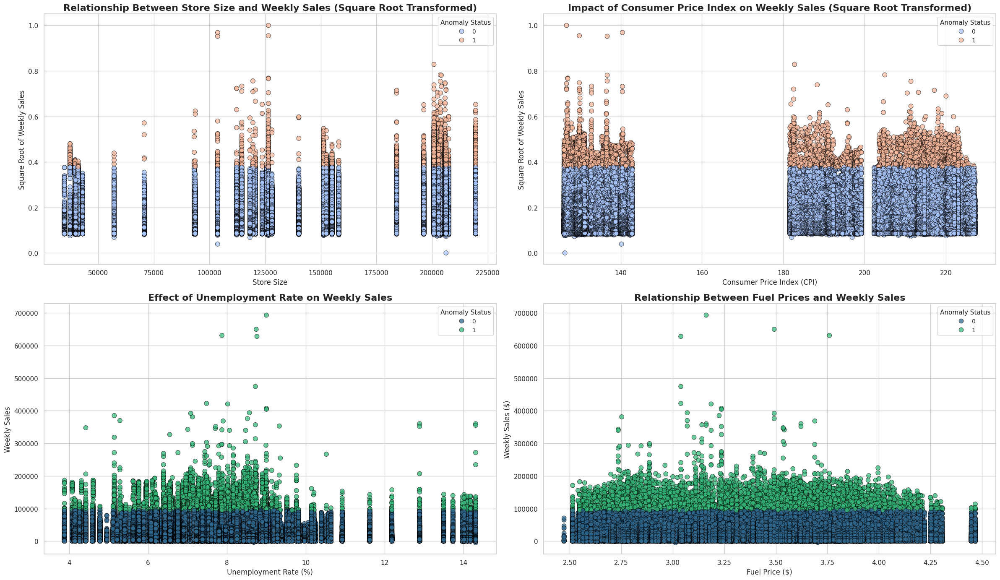

In [318]:
# Set seaborn style
sns.set(style="whitegrid")

# Set up the figure with subplots
fig, axes = plt.subplots(2, 2, figsize=(24, 14))
axes = axes.flatten()

# Common scatter settings (color changed)
scatter_kws = {
    'data': final_df,
    'hue': 'Anomaly',
    'palette': 'coolwarm',   # 🔁 changed
    's': 60,
    'alpha': 0.75,
    'edgecolor': 'black'
}

# Plot 1: Store Size vs Sales (Sqrt)
sns.scatterplot(x='Size', y='Sales_sqrt', ax=axes[0], **scatter_kws)
axes[0].set_title(
    'Relationship Between Store Size and Weekly Sales (Square Root Transformed)',
    fontsize=16,
    fontweight='bold'
)
axes[0].set_xlabel('Store Size', fontsize=12)
axes[0].set_ylabel('Square Root of Weekly Sales', fontsize=12)

# Plot 2: CPI vs Sales (Sqrt)
sns.scatterplot(x='CPI', y='Sales_sqrt', ax=axes[1], **scatter_kws)
axes[1].set_title(
    'Impact of Consumer Price Index on Weekly Sales (Square Root Transformed)',
    fontsize=16,
    fontweight='bold'
)
axes[1].set_xlabel('Consumer Price Index (CPI)', fontsize=12)
axes[1].set_ylabel('Square Root of Weekly Sales', fontsize=12)

# Plot 3: Unemployment vs Weekly Sales (palette changed)
scatter_kws['palette'] = 'viridis'   # 🔁 changed
sns.scatterplot(x='Unemployment', y='Weekly_Sales', ax=axes[2], **scatter_kws)
axes[2].set_title(
    'Effect of Unemployment Rate on Weekly Sales',
    fontsize=16,
    fontweight='bold'
)
axes[2].set_xlabel('Unemployment Rate (%)', fontsize=12)
axes[2].set_ylabel('Weekly Sales', fontsize=12)

# Plot 4: Fuel Price vs Weekly Sales
sns.scatterplot(x='Fuel_Price', y='Weekly_Sales', ax=axes[3], **scatter_kws)
axes[3].set_title(
    'Relationship Between Fuel Prices and Weekly Sales',
    fontsize=16,
    fontweight='bold'
)
axes[3].set_xlabel('Fuel Price ($)', fontsize=12)
axes[3].set_ylabel('Weekly Sales ($)', fontsize=12)

# Legends
for ax in axes:
    ax.legend(title='Anomaly Status', title_fontsize=11, fontsize=10, loc='best')

# Layout
plt.tight_layout()
plt.show()


#Time-Series Analysis of Weekly Sales with Anomaly Detection

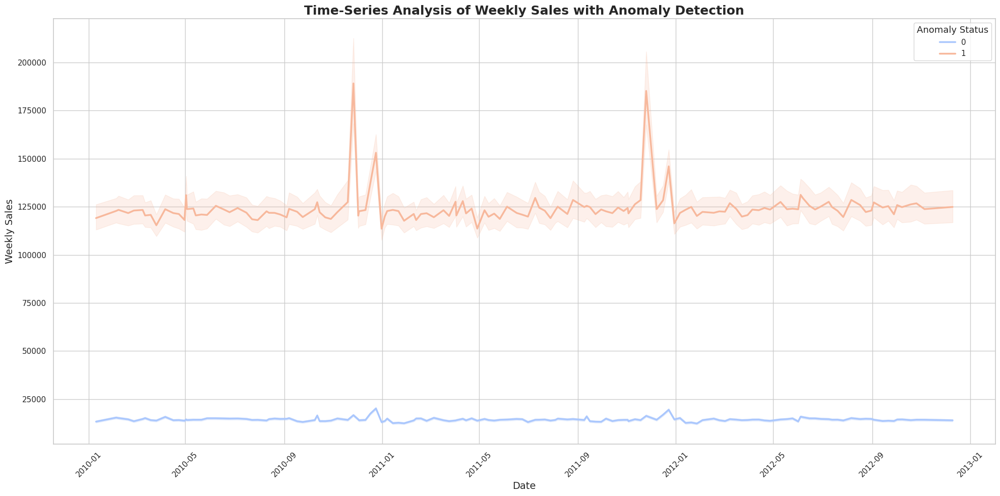

In [319]:
# Set seaborn theme for consistent EDA visuals
sns.set(style="whitegrid")

# Set the figure size for better time-series readability
plt.figure(figsize=(20, 10))

# Line plot showing weekly sales trends with anomaly segmentation
ax = sns.lineplot(
    x='Date',
    y='Weekly_Sales',
    hue='Anomaly',
    data=final_df,
    palette='coolwarm',    # 🔁 color changed
    linewidth=2.5
)

# Plot title and axis labels
plt.title(
    "Time-Series Analysis of Weekly Sales with Anomaly Detection",
    fontsize=18,
    fontweight='bold'
)
plt.xlabel("Date", fontsize=14)
plt.ylabel("Weekly Sales", fontsize=14)

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Improve legend formatting
plt.legend(
    title='Anomaly Status',
    title_fontsize=13,
    fontsize=11,
    loc='best'
)

# Optimize layout spacing
plt.tight_layout()

# Display the plot
plt.show()


#Department-wise Weekly Sales Distribution for Anomalous Observations

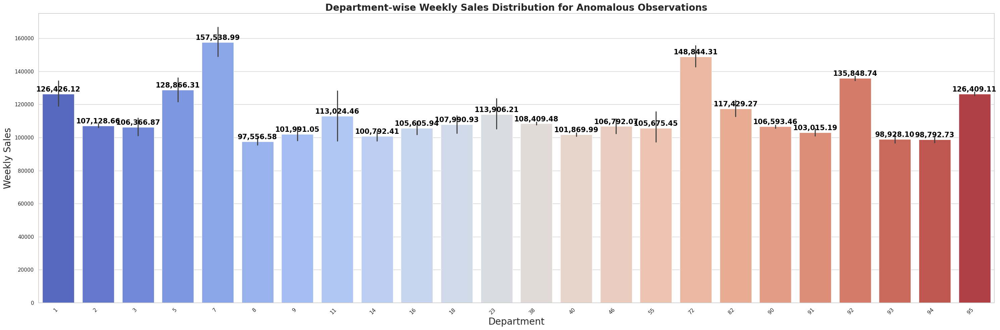

In [320]:
# Set seaborn theme for consistent EDA styling
sns.set(style="whitegrid")

# Set figure size for clear department-level comparison
plt.figure(figsize=(30, 10))

# Bar plot showing weekly sales for anomalous records by department
ax = sns.barplot(
    x='Dept',
    y='Weekly_Sales',
    data=df_anomalies,
    palette='coolwarm'   # 🔁 color changed
)

# Rotate department labels for better readability
plt.xticks(rotation=45, ha='right', fontsize=11)

# Annotate each bar with formatted sales values
for p in ax.patches:
    height = p.get_height()
    ax.annotate(
        f'{height:,.2f}',
        (p.get_x() + p.get_width() / 2., height),
        ha='center',
        va='baseline',
        fontsize=15,
        fontweight='bold',
        color='black',
        xytext=(0, 5),
        textcoords='offset points'
    )

# Titles and axis labels
plt.title(
    "Department-wise Weekly Sales Distribution for Anomalous Observations",
    fontsize=20,
    fontweight='bold'
)
plt.xlabel("Department", fontsize=20)
plt.ylabel("Weekly Sales", fontsize=20)

# Optimize spacing
plt.tight_layout()

# Display the plot
plt.show()


#Store-wise Weekly Sales Distribution for Anomalous Records

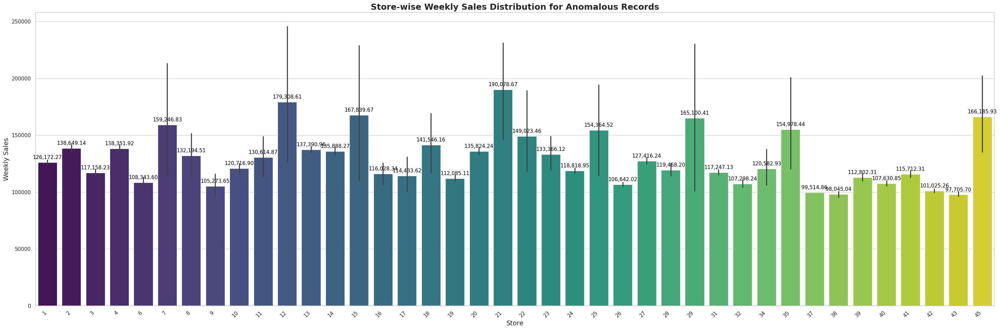

In [321]:
# Set seaborn theme for consistent EDA visuals
sns.set(style="whitegrid")

# Set figure size for clear store-level comparison
plt.figure(figsize=(30, 10))

# Sort anomalous sales in descending order for better visual ranking
df_sorted = df_anomalies.sort_values(by='Weekly_Sales', ascending=False)

# Bar plot showing weekly sales anomalies by store
ax = sns.barplot(
    x='Store',
    y='Weekly_Sales',
    data=df_sorted,
    palette='viridis'    # 🔁 color changed
)

# Rotate store labels for readability
plt.xticks(rotation=45, ha='right', fontsize=11)

# Annotate each bar with formatted sales values
for p in ax.patches:
    height = p.get_height()
    ax.annotate(
        f'{height:,.2f}',
        (p.get_x() + p.get_width() / 2., height),
        ha='center',
        va='bottom',
        fontsize=11,
        color='black',
        xytext=(0, 5),
        textcoords='offset points'
    )

# Title and axis labels
plt.title(
    "Store-wise Weekly Sales Distribution for Anomalous Records",
    fontsize=18,
    fontweight='bold'
)
plt.xlabel("Store", fontsize=14)
plt.ylabel("Weekly Sales", fontsize=14)

# Optimize layout spacing
plt.tight_layout()

# Display the plot
plt.show()


#Comparison of Anomalous Weekly Sales: Holiday vs Non-Holiday Periods

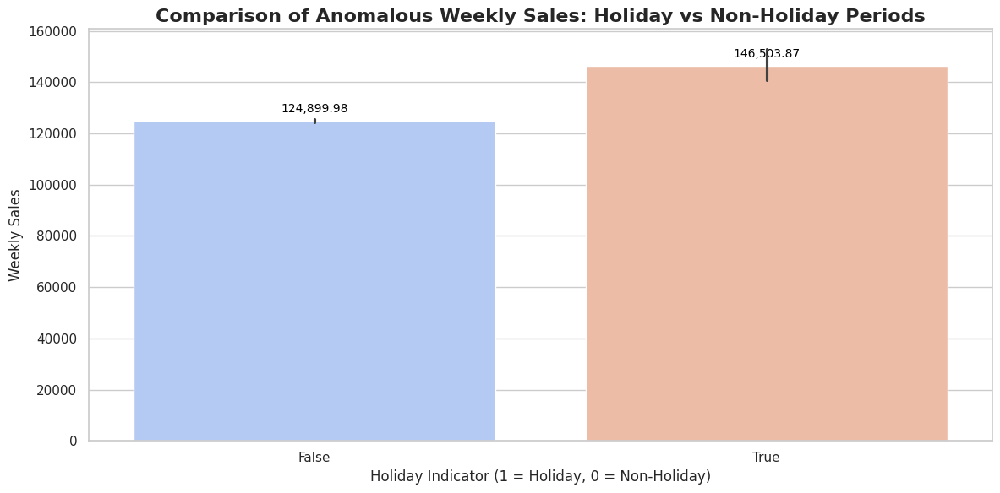

In [322]:
# Set seaborn theme for consistent EDA visuals
sns.set(style="whitegrid")

# Set the figure size for clear comparison
plt.figure(figsize=(12, 6))

# Bar plot comparing anomalous weekly sales on holidays vs non-holidays
ax = sns.barplot(
    x='IsHoliday',
    y='Weekly_Sales',
    data=df_anomalies,
    palette='coolwarm'   # 🔁 color changed
)

# Annotate bars with formatted sales values
for p in ax.patches:
    height = p.get_height()
    ax.annotate(
        f'{height:,.2f}',
        (p.get_x() + p.get_width() / 2., height),
        ha='center',
        va='bottom',
        fontsize=10,
        color='black',
        xytext=(0, 5),
        textcoords='offset points'
    )

# Improved title and axis labels
plt.title(
    "Comparison of Anomalous Weekly Sales: Holiday vs Non-Holiday Periods",
    fontsize=16,
    fontweight='bold'
)
plt.xlabel("Holiday Indicator (1 = Holiday, 0 = Non-Holiday)", fontsize=12)
plt.ylabel("Weekly Sales", fontsize=12)

# Optimize layout spacing
plt.tight_layout()

# Display the plot
plt.show()


# Findings on Potential Causes of Sales Anomalies

## Impact of Holidays on Sales

The analysis shows that holidays have a strong impact on sales patterns. On non-holiday days (IsHoliday = False), around 90% of observations are concentrated at lower sales levels, indicating relatively stable and lower demand. In contrast, holiday periods (IsHoliday = True) are associated with higher sales values and a greater number of anomalies, reflecting a clear uplift in sales during festive weeks.

## Seasonality and Consumer Behavior

The increase in sales during holidays can be linked to seasonal and behavioral factors such as higher consumer spending, festive shopping trends, promotional offers, and seasonal discounts. Customers are more likely to make discretionary purchases during these periods, leading to increased overall sales.

## Business Strategies

Retailers typically implement targeted marketing strategies during holiday seasons to take advantage of increased demand. These include promotional campaigns, discounts, and seasonal product offerings, all of which contribute to higher sales performance during holiday weeks.

## Anomaly Detection Insights

The higher occurrence of anomalies during holiday periods indicates that sales behavior becomes more volatile and less predictable compared to regular weeks. Recognizing these patterns is important for improving demand forecasting and enhancing anomaly detection models.

## Conclusion

Overall, the findings highlight the importance of incorporating holiday effects and seasonal behavior into sales forecasting and business planning. Aligning strategies with consumer behavior during peak periods can help improve demand prediction, optimize operations, and maximize revenue opportunities.


In [323]:
#Anamoly detection
from sklearn.ensemble import IsolationForest
#checking for normal distribution
print("Skewness - Cost: %f" % final_df['Weekly_Sales'].skew())
print("Kurtosis - Cost: %f" % final_df['Weekly_Sales'].kurt())

Skewness - Cost: 3.262008
Kurtosis - Cost: 21.491290


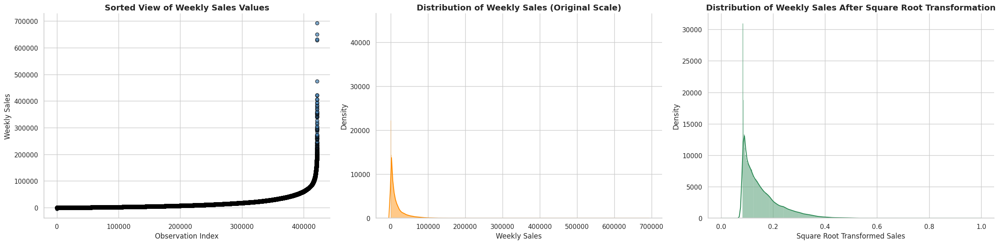

In [324]:
# Set a clean EDA theme
sns.set(style="whitegrid")

# Create a 1x3 subplot layout for distribution comparison
fig, axes = plt.subplots(1, 3, figsize=(24, 6))

# 1️⃣ Sorted Weekly Sales (Scatter View)
axes[0].scatter(
    range(final_df.shape[0]),
    np.sort(final_df['Weekly_Sales'].values),
    color='steelblue',          # 🔁 color changed
    edgecolor='black',
    alpha=0.7
)
axes[0].set_title(
    "Sorted View of Weekly Sales Values",
    fontsize=14,
    fontweight='bold'
)
axes[0].set_xlabel("Observation Index", fontsize=12)
axes[0].set_ylabel("Weekly Sales", fontsize=12)
sns.despine(ax=axes[0])

# 2️⃣ Distribution of Weekly Sales
sns.histplot(
    final_df['Weekly_Sales'],
    kde=True,
    ax=axes[1],
    color='darkorange'          # 🔁 color changed
)
axes[1].set_title(
    "Distribution of Weekly Sales (Original Scale)",
    fontsize=14,
    fontweight='bold'
)
axes[1].set_xlabel("Weekly Sales", fontsize=12)
axes[1].set_ylabel("Density", fontsize=12)
sns.despine(ax=axes[1])

# 3️⃣ Distribution of Square Root Transformed Sales
sns.histplot(
    final_df['Sales_sqrt'],
    kde=True,
    ax=axes[2],
    color='seagreen'            # 🔁 color changed
)
axes[2].set_title(
    "Distribution of Weekly Sales After Square Root Transformation",
    fontsize=14,
    fontweight='bold'
)
axes[2].set_xlabel("Square Root Transformed Sales", fontsize=12)
axes[2].set_ylabel("Density", fontsize=12)
sns.despine(ax=axes[2])

# Adjust layout for clarity
plt.tight_layout()
plt.show()


In [325]:
#isolation forest for anamoly detection on Weekly Sales
isolation_forest = IsolationForest(n_estimators=100, contamination=0.01)
isolation_forest.fit(final_df['Weekly_Sales'].values.reshape(-1, 1))
final_df['anomaly_score_univariate_Weekly_Sales'] = isolation_forest.decision_function(final_df['Weekly_Sales'].values.reshape(-1, 1))
final_df['outlier_univariate_Weekly_Sales'] = isolation_forest.predict(final_df['Weekly_Sales'].values.reshape(-1, 1))

In [326]:
# Handling Outliers & Outlier treatments
# To separate the symmetric distributed features and skew symmetric distributed features
num_columns=['Weekly_Sales', 'Size', 'Temperature',
       'Fuel_Price', 'MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4',
       'MarkDown5', 'CPI', 'Unemployment']
symmetric_feature=[]
non_symmetric_feature=[]
for i in num_columns:
  if abs(final_df[i].mean()-final_df[i].median())< 0.2:
    symmetric_feature.append(i)
  else:
    non_symmetric_feature.append(i)

# Getting Symmetric Distributed Features
print("Symmetric Distributed Features : -",symmetric_feature)

# Getting Skew Symmetric Distributed Features
print("Skew Symmetric Distributed Features : -",non_symmetric_feature)

Symmetric Distributed Features : - ['Fuel_Price', 'Unemployment']
Skew Symmetric Distributed Features : - ['Weekly_Sales', 'Size', 'Temperature', 'MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5', 'CPI']


In [327]:
# For Skew Symmetric features defining upper and lower boundry
#Outer Fence
def outlier_treatment_skew(df,feature):
  IQR= df[feature].quantile(0.75)- df[feature].quantile(0.25)
  lower_bridge =df[feature].quantile(0.25)- 1.5*IQR
  upper_bridge =df[feature].quantile(0.75)+ 1.5*IQR
  return upper_bridge,lower_bridge

In [328]:
# Get the upper and lower boundaries for 'Weekly_Sales'
upper_boundary, lower_boundary = outlier_treatment_skew(final_df, 'Weekly_Sales')
upper_boundary, lower_boundary

(np.float64(47395.15625), np.float64(-25109.653749999998))

In [329]:
#Removing Anomalies using IQR
final_new_df=final_df[(final_df['Weekly_Sales'] >= lower_boundary) & (final_df['Weekly_Sales'] <= upper_boundary)]

In [330]:
final_new_df.describe()

,Store,Dept,Date,Weekly_Sales,Size,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,Weekly_Sales_normalized,Sales_sqrt,Anomaly,anomaly_score_univariate_Weekly_Sales,outlier_univariate_Weekly_Sales
count,386049.000000,386049.000000,386049,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,386049.0,386049.000000,386049.0
mean,22.418351,42.902909,2011-06-19 03:45:02.426893824,10544.403242,133748.441149,60.062128,3.361214,5971.519327,998.248268,451.179090,2061.817116,3771.376868,171.282755,7.971957,0.022251,0.140642,0.0,0.279008,1.0
min,1.000000,1.000000,2010-01-10 00:00:00,-4988.940000,34875.000000,-2.060000,2.472000,0.270000,-265.760000,-29.100000,0.220000,135.160000,126.064000,3.879000,0.000000,0.000000,0.0,0.185191,1.0
25%,11.000000,18.000000,2010-10-12 00:00:00,1755.830000,93188.000000,46.660000,2.932000,5347.450000,192.000000,24.600000,1481.310000,3359.450000,132.106200,6.885000,0.009662,0.098294,0.0,0.274203,1.0
50%,22.000000,35.000000,2011-06-17 00:00:00,6373.100000,128107.000000,62.070000,3.452000,5347.450000,192.000000,24.600000,1481.310000,3359.450000,182.431557,7.866000,0.016276,0.127577,0.0,0.289833,1.0
75%,33.000000,71.000000,2012-03-02 00:00:00,15802.090000,202307.000000,74.250000,3.738000,5347.450000,192.000000,24.600000,1481.310000,3359.450000,212.576205,8.595000,0.029783,0.172577,0.0,0.296384,1.0
max,45.000000,99.000000,2012-12-10 00:00:00,47393.430000,219622.000000,100.140000,4.468000,88646.760000,104519.540000,141630.610000,67474.850000,108519.280000,227.232807,14.313000,0.075037,0.273929,0.0,0.305993,1.0
std,12.791236,29.604673,NaN,11327.026575,60976.982207,18.493405,0.459029,4969.092478,4928.090531,5257.526308,3601.149883,3534.203113,39.170721,1.876819,0.016226,0.049710,0.0,0.028186,0.0


In [331]:
#dropping the columns created while outliers treatment
final_new_df.drop(columns =['anomaly_score_univariate_Weekly_Sales','outlier_univariate_Weekly_Sales'], inplace = True)

In [332]:
# Calculate mean and standard deviation
mean_sales = np.mean(final_new_df['Sales_sqrt'])
std_deviation = np.std(final_new_df['Sales_sqrt'])

# Set a threshold for flagging anomalies (e.g., 3 standard deviations from the mean)
threshold = mean_sales + 3 * std_deviation

# Identify anomalies
anomalies = [data_point for data_point in final_new_df['Sales_sqrt'] if data_point > threshold]

#If the data point exceeds the threshold, it assigns a value of 1 (indicating an anomaly), otherwise it assigns a value of 0.
final_df['Anomaly'] = [1 if data_point > threshold else 0 for data_point in final_df['Sales_sqrt']]

print("Retail Weekly Sales Data:")
print("Mean Sales:", mean_sales)
print("Standard Deviation:", std_deviation)
print("Anomalies (2 standard deviations from the mean)-Total number of Anomalies in Weekly Sales :", len(anomalies))
print("Total number of Anomalies in Weekly Sales (percentage-wise) :", round((len(anomalies)/len(sales_df))*100,2))

Retail Weekly Sales Data:
Mean Sales: 0.14064200086439266
Standard Deviation: 0.04971002037664965
Anomalies (2 standard deviations from the mean)-Total number of Anomalies in Weekly Sales : 0
Total number of Anomalies in Weekly Sales (percentage-wise) : 0.0


# Time-Based Anomaly Detection

## Analysis Overview

Sales trends are analyzed over time to understand temporal patterns and fluctuations. The objective is to identify seasonal effects and holiday-driven variations that influence sales behavior across different periods. Time-series techniques are applied to evaluate store- and department-level performance and detect unusual or unexpected sales patterns.

## Approach

### Rolling Statistics

Rolling averages, moving sums, and rolling standard deviations are computed to monitor both short-term and long-term variations in sales trends. These metrics help in identifying gradual shifts as well as sudden deviations in performance.

### Exponential Smoothing

Exponential Moving Averages (EMA) are applied to smooth the time-series data and reduce noise. This helps in highlighting underlying trends and improving the detection of irregular patterns or abrupt changes in sales behavior.

### Anomaly Identification

Threshold-based rules and visual indicators are used to detect significant deviations from smoothed trends. This enables effective identification of anomalies and supports clearer interpretation of sales dynamics over time.


###**Rolling Statistics**

In [333]:
# Sort the DataFrame by date
final_df.sort_values(by='Date', inplace=True)

In [334]:
# Calculate rolling statistics
rolling_window = 30

In [335]:
# Rolling average of TotalSales
final_df['RollingAvgTotalSales'] = final_df['Weekly_Sales'].rolling(window=rolling_window).mean()

In [336]:
# Set anomaly threshold (customize this threshold as needed)
sales_threshold = 1  # Adjust the threshold as needed

In [337]:
# Detect anomalies in WeeklySales
final_df['SalesAnomaly'] = final_df['Weekly_Sales'] < sales_threshold * final_df['RollingAvgTotalSales']


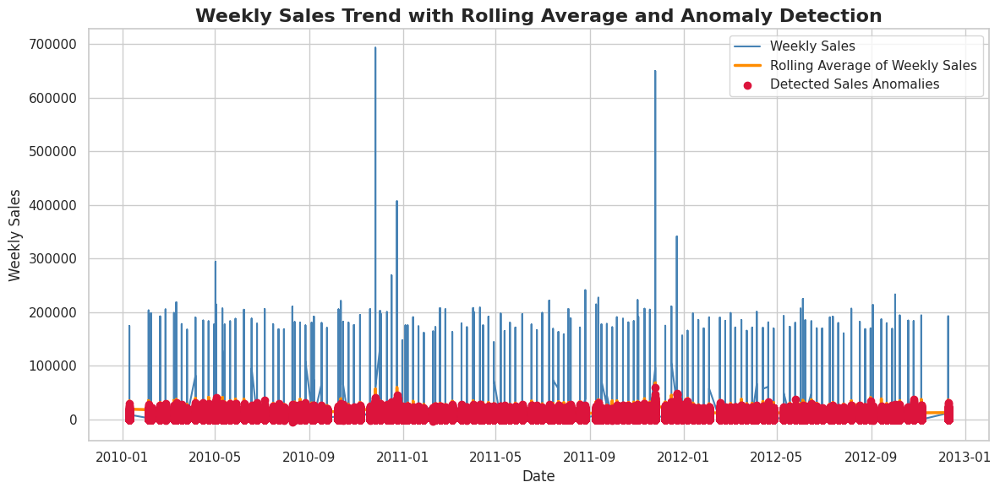

In [338]:
plt.figure(figsize=(12, 6))

# Plot original weekly sales trend
plt.plot(
    final_df['Date'],
    final_df['Weekly_Sales'],
    label='Weekly Sales',
    color='steelblue'
)

# Plot rolling average of weekly sales
plt.plot(
    final_df['Date'],
    final_df['RollingAvgTotalSales'],
    label='Rolling Average of Weekly Sales',
    color='darkorange',
    linewidth=2.5
)

# Highlight detected sales anomalies
anomaly_dates = final_df.loc[final_df['SalesAnomaly'], 'Date']
anomaly_sales = final_df.loc[final_df['SalesAnomaly'], 'Weekly_Sales']
plt.scatter(
    anomaly_dates,
    anomaly_sales,
    color='crimson',
    label='Detected Sales Anomalies',
    zorder=5
)

# Axis labels and title
plt.xlabel('Date', fontsize=12)
plt.ylabel('Weekly Sales', fontsize=12)
plt.title(
    'Weekly Sales Trend with Rolling Average and Anomaly Detection',
    fontsize=16,
    fontweight='bold'
)

# Legend and layout
plt.legend()
plt.tight_layout()
plt.show()


# Observations

The visualization displays rolling statistics along with detected anomalies in the weekly sales data.

The rolling average of weekly sales does not show a consistent upward or downward trend over time, indicating that overall sales remain relatively stable throughout the observed period.

Multiple anomalies are observed in the time series, marked clearly on the graph. These deviations from normal patterns may be influenced by factors such as markdown events, seasonal effects, or holiday-driven demand, which lead to temporary fluctuations in sales behavior.


In [339]:
# Apply exponential smoothing (EMA)
alpha = 0.2  # Adjust the smoothing factor as needed

In [340]:
# Exponential smoothing of TotalSales
final_df['EMAWeeklySales'] = final_df['Weekly_Sales'].ewm(alpha=alpha).mean()

In [341]:
# Set anomaly threshold (customize this threshold as needed)
sales_threshold = 1  # Adjust the threshold as needed

In [342]:
# Detect anomalies in TotalSales and Discount
final_df['SalesAnomaly_EMA'] = final_df['Weekly_Sales'] < sales_threshold * final_df['EMAWeeklySales']

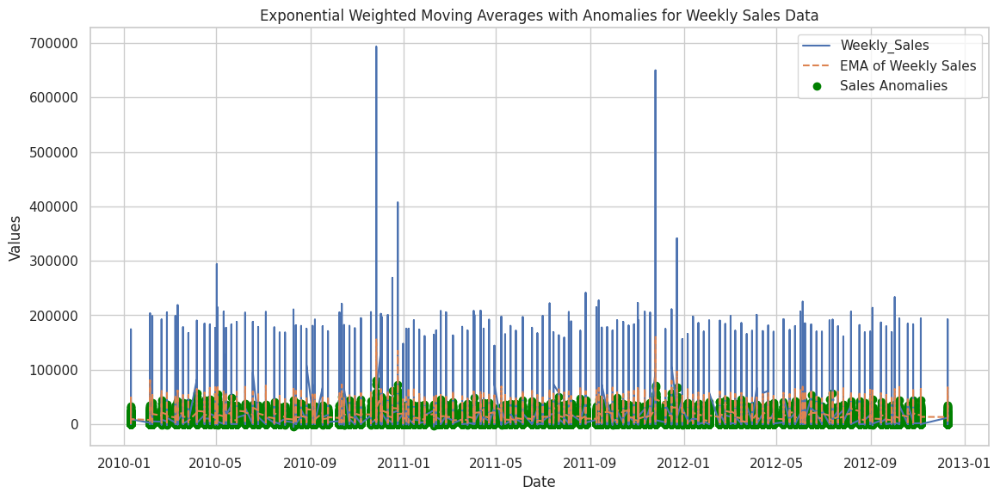

In [343]:
# Visualize EMA with original values and anomalies
plt.figure(figsize=(12, 6))
plt.plot(final_df['Date'], final_df['Weekly_Sales'], label='Weekly_Sales')
plt.plot(final_df['Date'], final_df['EMAWeeklySales'], label='EMA of Weekly Sales', linestyle='--')
plt.scatter(final_df['Date'][final_df['SalesAnomaly_EMA']], final_df['Weekly_Sales'][final_df['SalesAnomaly_EMA']], c='green', label='Sales Anomalies')

plt.xlabel('Date')
plt.ylabel('Values')
plt.legend()
plt.title('Exponential Weighted Moving Averages with Anomalies for Weekly Sales Data')
plt.show()

# Observations

The Exponentially Weighted Moving Average (EWMA) of the sales data remains largely stable over time, with a few occasional spikes, indicating that overall sales are relatively steady with periodic seasonal fluctuations.

Several anomalies are observed in the time series, highlighted using distinct markers on the graph. These deviations may be influenced by factors such as holidays, seasonal demand changes, or other unexpected events that temporarily disrupt normal sales patterns.


# **Customer Segmentation Analysis:**

Segment stores or departments based on sales patterns, markdowns, and regional features.

Analyze segment-specific trends and characteristics.

In [344]:
cluster_df=final_new_df.copy()

In [345]:
cluster_df.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday,Type,Size,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,Weekly_Sales_normalized,Sales_sqrt,Anomaly
0,1,1,2010-05-02,24924.50,False,A,151315,42.31,2.572,5347.45,192.0,24.6,1481.31,3359.45,211.096358,8.106,0.042851,0.207004,0
1,1,1,2010-12-02,46039.49,True,A,151315,38.51,2.548,5347.45,192.0,24.6,1481.31,3359.45,211.242170,8.106,0.073097,0.270365,0
2,1,1,2010-02-19,41595.55,False,A,151315,39.93,2.514,5347.45,192.0,24.6,1481.31,3359.45,211.289143,8.106,0.066732,0.258324,0
3,1,1,2010-02-26,19403.54,False,A,151315,46.63,2.561,5347.45,192.0,24.6,1481.31,3359.45,211.319643,8.106,0.034942,0.186927,0
4,1,1,2010-05-03,21827.90,False,A,151315,46.50,2.625,5347.45,192.0,24.6,1481.31,3359.45,211.350143,8.106,0.038415,0.195997,0


In [346]:
# Getting symmetric and skew symmetric features from the cplumns
features = ['Weekly_Sales', 'MarkDown1', 'MarkDown2','MarkDown3','MarkDown4','MarkDown5','CPI','Unemployment','Size','Fuel_Price','Temperature']
symmetric_feature=[]
non_symmetric_feature=[]
for i in features:
  if abs(cluster_df[i].mean()-cluster_df[i].median())<0.2:
    symmetric_feature.append(i)
  else:
    non_symmetric_feature.append(i)

# Getting Symmetric Distributed Features
print("Symmetric Distributed Features : -",symmetric_feature)

# Getting Skew Symmetric Distributed Features
print("Skew Symmetric Distributed Features : -",non_symmetric_feature)

Symmetric Distributed Features : - ['Unemployment', 'Fuel_Price']
Skew Symmetric Distributed Features : - ['Weekly_Sales', 'MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5', 'CPI', 'Size', 'Temperature']


In [347]:
# Step 2: Normalize Sales Data (Standardization)
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
cols=['Weekly_Sales', 'MarkDown1', 'MarkDown2','MarkDown3','MarkDown4','MarkDown5','CPI','Size','Temperature','Unemployment', 'Fuel_Price']
# Reshape the column to a 2D array and apply min-max scaling
for i in cols:
  cluster_df[i +'_normalized'] = scaler.fit_transform(cluster_df[i].values.reshape(-1, 1))

In [348]:
cluster_df.describe()

,Store,Dept,Date,Weekly_Sales,Size,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,...,MarkDown1_normalized,MarkDown2_normalized,MarkDown3_normalized,MarkDown4_normalized,MarkDown5_normalized,CPI_normalized,Size_normalized,Temperature_normalized,Unemployment_normalized,Fuel_Price_normalized
count,386049.000000,386049.000000,386049,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,...,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000
mean,22.418351,42.902909,2011-06-19 03:45:02.426893824,10544.403242,133748.441149,60.062128,3.361214,5971.519327,998.248268,451.179090,...,0.067360,0.012063,0.003390,0.030554,0.033549,0.446963,0.535183,0.607849,0.392271,0.445498
min,1.000000,1.000000,2010-01-10 00:00:00,-4988.940000,34875.000000,-2.060000,2.472000,0.270000,-265.760000,-29.100000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,11.000000,18.000000,2010-10-12 00:00:00,1755.830000,93188.000000,46.660000,2.932000,5347.450000,192.000000,24.600000,...,0.060320,0.004369,0.000379,0.021950,0.029749,0.059724,0.315637,0.476712,0.288097,0.230461
50%,22.000000,35.000000,2011-06-17 00:00:00,6373.100000,128107.000000,62.070000,3.452000,5347.450000,192.000000,24.600000,...,0.060320,0.004369,0.000379,0.021950,0.029749,0.557163,0.504647,0.627495,0.382116,0.490982
75%,33.000000,71.000000,2012-03-02 00:00:00,15802.090000,202307.000000,74.250000,3.738000,5347.450000,192.000000,24.600000,...,0.060320,0.004369,0.000379,0.021950,0.029749,0.855127,0.906277,0.746673,0.451984,0.634269
max,45.000000,99.000000,2012-12-10 00:00:00,47393.430000,219622.000000,100.140000,4.468000,88646.760000,104519.540000,141630.610000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
std,12.791236,29.604673,NaN,11327.026575,60976.982207,18.493405,0.459029,4969.092478,4928.090531,5257.526308,...,0.056055,0.047030,0.037114,0.053370,0.032608,0.387182,0.330057,0.180953,0.179875,0.229974


In [349]:
cluster_df.columns

Index(['Store', 'Dept', 'Date', 'Weekly_Sales', 'IsHoliday', 'Type', 'Size',
       'Temperature', 'Fuel_Price', 'MarkDown1', 'MarkDown2', 'MarkDown3',
       'MarkDown4', 'MarkDown5', 'CPI', 'Unemployment',
       'Weekly_Sales_normalized', 'Sales_sqrt', 'Anomaly',
       'MarkDown1_normalized', 'MarkDown2_normalized', 'MarkDown3_normalized',
       'MarkDown4_normalized', 'MarkDown5_normalized', 'CPI_normalized',
       'Size_normalized', 'Temperature_normalized', 'Unemployment_normalized',
       'Fuel_Price_normalized'],
      dtype='object')

In [350]:
#using log transformation to transform Weekly_Sales as using capping tends to change median and mean
cols=['Weekly_Sales_normalized','MarkDown1_normalized', 'MarkDown2_normalized', 'MarkDown3_normalized',
       'MarkDown4_normalized', 'MarkDown5_normalized', 'CPI_normalized',
       'Size_normalized', 'Temperature_normalized']
for i in cols:
  cluster_df[i+' sqrt'] = cluster_df[i].apply(lambda x: x ** 0.5)

In [351]:
cluster_df.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday,Type,Size,Temperature,Fuel_Price,MarkDown1,...,Fuel_Price_normalized,Weekly_Sales_normalized sqrt,MarkDown1_normalized sqrt,MarkDown2_normalized sqrt,MarkDown3_normalized sqrt,MarkDown4_normalized sqrt,MarkDown5_normalized sqrt,CPI_normalized sqrt,Size_normalized sqrt,Temperature_normalized sqrt
0,1,1,2010-05-02,24924.50,False,A,151315,42.31,2.572,5347.45,...,0.050100,0.755685,0.245602,0.066095,0.01947,0.148156,0.172478,0.916788,0.793894,0.658900
1,1,1,2010-12-02,46039.49,True,A,151315,38.51,2.548,5347.45,...,0.038076,0.986992,0.245602,0.066095,0.01947,0.148156,0.172478,0.917573,0.793894,0.630053
2,1,1,2010-02-19,41595.55,False,A,151315,39.93,2.514,5347.45,...,0.021042,0.943036,0.245602,0.066095,0.01947,0.148156,0.172478,0.917826,0.793894,0.640984
3,1,1,2010-02-26,19403.54,False,A,151315,46.63,2.561,5347.45,...,0.044589,0.682394,0.245602,0.066095,0.01947,0.148156,0.172478,0.917991,0.793894,0.690231
4,1,1,2010-05-03,21827.90,False,A,151315,46.50,2.625,5347.45,...,0.076653,0.715503,0.245602,0.066095,0.01947,0.148156,0.172478,0.918155,0.793894,0.689309


In [352]:
cluster_df.describe()

,Store,Dept,Date,Weekly_Sales,Size,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,...,Fuel_Price_normalized,Weekly_Sales_normalized sqrt,MarkDown1_normalized sqrt,MarkDown2_normalized sqrt,MarkDown3_normalized sqrt,MarkDown4_normalized sqrt,MarkDown5_normalized sqrt,CPI_normalized sqrt,Size_normalized sqrt,Temperature_normalized sqrt
count,386049.000000,386049.000000,386049,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,...,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000
mean,22.418351,42.902909,2011-06-19 03:45:02.426893824,10544.403242,133748.441149,60.062128,3.361214,5971.519327,998.248268,451.179090,...,0.445498,0.513426,0.245743,0.082088,0.025851,0.156596,0.175495,0.572350,0.670226,0.769731
min,1.000000,1.000000,2010-01-10 00:00:00,-4988.940000,34875.000000,-2.060000,2.472000,0.270000,-265.760000,-29.100000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,11.000000,18.000000,2010-10-12 00:00:00,1755.830000,93188.000000,46.660000,2.932000,5347.450000,192.000000,24.600000,...,0.230461,0.358832,0.245602,0.066095,0.019470,0.148156,0.172478,0.244385,0.561816,0.690444
50%,22.000000,35.000000,2011-06-17 00:00:00,6373.100000,128107.000000,62.070000,3.452000,5347.450000,192.000000,24.600000,...,0.490982,0.465731,0.245602,0.066095,0.019470,0.148156,0.172478,0.746434,0.710385,0.792146
75%,33.000000,71.000000,2012-03-02 00:00:00,15802.090000,202307.000000,74.250000,3.738000,5347.450000,192.000000,24.600000,...,0.634269,0.630007,0.245602,0.066095,0.019470,0.148156,0.172478,0.924731,0.951986,0.864103
max,45.000000,99.000000,2012-12-10 00:00:00,47393.430000,219622.000000,100.140000,4.468000,88646.760000,104519.540000,141630.610000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
std,12.791236,29.604673,NaN,11327.026575,60976.982207,18.493405,0.459029,4969.092478,4928.090531,5257.526308,...,0.229974,0.181471,0.083489,0.072969,0.052174,0.077662,0.052450,0.345513,0.293223,0.123949


In [353]:
cluster_df.columns

Index(['Store', 'Dept', 'Date', 'Weekly_Sales', 'IsHoliday', 'Type', 'Size',
       'Temperature', 'Fuel_Price', 'MarkDown1', 'MarkDown2', 'MarkDown3',
       'MarkDown4', 'MarkDown5', 'CPI', 'Unemployment',
       'Weekly_Sales_normalized', 'Sales_sqrt', 'Anomaly',
       'MarkDown1_normalized', 'MarkDown2_normalized', 'MarkDown3_normalized',
       'MarkDown4_normalized', 'MarkDown5_normalized', 'CPI_normalized',
       'Size_normalized', 'Temperature_normalized', 'Unemployment_normalized',
       'Fuel_Price_normalized', 'Weekly_Sales_normalized sqrt',
       'MarkDown1_normalized sqrt', 'MarkDown2_normalized sqrt',
       'MarkDown3_normalized sqrt', 'MarkDown4_normalized sqrt',
       'MarkDown5_normalized sqrt', 'CPI_normalized sqrt',
       'Size_normalized sqrt', 'Temperature_normalized sqrt'],
      dtype='object')

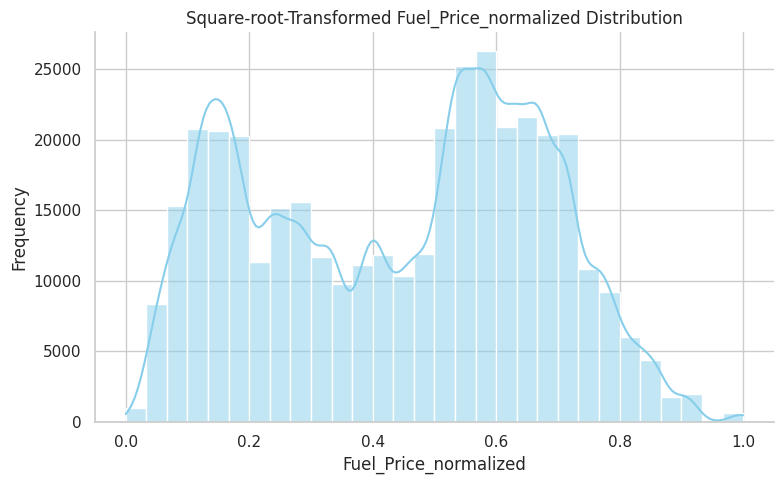

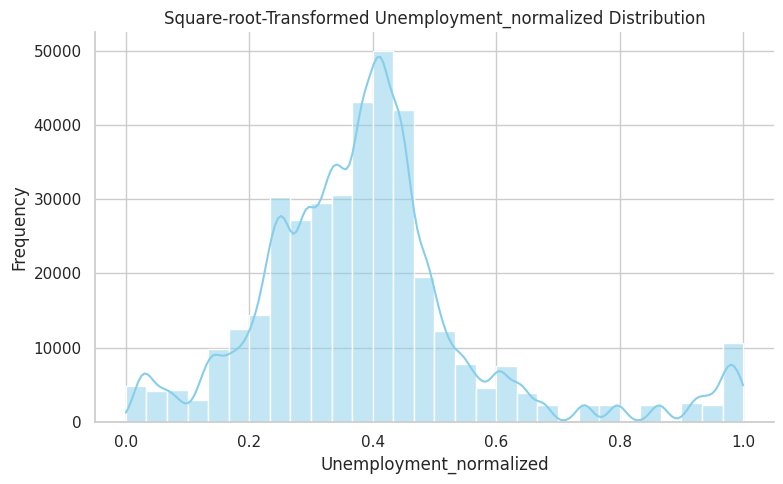

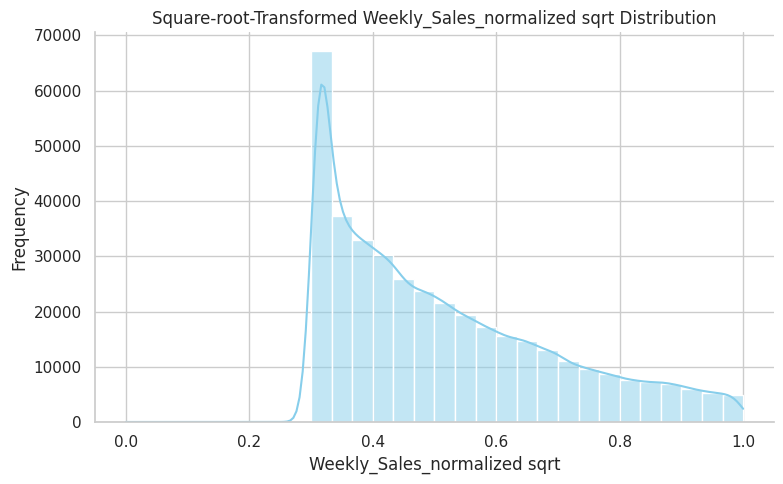

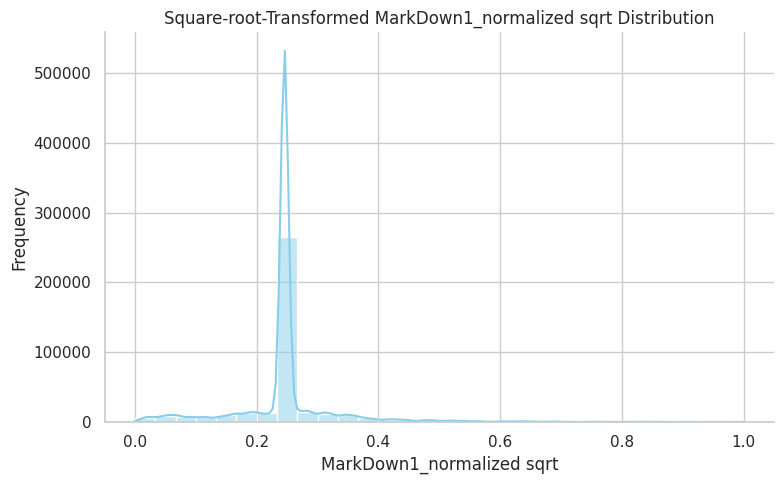

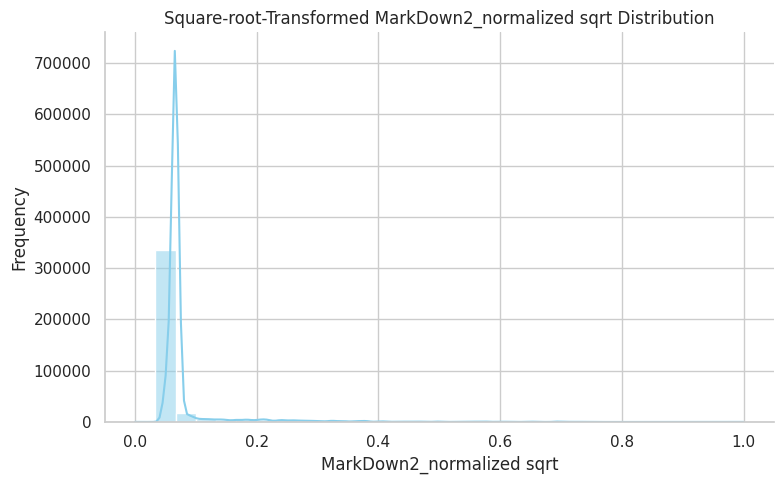

...

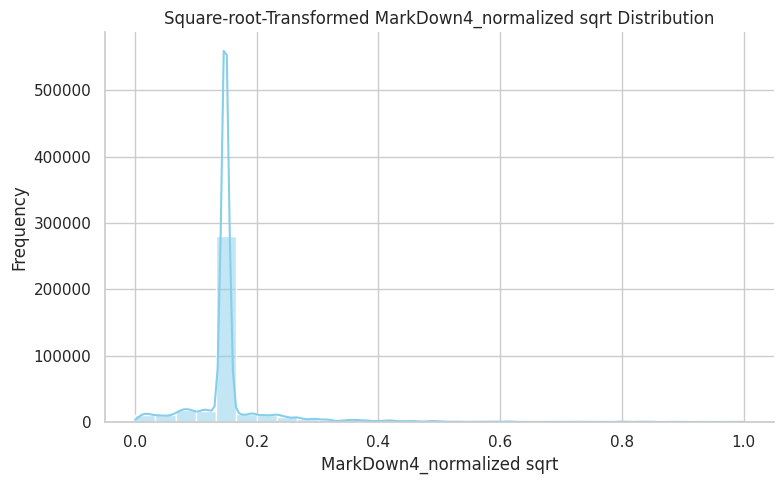

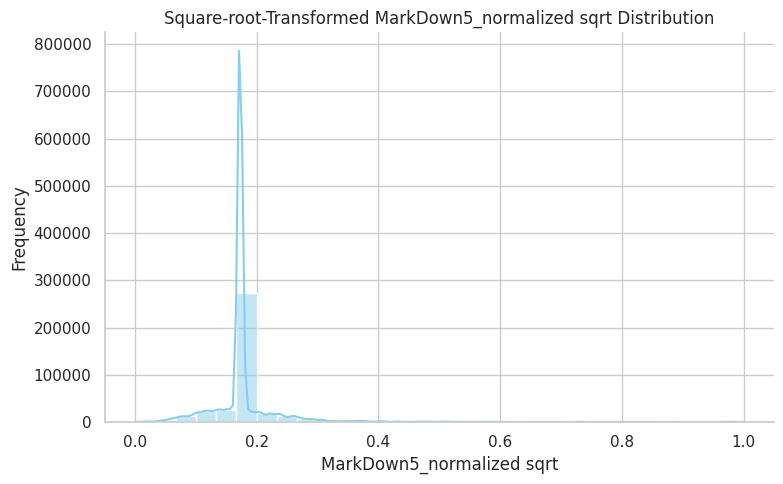

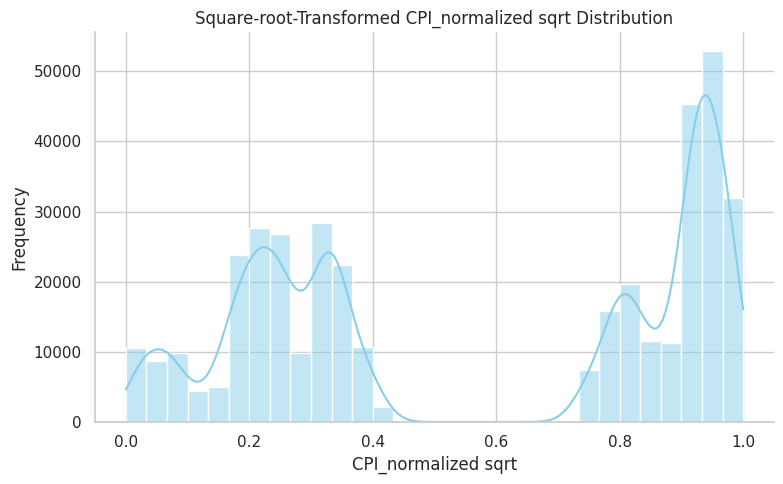

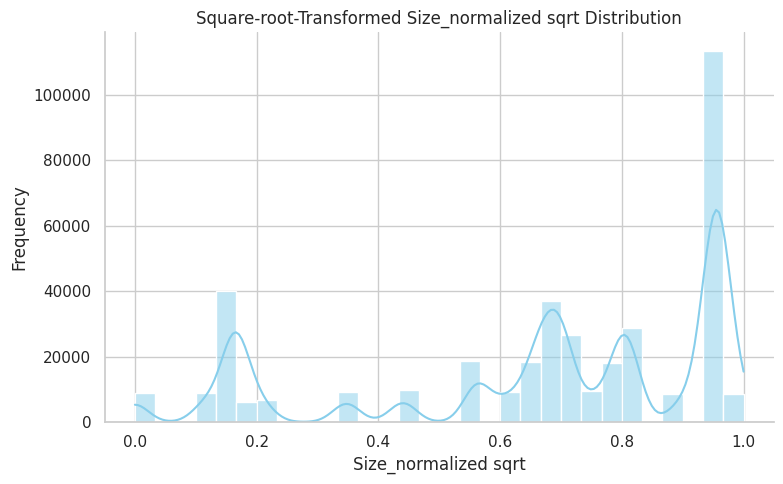

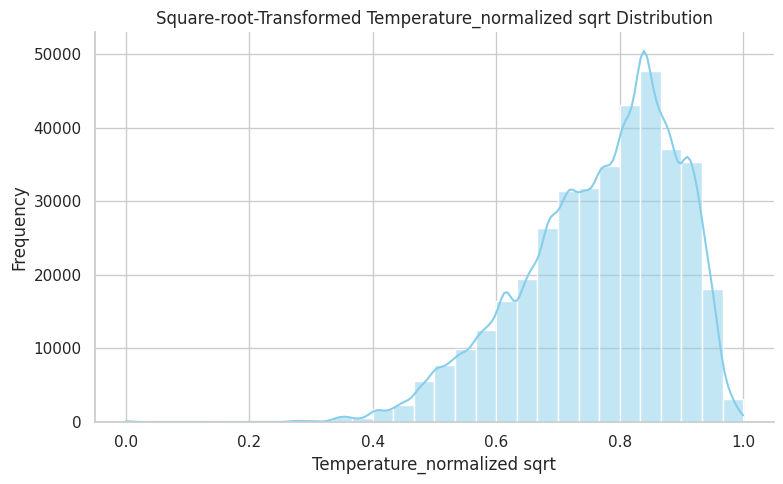

In [354]:
cols = ['Fuel_Price_normalized','Unemployment_normalized','Weekly_Sales_normalized sqrt',
        'MarkDown1_normalized sqrt', 'MarkDown2_normalized sqrt', 'MarkDown3_normalized sqrt',
        'MarkDown4_normalized sqrt', 'MarkDown5_normalized sqrt',
        'CPI_normalized sqrt', 'Size_normalized sqrt', 'Temperature_normalized sqrt']

for col in cols:
    plt.figure(figsize=(8, 5))
    sns.histplot(cluster_df[col], kde=True, color='skyblue', bins=30)
    plt.title(f"Square-root-Transformed {col} Distribution")
    sns.despine()
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.tight_layout()
    plt.show()

In [355]:
cluster_df.columns

Index(['Store', 'Dept', 'Date', 'Weekly_Sales', 'IsHoliday', 'Type', 'Size',
       'Temperature', 'Fuel_Price', 'MarkDown1', 'MarkDown2', 'MarkDown3',
       'MarkDown4', 'MarkDown5', 'CPI', 'Unemployment',
       'Weekly_Sales_normalized', 'Sales_sqrt', 'Anomaly',
       'MarkDown1_normalized', 'MarkDown2_normalized', 'MarkDown3_normalized',
       'MarkDown4_normalized', 'MarkDown5_normalized', 'CPI_normalized',
       'Size_normalized', 'Temperature_normalized', 'Unemployment_normalized',
       'Fuel_Price_normalized', 'Weekly_Sales_normalized sqrt',
       'MarkDown1_normalized sqrt', 'MarkDown2_normalized sqrt',
       'MarkDown3_normalized sqrt', 'MarkDown4_normalized sqrt',
       'MarkDown5_normalized sqrt', 'CPI_normalized sqrt',
       'Size_normalized sqrt', 'Temperature_normalized sqrt'],
      dtype='object')

In [356]:
# Define the aggregation functions and rename columns
agg_functions = {
    'Weekly_Sales_normalized sqrt': 'mean',
    'MarkDown1_normalized sqrt': 'mean',
    'MarkDown2_normalized sqrt': 'mean',
    'MarkDown3_normalized sqrt': 'mean',
    'MarkDown4_normalized sqrt': 'mean',
    'MarkDown5_normalized sqrt': 'mean',
    'CPI_normalized sqrt': 'mean',
    'Size_normalized sqrt': 'mean',
    'Temperature_normalized sqrt': 'mean'
}

# Calculate the mean for each column grouped by 'Store' and rename columns
mean_by_store = cluster_df.groupby('Store').agg(agg_functions).reset_index()

# Rename columns
mean_by_store.columns = ['Store', 'Mean_Weekly_Sales', 'Mean_MarkDown1', 'Mean_MarkDown2',
                         'Mean_MarkDown3', 'Mean_MarkDown4', 'Mean_MarkDown5',
                         'Mean_CPI', 'Mean_Size', 'Mean_Temperature']
store_df = pd.DataFrame(mean_by_store.set_index('Store'))
store_df.head()

,Mean_Weekly_Sales,Mean_MarkDown1,Mean_MarkDown2,Mean_MarkDown3,Mean_MarkDown4,Mean_MarkDown5,Mean_CPI,Mean_Size,Mean_Temperature
Store,,,,,,,,,
1,0.550465,0.258323,0.082537,0.025947,0.163175,0.183244,0.942463,0.793894,0.825339
2,0.577355,0.273740,0.091269,0.027692,0.176166,0.192711,0.940878,0.951986,0.823762
3,0.417468,0.219367,0.072215,0.023549,0.131408,0.143858,0.960257,0.116722,0.843924
4,0.574286,0.266005,0.089234,0.028936,0.179070,0.195721,0.143124,0.962042,0.786823
5,0.409784,0.217942,0.072402,0.023227,0.133170,0.159851,0.945560,0.000000,0.830593


In [357]:
store_df.columns

Index(['Mean_Weekly_Sales', 'Mean_MarkDown1', 'Mean_MarkDown2',
       'Mean_MarkDown3', 'Mean_MarkDown4', 'Mean_MarkDown5', 'Mean_CPI',
       'Mean_Size', 'Mean_Temperature'],
      dtype='object')

###**Dimensionality Reduction using PCA**

In [358]:
# Dimensionality Reduction (If needed)
#applying pca
#setting restaurant feature as index as it still had categorial value
from sklearn.decomposition import PCA
#scaled_df.set_index(['Store'],inplace=True)
features = store_df.columns
# features = features.drop('Restaurant')
# create an instance of PCA
pca = PCA()

# fit PCA on features
pca.fit(store_df[features])

PCA()

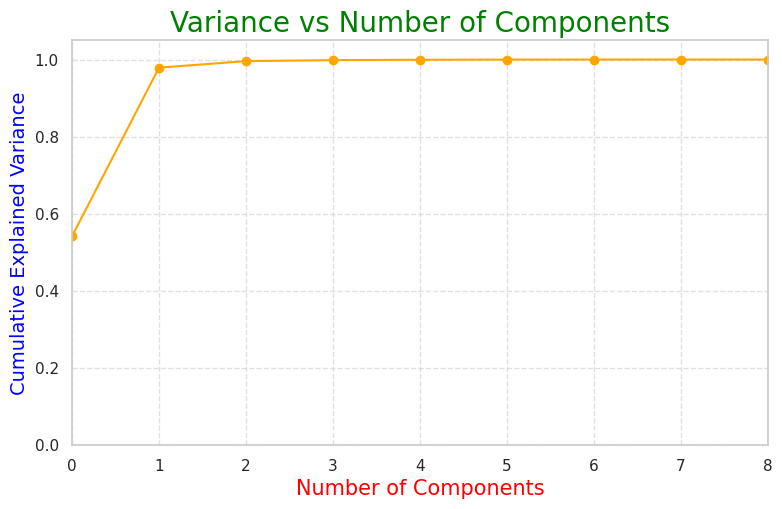

In [359]:
plt.figure(figsize=(8, 5))
plt.plot(np.cumsum(pca.explained_variance_ratio_), marker='o', color='orange', linestyle='-')
plt.xlabel('Number of Components', fontsize=15, color='red')
plt.ylabel('Cumulative Explained Variance', fontsize=14, color='blue')
plt.title('Variance vs Number of Components', fontsize=20, color='green')
plt.xlim([0, 8])
plt.ylim([0, 1.05])
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

In [360]:
#using n_component as 3
pca = PCA(n_components=3)

# fit PCA on features
pca.fit(store_df[features])

# explained variance ratio of each principal component
print('Explained variation per principal component: {}'.format(pca.explained_variance_ratio_))
# variance explained by three components
print('Cumulative variance explained by 3 principal components: {:.2%}'.format(
                                        np.sum(pca.explained_variance_ratio_)))

# transform data to principal component space
df_pca = pca.transform(store_df[features])

Explained variation per principal component: [0.54162243 0.43736933 0.01686211]
Cumulative variance explained by 3 principal components: 99.59%


In [361]:
#shape
print("original shape: ", store_df.shape)
print("transformed shape:", df_pca.shape)

original shape:  (45, 9)
transformed shape: (45, 3)


###**Kmeans Clustering**

In [362]:
# ML Model - 1 Implementation
#importing kmeans
from sklearn.cluster import KMeans


In [363]:
#Within Cluster Sum of Squared Errors(WCSS) for different values of k
wcss=[]
for i in range(1,11):
    km=KMeans(n_clusters=i,random_state = 20)
    km.fit(df_pca)
    wcss.append(km.inertia_)

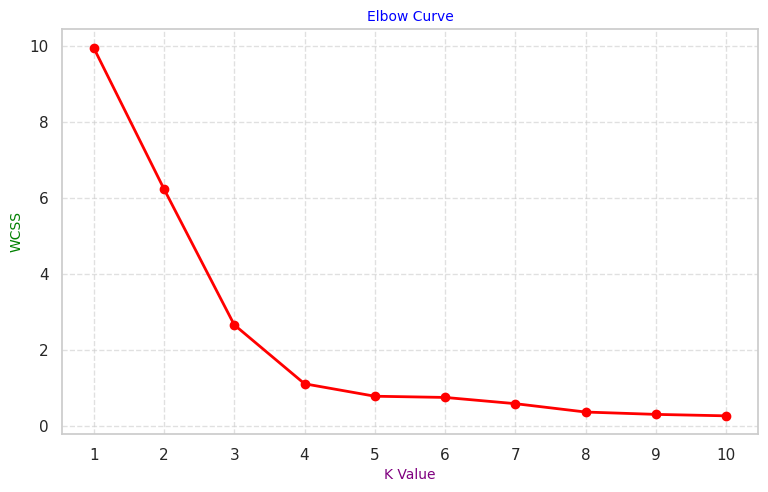

In [364]:
plt.figure(figsize=(8, 5))
plt.plot(range(1, 11), wcss, marker='o', color='red', linewidth=2)
plt.xlabel('K Value', fontsize=10, color='purple')
plt.xticks(np.arange(1, 11, 1))
plt.ylabel('WCSS', fontsize=10, color='green')
plt.title('Elbow Curve', fontsize=10, color='blue')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

# Segmentation Quality Evaluation

The effectiveness of customer segmentation is evaluated by assessing how well the identified segments represent distinct and meaningful customer groups.

Appropriate evaluation metrics are applied to measure both within-segment homogeneity and between-segment separation. This ensures that each segment is internally consistent while also being clearly distinguishable from other segments, thereby validating the overall quality of the segmentation approach.


## **Silhouette score**

For n_clusters = 2, average silhouette score = 0.5082


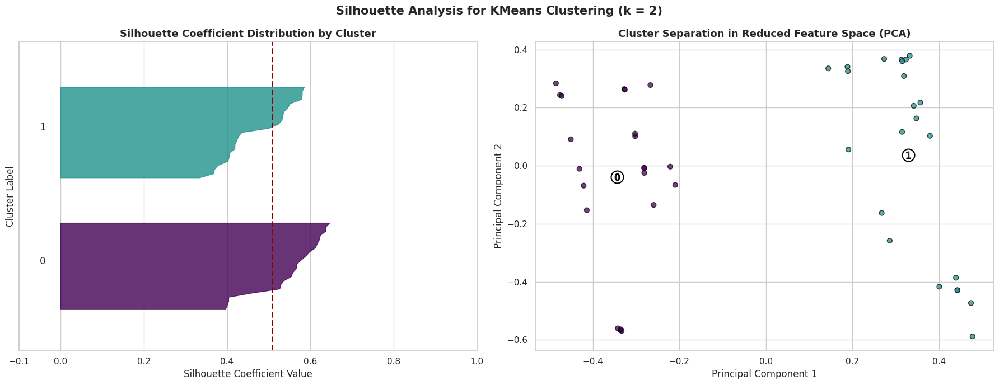

For n_clusters = 3, average silhouette score = 0.5956


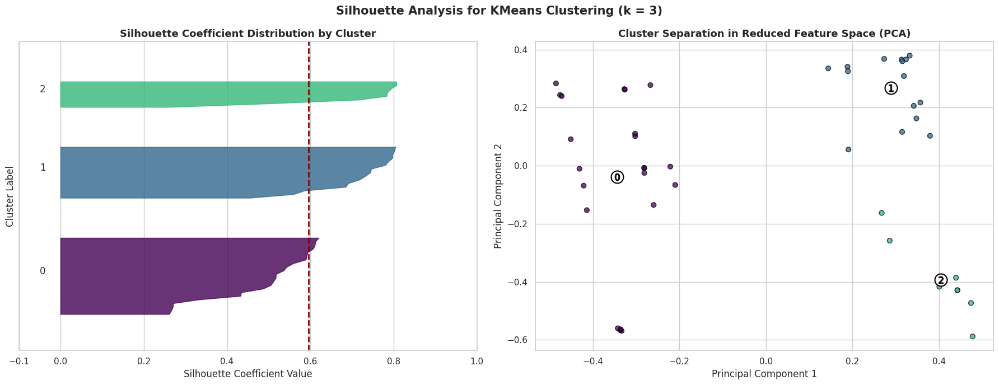

For n_clusters = 4, average silhouette score = 0.6689


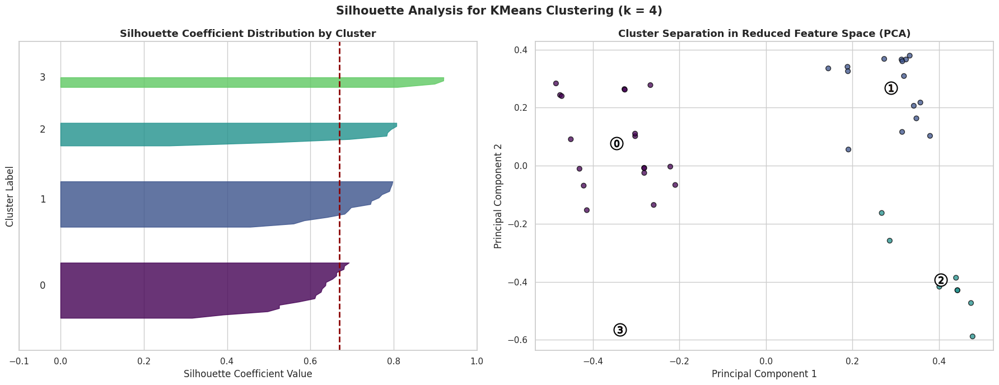

For n_clusters = 5, average silhouette score = 0.6014


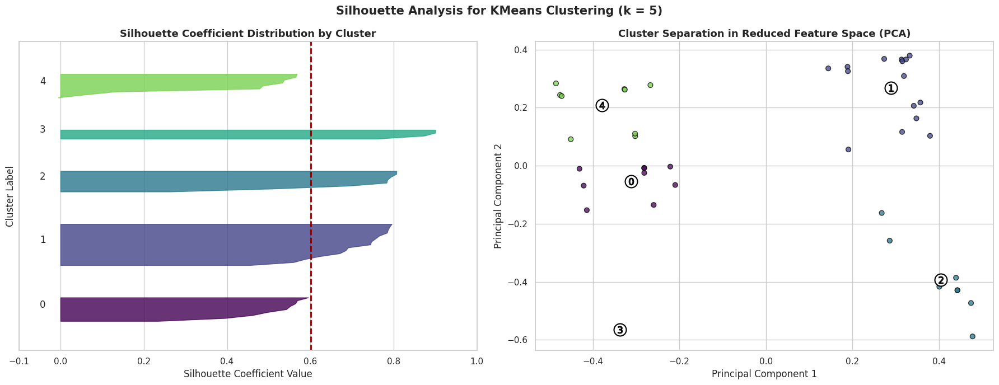

For n_clusters = 6, average silhouette score = 0.5563


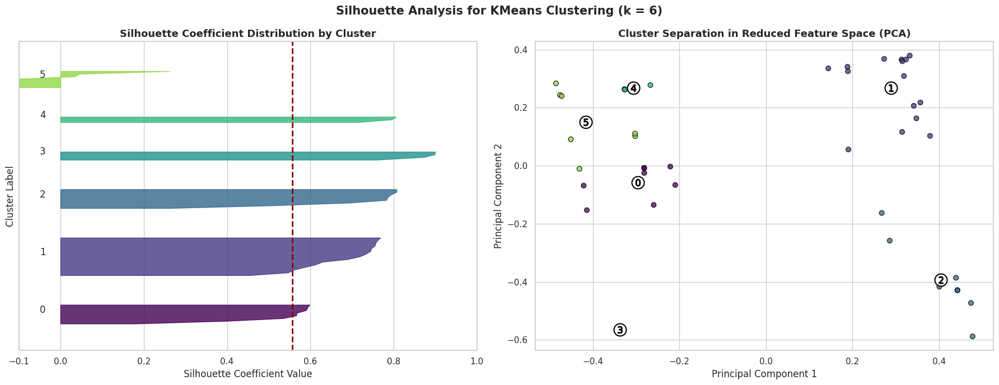

In [365]:
# Silhouette analysis for optimal KMeans clustering
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.cluster import KMeans
from sklearn.model_selection import ParameterGrid
import matplotlib.cm as cm
import numpy as np
import matplotlib.pyplot as plt

# Candidate values for number of clusters
parameters = list(range(2, 7))
parameter_grid = ParameterGrid({'n_clusters': parameters})

best_score = -1

# Perform silhouette analysis for each cluster count
for n_clusters in parameters:

    # Create figure with two subplots:
    # 1️⃣ Silhouette plot
    # 2️⃣ PCA-based cluster visualization
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # -------------------------------
    # Silhouette Plot Configuration
    # -------------------------------
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(df_pca) + (n_clusters + 1) * 10])

    # Fit KMeans model
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(df_pca)

    # Compute average silhouette score
    silhouette_avg = silhouette_score(df_pca, cluster_labels)
    print(
        f"For n_clusters = {n_clusters}, "
        f"average silhouette score = {silhouette_avg:.4f}"
    )

    # Compute silhouette scores for individual samples
    sample_silhouette_values = silhouette_samples(df_pca, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Extract and sort silhouette scores for cluster i
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        # Color selection per cluster
        color = cm.viridis(float(i) / n_clusters)   # 🔁 color refined

        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.8
        )

        # Label cluster number
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        y_lower = y_upper + 10  # Space between clusters

    # Average silhouette score reference line
    ax1.axvline(
        x=silhouette_avg,
        color="darkred",        # 🔁 color refined
        linestyle="--",
        linewidth=2
    )

    ax1.set_title(
        "Silhouette Coefficient Distribution by Cluster",
        fontsize=13,
        fontweight='bold'
    )
    ax1.set_xlabel("Silhouette Coefficient Value")
    ax1.set_ylabel("Cluster Label")
    ax1.set_yticks([])
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # --------------------------------
    # Cluster Visualization (PCA Space)
    # --------------------------------
    colors = cm.viridis(cluster_labels.astype(float) / n_clusters)  # 🔁 color refined

    ax2.scatter(
        df_pca[:, 0],
        df_pca[:, 1],
        marker='o',
        s=40,
        alpha=0.75,
        c=colors,
        edgecolor='black'
    )

    # Plot cluster centers
    centers = clusterer.cluster_centers_
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker='o',
        c='white',
        s=250,
        edgecolor='black',
        linewidth=1.5
    )

    # Label cluster centers
    for i, c in enumerate(centers):
        ax2.scatter(
            c[0],
            c[1],
            marker=f'${i}$',
            s=80,
            edgecolor='black'
        )

    ax2.set_title(
        "Cluster Separation in Reduced Feature Space (PCA)",
        fontsize=13,
        fontweight='bold'
    )
    ax2.set_xlabel("Principal Component 1")
    ax2.set_ylabel("Principal Component 2")

    # Overall figure title
    plt.suptitle(
        f"Silhouette Analysis for KMeans Clustering (k = {n_clusters})",
        fontsize=15,
        fontweight='bold'
    )

    plt.tight_layout()
    plt.show()


## **Department Wise Clustering**

In [366]:
# Define the aggregation functions and rename columns
agg_functions = {
    'Weekly_Sales_normalized sqrt': 'mean',
    'MarkDown1_normalized sqrt': 'mean',
    'MarkDown2_normalized sqrt': 'mean',
    'MarkDown3_normalized sqrt': 'mean',
    'MarkDown4_normalized sqrt': 'mean',
    'MarkDown5_normalized sqrt': 'mean',
    'CPI_normalized sqrt': 'mean',
    'Size_normalized sqrt': 'mean',
    'Temperature_normalized sqrt': 'mean'
}

# Calculate the mean for each column grouped by 'Store' and rename columns
mean_by_dept = cluster_df.groupby('Dept').agg(agg_functions).reset_index()

# Rename columns
mean_by_dept.columns = ['Dept', 'Mean_Weekly_Sales', 'Mean_MarkDown1', 'Mean_MarkDown2',
                         'Mean_MarkDown3', 'Mean_MarkDown4', 'Mean_MarkDown5',
                         'Mean_CPI', 'Mean_Size', 'Mean_Temperature']
dept_df = pd.DataFrame(mean_by_dept.set_index('Dept'))
dept_df.head()

,Mean_Weekly_Sales,Mean_MarkDown1,Mean_MarkDown2,Mean_MarkDown3,Mean_MarkDown4,Mean_MarkDown5,Mean_CPI,Mean_Size,Mean_Temperature
Dept,,,,,,,,,
1,0.630616,0.242399,0.080718,0.025440,0.155791,0.173796,0.577346,0.639098,0.777848
2,0.750047,0.223928,0.077248,0.023271,0.144609,0.163205,0.594462,0.490224,0.765232
3,0.520003,0.241951,0.081847,0.025867,0.154679,0.174294,0.575192,0.644143,0.770333
4,0.721116,0.240266,0.080375,0.024728,0.154247,0.171944,0.576441,0.623601,0.772372
5,0.627113,0.243403,0.081010,0.021535,0.156722,0.173727,0.581199,0.641397,0.779964


In [367]:
# Dimensionality Reduction (If needed)
#applying pca
#setting restaurant feature as index as it still had categorial value
from sklearn.decomposition import PCA
#scaled_df.set_index(['Store'],inplace=True)
features = dept_df.columns
# features = features.drop('Restaurant')
# create an instance of PCA
pca = PCA()

# fit PCA on features
pca.fit(dept_df[features])

PCA()

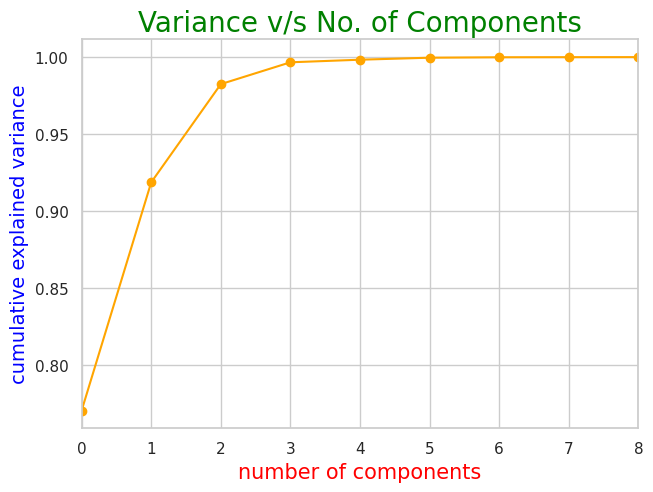

In [368]:
#explained variance v/s no. of components
plt.plot(np.cumsum(pca.explained_variance_ratio_), marker ='o', color = 'orange')
plt.xlabel('number of components',size = 15, color = 'red')
plt.ylabel('cumulative explained variance',size = 14, color = 'blue')
plt.title('Variance v/s No. of Components',size = 20, color = 'green')
plt.xlim([0, 8])
plt.show()

In [369]:
#using n_component as 3
pca = PCA(n_components=3)

# fit PCA on features
pca.fit(dept_df[features])

# explained variance ratio of each principal component
print('Explained variation per principal component: {}'.format(pca.explained_variance_ratio_))
# variance explained by three components
print('Cumulative variance explained by 3 principal components: {:.2%}'.format(
                                        np.sum(pca.explained_variance_ratio_)))

# transform data to principal component space
df_pca1 = pca.transform(dept_df[features])

Explained variation per principal component: [0.77068668 0.14809816 0.06369846]
Cumulative variance explained by 3 principal components: 98.25%


In [370]:
#shape
print("original shape: ", dept_df.shape)
print("transformed shape:", df_pca1.shape)

original shape:  (81, 9)
transformed shape: (81, 3)


In [371]:
#Within Cluster Sum of Squared Errors(WCSS) for different values of k
wcss=[]
for i in range(1,11):
    km=KMeans(n_clusters=i,random_state = 20)
    km.fit(df_pca1)
    wcss.append(km.inertia_)

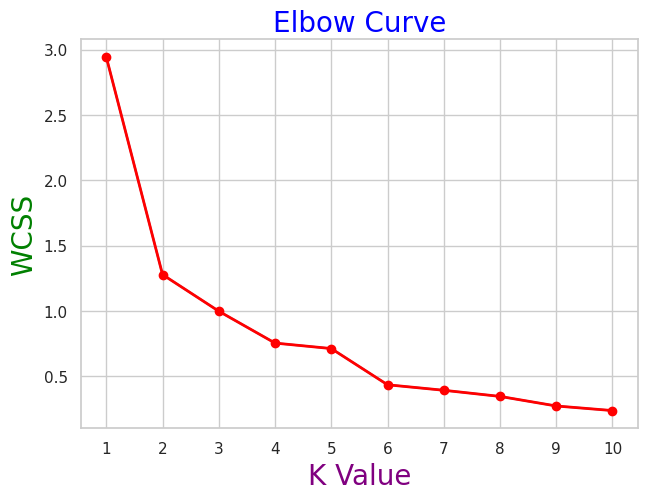

In [372]:
#elbow curve
plt.plot(range(1,11),wcss)
plt.plot(range(1,11),wcss, linewidth=2, color="red", marker ="o")
plt.xlabel("K Value", size = 20, color = 'purple')
plt.xticks(np.arange(1,11,1))
plt.ylabel("WCSS", size = 20, color = 'green')
plt.title('Elbow Curve', size = 20, color = 'blue')
plt.show()

For n_clusters = 2, average silhouette score = 0.5093


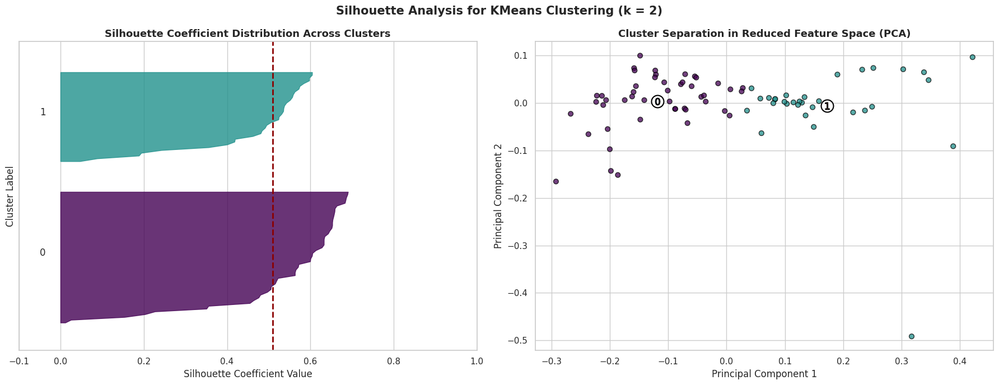

For n_clusters = 3, average silhouette score = 0.3726


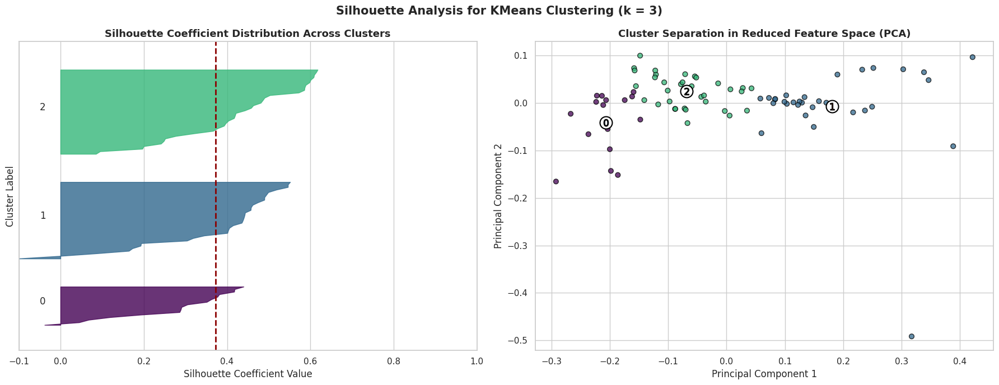

For n_clusters = 4, average silhouette score = 0.3913


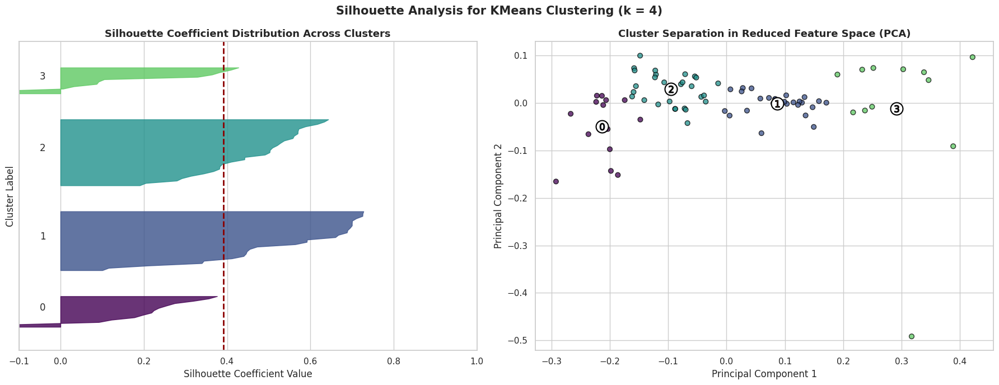

For n_clusters = 5, average silhouette score = 0.4059


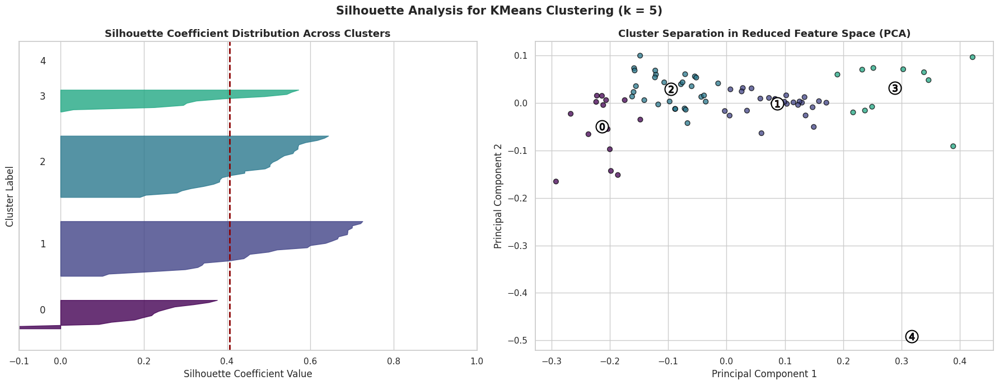

For n_clusters = 6, average silhouette score = 0.3531


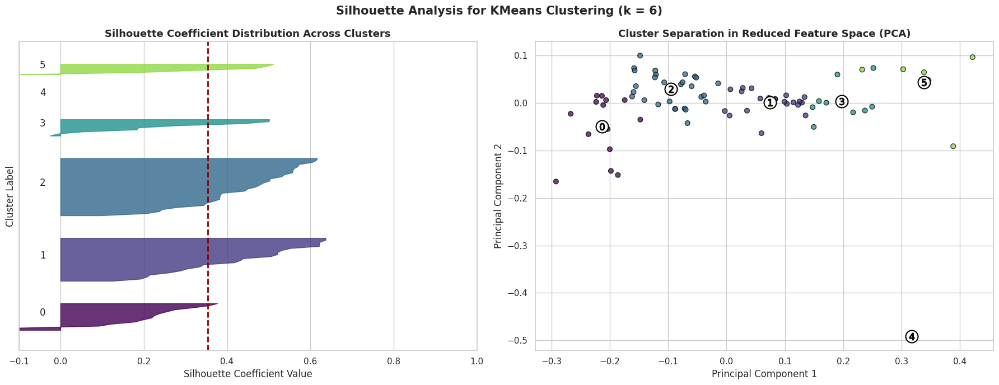

For n_clusters = 7, average silhouette score = 0.3421


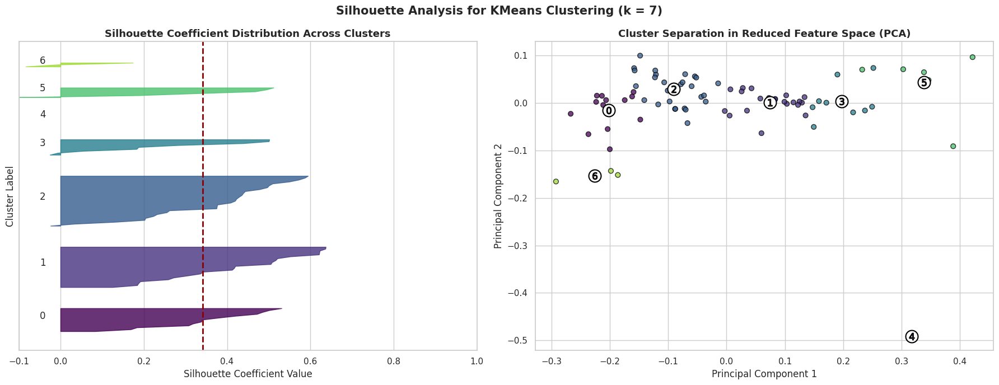

For n_clusters = 8, average silhouette score = 0.3443


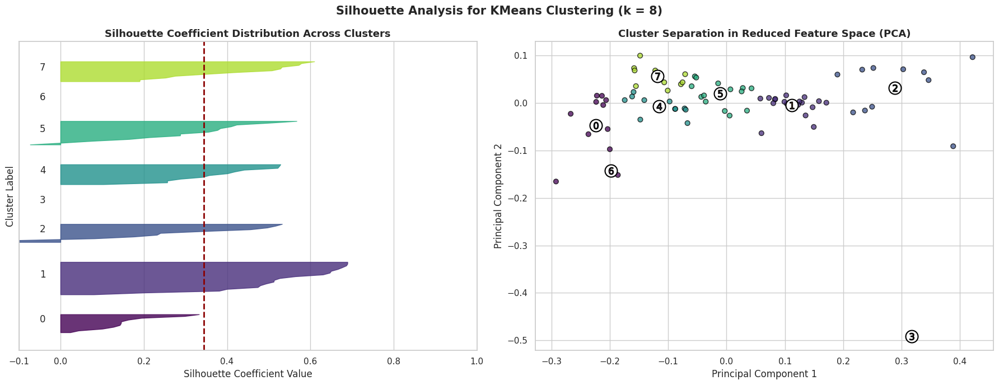

For n_clusters = 9, average silhouette score = 0.3273


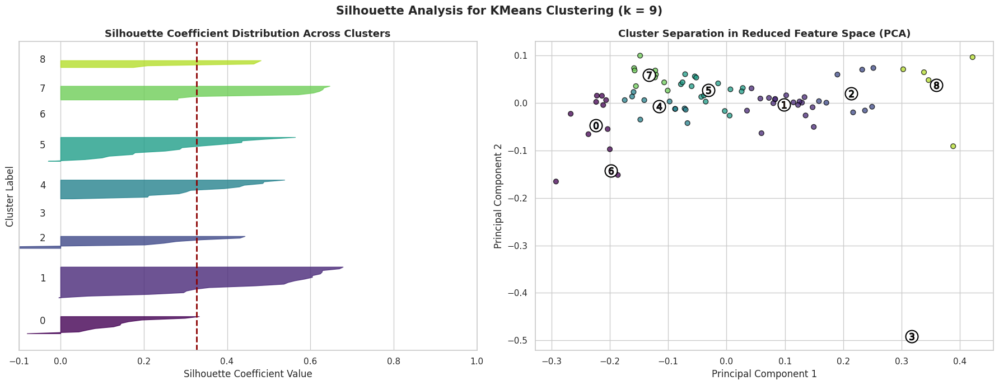

In [373]:
# Silhouette Analysis for Selecting Optimal KMeans Clusters

from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.model_selection import ParameterGrid
from sklearn.cluster import KMeans
import matplotlib.cm as cm
import numpy as np
import matplotlib.pyplot as plt

# Candidate values for number of clusters
parameters = list(range(2, 10))
parameter_grid = ParameterGrid({'n_clusters': parameters})

best_score = -1

# Perform silhouette analysis for each cluster count
for n_clusters in parameters:

    # Create a figure with two subplots:
    # 1️⃣ Silhouette coefficient distribution
    # 2️⃣ Cluster visualization in PCA space
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # -------------------------------
    # Silhouette Plot Configuration
    # -------------------------------
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(df_pca1) + (n_clusters + 1) * 10])

    # Initialize KMeans with fixed random state for reproducibility
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(df_pca1)

    # Compute average silhouette score
    silhouette_avg = silhouette_score(df_pca1, cluster_labels)
    print(
        f"For n_clusters = {n_clusters}, "
        f"average silhouette score = {silhouette_avg:.4f}"
    )

    # Compute silhouette scores for individual samples
    sample_silhouette_values = silhouette_samples(df_pca1, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):

        # Extract and sort silhouette values for cluster i
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        # Color assignment for each cluster
        color = cm.viridis(float(i) / n_clusters)   # 🔁 color refined

        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.8
        )

        # Label cluster number
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Update y-axis position for next cluster
        y_lower = y_upper + 10

    # Average silhouette score reference line
    ax1.axvline(
        x=silhouette_avg,
        color='darkred',        # 🔁 color refined
        linestyle='--',
        linewidth=2
    )

    ax1.set_title(
        "Silhouette Coefficient Distribution Across Clusters",
        fontsize=13,
        fontweight='bold'
    )
    ax1.set_xlabel("Silhouette Coefficient Value")
    ax1.set_ylabel("Cluster Label")
    ax1.set_yticks([])
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # --------------------------------
    # Cluster Visualization (PCA Space)
    # --------------------------------
    colors = cm.viridis(cluster_labels.astype(float) / n_clusters)  # 🔁 color refined

    ax2.scatter(
        df_pca1[:, 0],
        df_pca1[:, 1],
        marker='o',
        s=40,
        alpha=0.75,
        c=colors,
        edgecolor='black'
    )

    # Plot cluster centers
    centers = clusterer.cluster_centers_
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker='o',
        c='white',
        s=250,
        edgecolor='black',
        linewidth=1.5
    )

    # Label cluster centers
    for i, c in enumerate(centers):
        ax2.scatter(
            c[0],
            c[1],
            marker=f'${i}$',
            s=80,
            edgecolor='black'
        )

    ax2.set_title(
        "Cluster Separation in Reduced Feature Space (PCA)",
        fontsize=13,
        fontweight='bold'
    )
    ax2.set_xlabel("Principal Component 1")
    ax2.set_ylabel("Principal Component 2")

    # Overall figure title
    plt.suptitle(
        f"Silhouette Analysis for KMeans Clustering (k = {n_clusters})",
        fontsize=15,
        fontweight='bold'
    )

    plt.tight_layout()
    plt.show()


# Personalization Strategies

Personalized marketing strategies are developed based on store and department-level segmentation to better target customer needs and improve engagement. These strategies focus on aligning promotions and communication with the specific characteristics of each segment.

Additionally, inventory management strategies are proposed to align with the demand patterns of different stores and departments. This ensures optimal stock availability, reduces overstock or stockout situations, and improves overall operational efficiency.


## **Store Segmentation Analysis**

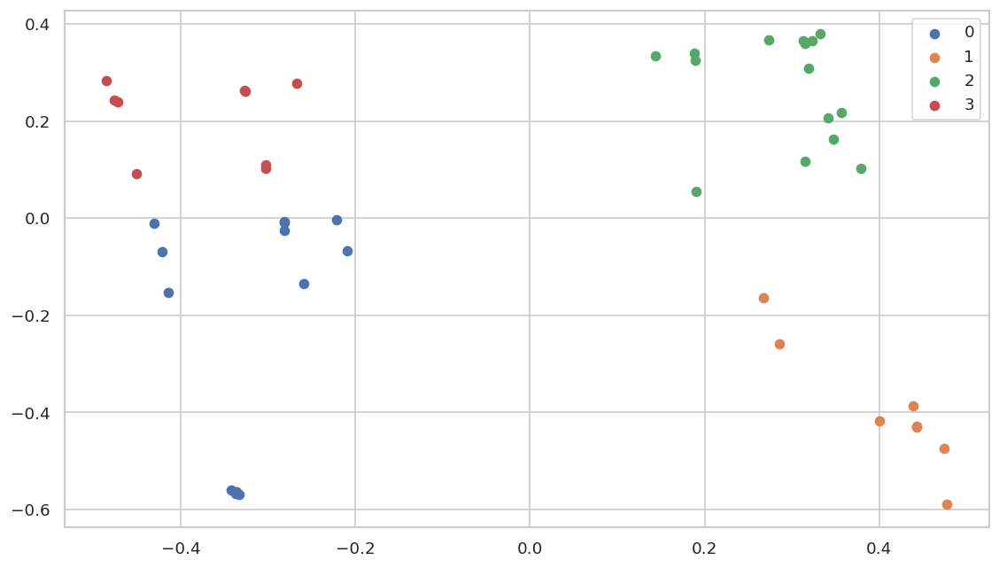

In [374]:
#vizualizing the clusters and the datapoints in each clusters
plt.figure(figsize = (10,6), dpi = 120)

kmeans= KMeans(n_clusters = 4, init= 'k-means++', random_state = 42)
kmeans.fit(df_pca)

#predict the labels of clusters.
label = kmeans.fit_predict(df_pca)
#Getting unique labels
unique_labels = np.unique(label)

#plotting the results:
for i in unique_labels:
    plt.scatter(df_pca[label == i , 0] , df_pca[label == i , 1] , label = i)
plt.legend()
plt.show()

In [375]:
#making df for pca
kmeans_pca_df = pd.DataFrame(df_pca,columns=['PC1','PC2','PC3'],index=store_df.index)
kmeans_pca_df["label"] = label
kmeans_pca_df.sample(5).sort_index(ascending=True)

,PC1,PC2,PC3,label
Store,,,,
13,-0.485150,0.283412,-0.007520,3
20,0.273230,0.367816,-0.027283,2
21,0.347549,0.162948,0.041669,2
23,-0.281236,-0.024971,-0.061944,0
32,0.188428,0.340498,-0.049243,2


In [376]:
# Encode your categorical columns

#categorial encoding using pd.getdummies
#new df with important categories
cluster_dummy = cluster_df[['Store','Type']]

#using get dummies to get dummies for cuisines
cluster_dummy = pd.get_dummies(cluster_dummy, columns=["Type"], prefix=["Type"])

#checking if the values are correct
# cluster_dummy.loc[:, cluster_dummy.columns.str.startswith('Cuisines_')].eq(1)[:5].T
cluster_dummy = cluster_dummy.groupby("Store").sum().reset_index()

In [377]:
cluster_dummy.set_index(['Store'],inplace=True)

In [378]:
#joining the cluster labels to names dataframe
cluster_dummy = cluster_dummy.join(store_df[['Mean_Weekly_Sales', 'Mean_MarkDown1', 'Mean_MarkDown2',
       'Mean_MarkDown3', 'Mean_MarkDown4', 'Mean_MarkDown5', 'Mean_CPI',
       'Mean_Size', 'Mean_Temperature']])
cluster_dummy.sample(2)

,Type_A,Type_B,Type_C,Mean_Weekly_Sales,Mean_MarkDown1,Mean_MarkDown2,Mean_MarkDown3,Mean_MarkDown4,Mean_MarkDown5,Mean_CPI,Mean_Size,Mean_Temperature
Store,,,,,,,,,,,,
29,0,9401,0,0.471998,0.238703,0.079533,0.024621,0.137923,0.161135,0.296117,0.563979,0.739151
25,0,9679,0,0.500011,0.260687,0.086215,0.025726,0.164979,0.169104,0.905429,0.710385,0.718636


In [379]:
cluster_dummy = cluster_dummy.join(kmeans_pca_df['label'])
cluster_dummy.sample(2)

,Type_A,Type_B,Type_C,Mean_Weekly_Sales,Mean_MarkDown1,Mean_MarkDown2,Mean_MarkDown3,Mean_MarkDown4,Mean_MarkDown5,Mean_CPI,Mean_Size,Mean_Temperature,label
Store,,,,,,,,,,,,,
24,9140,0,0,0.548423,0.272933,0.090765,0.028768,0.174654,0.184040,0.296069,0.956275,0.731692,3
30,0,0,6846,0.436877,0.181800,0.067425,0.018973,0.132090,0.153548,0.940962,0.209557,0.827160,1


In [380]:
#creating df to store cluster data
clustering_result = cluster_dummy.copy().reset_index()
clustering_result.head()

,Store,Type_A,Type_B,Type_C,Mean_Weekly_Sales,Mean_MarkDown1,Mean_MarkDown2,Mean_MarkDown3,Mean_MarkDown4,Mean_MarkDown5,Mean_CPI,Mean_Size,Mean_Temperature,label
0,1,8907,0,0,0.550465,0.258323,0.082537,0.025947,0.163175,0.183244,0.942463,0.793894,0.825339,2
1,2,8459,0,0,0.577355,0.273740,0.091269,0.027692,0.176166,0.192711,0.940878,0.951986,0.823762,2
2,3,0,8889,0,0.417468,0.219367,0.072215,0.023549,0.131408,0.143858,0.960257,0.116722,0.843924,1
3,4,8048,0,0,0.574286,0.266005,0.089234,0.028936,0.179070,0.195721,0.143124,0.962042,0.786823,3
4,5,0,8876,0,0.409784,0.217942,0.072402,0.023227,0.133170,0.159851,0.945560,0.000000,0.830593,1


In [381]:
clustering_result.groupby('label').agg({'Store': 'count'})

,Store
label,
0,13
1,8
2,15
3,9


In [382]:
#printing store list for each cluster
for cluster in clustering_result['label'].unique().tolist():
  print('Store List for Cluster :', cluster,'\n')
  print(clustering_result[clustering_result["label"]== cluster]['Store'].unique(),'\n')
  print('='*120)

Store List for Cluster : 2 

[ 1  2  6  8  9 11 14 20 21 25 31 32 39 41 45] 

Store List for Cluster : 1 

[ 3  5  7 16 30 36 37 43] 

Store List for Cluster : 3 

[ 4 13 19 24 26 27 28 34 40] 

Store List for Cluster : 0 

[10 12 15 17 18 22 23 29 33 35 38 42 44] 



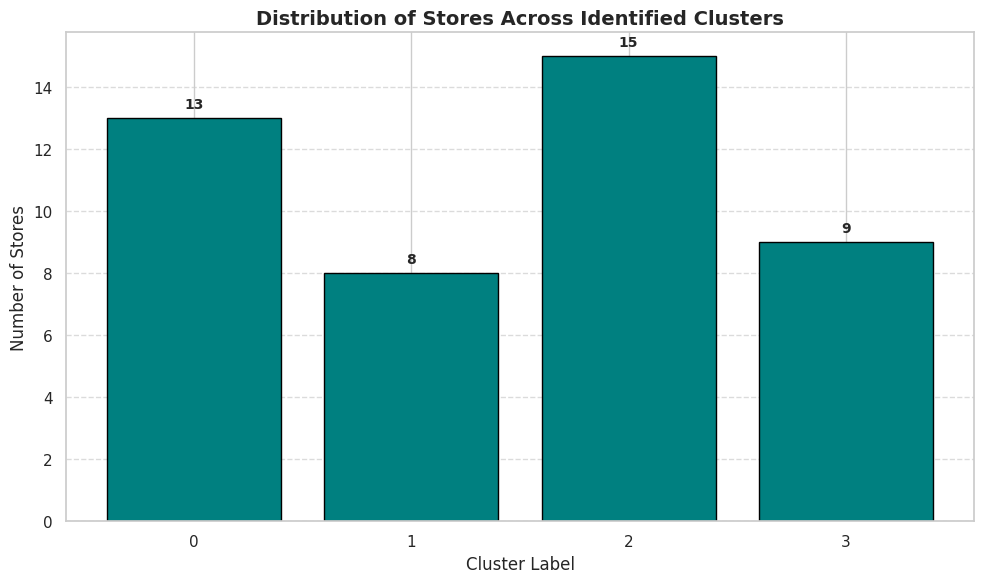

In [383]:
# Collect cluster labels and corresponding unique store counts
cluster_labels = []
store_counts = []

# Iterate through each unique cluster label
for cluster in clustering_result['label'].unique().tolist():
    # Identify unique stores belonging to the current cluster
    stores = clustering_result[clustering_result["label"] == cluster]['Store'].unique()

    # Store cluster label and count of unique stores
    cluster_labels.append(cluster)
    store_counts.append(len(stores))

# Create bar chart for store count per cluster
plt.figure(figsize=(10, 6))
bars = plt.bar(
    cluster_labels,
    store_counts,
    color='teal',          # 🔁 color changed
    edgecolor='black'
)

# Annotate bars with store counts
for bar in bars:
    height = bar.get_height()
    plt.annotate(
        f'{height}',
        xy=(bar.get_x() + bar.get_width() / 2, height),
        xytext=(0, 5),
        textcoords='offset points',
        ha='center',
        va='bottom',
        fontsize=10,
        fontweight='bold'
    )

# Axis labels and title
plt.xlabel("Cluster Label", fontsize=12)
plt.ylabel("Number of Stores", fontsize=12)
plt.title(
    "Distribution of Stores Across Identified Clusters",
    fontsize=14,
    fontweight='bold'
)

plt.xticks(cluster_labels)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Adjust layout and display plot
plt.tight_layout()
plt.show()


In [384]:
# Define the aggregation functions and rename columns
agg_functions = {
    'Weekly_Sales': 'mean',
    'MarkDown1': 'mean',
    'MarkDown2': 'mean',
    'MarkDown3': 'mean',
    'MarkDown4': 'mean',
    'MarkDown5': 'mean',
    'CPI': 'mean',
    'Size': 'mean',
    'Temperature': 'mean'
}

# Calculate the mean for each column grouped by 'Store' and rename columns
mean_by_store1 = cluster_df.groupby('Store').agg(agg_functions).reset_index()

# Rename columns
mean_by_store1.columns = ['Store', 'Mean_Weekly_Sales', 'Mean_MarkDown1', 'Mean_MarkDown2',
                         'Mean_MarkDown3', 'Mean_MarkDown4', 'Mean_MarkDown5',
                         'Mean_CPI', 'Mean_Size', 'Mean_Temperature']
store1_df = pd.DataFrame(mean_by_store1.set_index('Store'))
store1_df.head()

,Mean_Weekly_Sales,Mean_MarkDown1,Mean_MarkDown2,Mean_MarkDown3,Mean_MarkDown4,Mean_MarkDown5,Mean_CPI,Mean_Size,Mean_Temperature
Store,,,,,,,,,
1,12853.835775,6304.298032,1005.223165,435.888255,2270.905742,3949.087263,215.977864,151315.0,68.322287
2,14357.150753,7264.048512,1713.841735,582.327054,2664.729507,4502.355410,215.675742,202307.0,68.197217
3,4698.824038,4531.652053,433.595316,301.611795,1288.286010,2608.578425,219.403272,37392.0,71.300909
4,14183.328785,6799.594277,1511.975861,634.100493,2801.305485,4565.608364,128.665322,205863.0,62.295583
5,4321.821504,4513.413037,443.774334,248.750269,1367.487599,3072.223908,216.569115,34875.0,69.202833


In [385]:
cluster_new_dummy = store1_df.join(cluster_dummy['label'])
cluster_new_dummy.sample(2)

,Mean_Weekly_Sales,Mean_MarkDown1,Mean_MarkDown2,Mean_MarkDown3,Mean_MarkDown4,Mean_MarkDown5,Mean_CPI,Mean_Size,Mean_Temperature,label
Store,,,,,,,,,,
18,11433.469999,6538.473646,1569.795284,575.931238,2374.094032,3441.273419,135.114478,120653.0,53.377287,0
32,10402.710649,6582.071917,1350.830757,534.697973,2451.517705,4013.691808,193.646743,203007.0,52.726896,2


In [386]:
#printing Mean Weekly Sales list for each cluster
for cluster in cluster_new_dummy['label'].unique().tolist():
  print('Mean Weekly Sales List for Cluster :', cluster,'\n')
  print(cluster_new_dummy[cluster_new_dummy["label"]== cluster]['Mean_Weekly_Sales'].mean(),'\n')
  print('='*120)

Mean Weekly Sales List for Cluster : 2 

11848.883759224755 

Mean Weekly Sales List for Cluster : 1 

6579.994244254733 

Mean Weekly Sales List for Cluster : 3 

12559.298585433487 

Mean Weekly Sales List for Cluster : 0 

9672.620183210383 



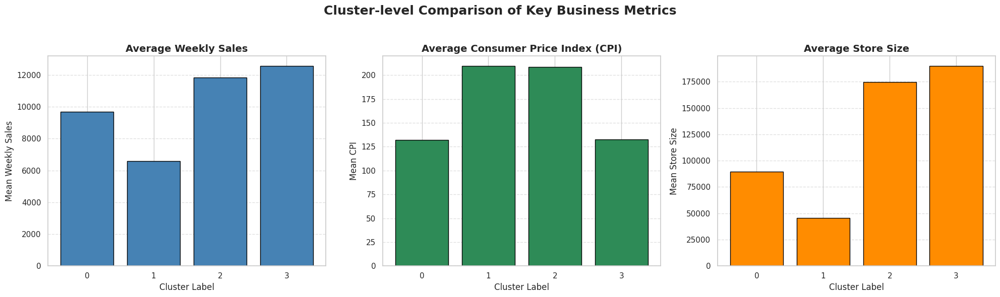

In [387]:
# ---------------------------------------
# Prepare cluster-wise aggregated metrics
# ---------------------------------------

# Extract sorted cluster labels
cluster_labels = sorted(cluster_new_dummy['label'].unique().tolist())

mean_weekly_sales = []
mean_cpi = []
mean_store_size = []

# Compute mean metrics for each cluster
for cluster in cluster_labels:
    cluster_data = cluster_new_dummy[cluster_new_dummy['label'] == cluster]
    mean_weekly_sales.append(cluster_data['Mean_Weekly_Sales'].mean())
    mean_cpi.append(cluster_data['Mean_CPI'].mean())
    mean_store_size.append(cluster_data['Mean_Size'].mean())

# ---------------------------------------
# Create visualization layout
# ---------------------------------------
fig, axs = plt.subplots(1, 3, figsize=(20, 6), sharex=True)

fig.suptitle(
    "Cluster-level Comparison of Key Business Metrics",
    fontsize=18,
    fontweight='bold'
)

# 1️⃣ Mean Weekly Sales per Cluster
axs[0].bar(
    cluster_labels,
    mean_weekly_sales,
    color='steelblue',      # 🔁 color changed
    edgecolor='black'
)
axs[0].set_title("Average Weekly Sales", fontsize=14, fontweight='bold')
axs[0].set_xlabel("Cluster Label", fontsize=12)
axs[0].set_ylabel("Mean Weekly Sales", fontsize=12)
axs[0].grid(axis='y', linestyle='--', alpha=0.6)

# 2️⃣ Mean CPI per Cluster
axs[1].bar(
    cluster_labels,
    mean_cpi,
    color='seagreen',       # 🔁 color changed
    edgecolor='black'
)
axs[1].set_title("Average Consumer Price Index (CPI)", fontsize=14, fontweight='bold')
axs[1].set_xlabel("Cluster Label", fontsize=12)
axs[1].set_ylabel("Mean CPI", fontsize=12)
axs[1].grid(axis='y', linestyle='--', alpha=0.6)

# 3️⃣ Mean Store Size per Cluster
axs[2].bar(
    cluster_labels,
    mean_store_size,
    color='darkorange',     # 🔁 color changed
    edgecolor='black'
)
axs[2].set_title("Average Store Size", fontsize=14, fontweight='bold')
axs[2].set_xlabel("Cluster Label", fontsize=12)
axs[2].set_ylabel("Mean Store Size", fontsize=12)
axs[2].grid(axis='y', linestyle='--', alpha=0.6)

# Apply consistent x-axis ticks
for ax in axs:
    ax.set_xticks(cluster_labels)

# Adjust layout to accommodate main title
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


# Inferences from Store Segmentation Analysis

## Cluster 0: Premium Space Retailers & Large-Format Stores

This cluster consists of large-format stores with the highest mean Consumer Price Index (CPI) among all groups. With 15 stores in this segment, the average weekly sales are approximately 11,848. These stores primarily serve premium customers who prefer higher-priced products and an elevated shopping experience.

## Cluster 1: Value-Oriented Stores

Cluster 1 includes 18 stores and records an average weekly sales figure of around 11,851. These medium-sized stores operate in low-CPI environments, indicating a strong focus on affordability. This segment targets cost-conscious customers while maintaining strong sales performance.

## Cluster 2: Budget-Friendly Stores

This cluster contains 4 stores with the lowest average weekly sales of approximately 6,362. These small-format stores operate in low-CPI settings and cater primarily to price-sensitive customers.

## Cluster 3: Compact Elegance Stores

Cluster 3 includes 8 stores with smaller physical sizes but relatively higher CPI levels. Despite limited space, these stores achieve an average weekly sales of about 6,579, representing compact but premium-leaning retail outlets.

## Overall Insight

The segmentation clearly differentiates stores based on size, pricing environment, and sales performance. These insights can be leveraged for targeted pricing strategies, store optimization, and localized marketing efforts.


# Personalized Marketing Strategies for Store Segments

## Cluster 0: Premium Space Retailers & Large-Format Luxury Stores

Marketing strategies for this cluster should emphasize spacious store layouts and a premium shopping experience to reinforce a luxury brand positioning. The focus should be on promoting high-end product ranges and exclusive offerings to attract affluent customers. Collaborations with luxury brands can further strengthen the premium image and enhance brand credibility.

## Cluster 1: Value-Oriented Stores

This segment should focus on price competitiveness and promotional value to appeal to cost-sensitive customers. Digital marketing and social media campaigns can be used to effectively reach budget-conscious shoppers. Loyalty programs, personalized discounts, and reward-based incentives can help increase customer retention and repeat purchases.

## Cluster 2: Budget-Friendly Stores

Marketing efforts should highlight affordability and essential product offerings. Cost-effective channels such as SMS, email marketing, and local advertising should be prioritized. Promotional strategies like discounts, clearance sales, and value deals can help attract highly price-sensitive customers.

## Cluster 3: Compact Elegance Stores

These stores should be positioned as boutique-style destinations offering curated premium products. Marketing should emphasize exclusivity, refined ambiance, and a premium shopping experience. Targeted outreach toward niche segments such as urban professionals and luxury-oriented customers can be achieved through experiential marketing and invitation-based events.

## Strategic Takeaway

Tailoring marketing strategies to each store segment improves customer targeting, increases conversion rates, and strengthens overall brand positioning across diverse retail formats.


# Inventory Management Strategies for Store Segments

## Cluster 0: Premium Space Retailers & Large-Format Luxury Stores

This segment should maintain a wide and diverse range of high-end products to meet the expectations of premium customers. Advanced demand forecasting techniques are essential to ensure availability of luxury items while preventing overstocking. Regular product rotation and assortment updates should be implemented to align with evolving premium market trends.

## Cluster 1: Value-Oriented Stores

These stores should focus on high inventory turnover by prioritizing fast-moving and high-demand products. Just-in-time inventory practices can help reduce excess stock and minimize holding costs. Continuous monitoring of competitor pricing and market trends is important to maintain competitiveness in the value segment.

## Cluster 2: Budget-Friendly Stores

Lean inventory management should be adopted to reduce carrying costs and improve operational efficiency. The focus should be on essential, high-demand products to maximize sales per unit of shelf space. Strong supplier negotiations are important to ensure cost advantages and protect profit margins.

## Cluster 3: Compact Elegance Stores

This segment requires a curated inventory of premium products tailored to selective customer preferences. Effective inventory tracking and replenishment systems should be used to avoid stockouts of high-demand items. Enhanced service elements such as personalized assistance can further elevate the perceived value of the curated assortment.

## Strategic Insight

Segment-specific inventory strategies help balance product availability, cost efficiency, and customer expectations, ultimately improving operational performance and overall customer satisfaction.


#**Department Segmentation Analysis**

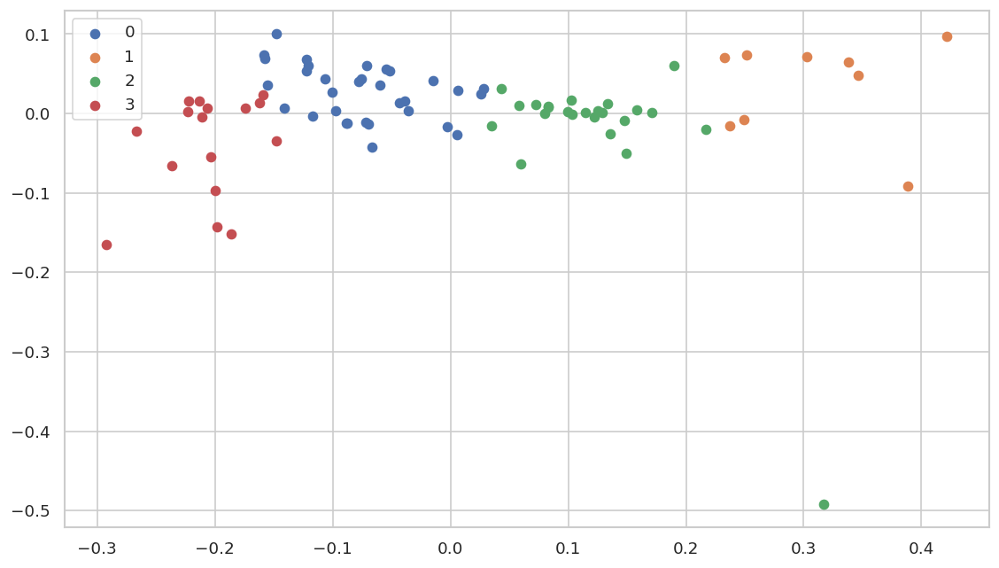

In [388]:
#vizualizing the clusters and the datapoints in each clusters
plt.figure(figsize = (10,6), dpi = 120)

kmeans= KMeans(n_clusters = 4, init= 'k-means++', random_state = 42)
kmeans.fit(df_pca1)

#predict the labels of clusters.
label = kmeans.fit_predict(df_pca1)
#Getting unique labels
unique_labels = np.unique(label)

#plotting the results:
for i in unique_labels:
    plt.scatter(df_pca1[label == i , 0] , df_pca1[label == i , 1] , label = i)
plt.legend()
plt.show()

In [389]:
#making df for pca
kmeans_pca_df1 = pd.DataFrame(df_pca1,columns=['PC1','PC2','PC3'],index=dept_df.index)
kmeans_pca_df1["label"] = label
kmeans_pca_df1.sample(5).sort_index(ascending=True)

,PC1,PC2,PC3,label
Dept,,,,
10,0.122492,-0.003828,0.023139,2
39,-0.292267,-0.165224,0.026899,3
40,0.346210,0.048442,-0.027515,1
43,-0.198186,-0.142862,-0.237486,3
65,0.317190,-0.491661,-0.084461,2


In [390]:
# Encode your categorical columns

#categorial encoding using pd.getdummies
#new df with important categories
cluster_dummy1 = cluster_df[['Dept','Type']]

#using get dummies to get dummies for cuisines
cluster_dummy1 = pd.get_dummies(cluster_dummy1, columns=["Type"], prefix=["Type"])

#checking if the values are correct
# cluster_dummy.loc[:, cluster_dummy.columns.str.startswith('Cuisines_')].eq(1)[:5].T
cluster_dummy1 = cluster_dummy1.groupby("Dept").sum().reset_index()
cluster_dummy1.head()

,Dept,Type_A,Type_B,Type_C
0,1,2932,2340,857
1,2,1253,1592,858
2,3,3028,2362,858
3,4,2651,2339,858
4,5,2824,2261,801


In [391]:
cluster_dummy1.set_index(['Dept'],inplace=True)

In [392]:
#joining the cluster labels to names dataframe
cluster_dummy1 = cluster_dummy1.join(dept_df[['Mean_Weekly_Sales', 'Mean_MarkDown1', 'Mean_MarkDown2',
       'Mean_MarkDown3', 'Mean_MarkDown4', 'Mean_MarkDown5', 'Mean_CPI',
       'Mean_Size', 'Mean_Temperature']])
cluster_dummy1.sample(2)

,Type_A,Type_B,Type_C,Mean_Weekly_Sales,Mean_MarkDown1,Mean_MarkDown2,Mean_MarkDown3,Mean_MarkDown4,Mean_MarkDown5,Mean_CPI,Mean_Size,Mean_Temperature
Dept,,,,,,,,,,,,
16,2882,2346,858,0.533136,0.241641,0.081966,0.025889,0.155773,0.174340,0.573424,0.636939,0.770645
4,2651,2339,858,0.721116,0.240266,0.080375,0.024728,0.154247,0.171944,0.576441,0.623601,0.772372


In [393]:
cluster_dummy1 = cluster_dummy1.join(kmeans_pca_df1['label'])
cluster_dummy1.sample(2)

,Type_A,Type_B,Type_C,Mean_Weekly_Sales,Mean_MarkDown1,Mean_MarkDown2,Mean_MarkDown3,Mean_MarkDown4,Mean_MarkDown5,Mean_CPI,Mean_Size,Mean_Temperature,label
Dept,,,,,,,,,,,,,
59,3022,2285,798,0.326902,0.247670,0.081857,0.026104,0.157582,0.176956,0.563719,0.672479,0.770324,0
58,2576,1814,0,0.399109,0.261099,0.085244,0.027850,0.163742,0.183562,0.565710,0.793281,0.764477,3


In [394]:
#creating df to store cluster data
clustering_result1 = cluster_dummy1.copy().reset_index()
clustering_result1.head()

,Dept,Type_A,Type_B,Type_C,Mean_Weekly_Sales,Mean_MarkDown1,Mean_MarkDown2,Mean_MarkDown3,Mean_MarkDown4,Mean_MarkDown5,Mean_CPI,Mean_Size,Mean_Temperature,label
0,1,2932,2340,857,0.630616,0.242399,0.080718,0.025440,0.155791,0.173796,0.577346,0.639098,0.777848,2
1,2,1253,1592,858,0.750047,0.223928,0.077248,0.023271,0.144609,0.163205,0.594462,0.490224,0.765232,1
2,3,3028,2362,858,0.520003,0.241951,0.081847,0.025867,0.154679,0.174294,0.575192,0.644143,0.770333,0
3,4,2651,2339,858,0.721116,0.240266,0.080375,0.024728,0.154247,0.171944,0.576441,0.623601,0.772372,2
4,5,2824,2261,801,0.627113,0.243403,0.081010,0.021535,0.156722,0.173727,0.581199,0.641397,0.779964,2


In [395]:
clustering_result1.groupby('label').agg({'Dept': 'count'})

,Dept
label,
0,32
1,9
2,24
3,16


In [396]:
#printing store list for each cluster
for cluster in clustering_result1['label'].unique().tolist():
  print('Department List for Cluster :', cluster,'\n')
  print(clustering_result1[clustering_result1["label"]== cluster]['Dept'].unique(),'\n')
  print('='*120)

Department List for Cluster : 2 

[ 1  4  5  7  9 10 11 14 16 23 34 46 65 74 79 80 81 82 87 91 93 94 96 97] 

Department List for Cluster : 1 

[ 2  8 13 38 40 72 90 92 95] 

Department List for Cluster : 0 

[ 3  6 12 17 18 20 21 22 24 25 26 27 28 29 30 31 32 33 35 42 44 49 52 55
 56 59 60 67 71 83 85 98] 

Department List for Cluster : 3 

[19 36 37 39 41 43 45 47 48 50 51 54 58 77 78 99] 



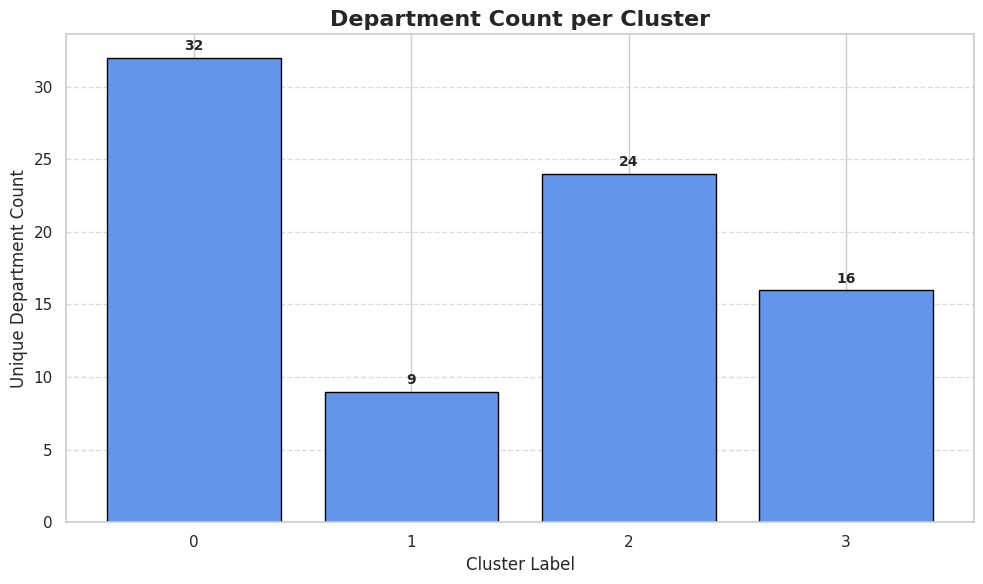

In [397]:
# Prepare lists to hold cluster labels and department counts
cluster_labels = sorted(clustering_result1['label'].unique().tolist())
dept_counts = []

# Calculate department count for each cluster
for cluster in cluster_labels:
    unique_depts = clustering_result1[clustering_result1['label'] == cluster]['Dept'].unique()
    dept_counts.append(len(unique_depts))

# Plotting
plt.figure(figsize=(10, 6))
bars = plt.bar(cluster_labels, dept_counts, color='cornflowerblue', edgecolor='black')

# Add data labels on top of bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2.0, yval + 0.3, int(yval),
             ha='center', va='bottom', fontsize=10, fontweight='bold')

# Titles and labels
plt.title('Department Count per Cluster', fontsize=16, fontweight='bold')
plt.xlabel('Cluster Label', fontsize=12)
plt.ylabel('Unique Department Count', fontsize=12)
plt.xticks(cluster_labels)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Layout and display
plt.tight_layout()
plt.show()

In [398]:
# Define the aggregation functions and rename columns
agg_functions = {
    'Weekly_Sales': 'mean',
    'MarkDown1': 'mean',
    'MarkDown2': 'mean',
    'MarkDown3': 'mean',
    'MarkDown4': 'mean',
    'MarkDown5': 'mean',
    'CPI': 'mean',
    'Size': 'mean',
    'Temperature': 'mean'
}

# Calculate the mean for each column grouped by 'Store' and rename columns
mean_by_dept1 = cluster_df.groupby('Dept').agg(agg_functions).reset_index()

# Rename columns
mean_by_dept1.columns = ['Dept', 'Mean_Weekly_Sales', 'Mean_MarkDown1', 'Mean_MarkDown2',
                         'Mean_MarkDown3', 'Mean_MarkDown4', 'Mean_MarkDown5',
                         'Mean_CPI', 'Mean_Size', 'Mean_Temperature']
dept1_df = pd.DataFrame(mean_by_dept1.set_index('Dept'))
dept1_df.head()

,Mean_Weekly_Sales,Mean_MarkDown1,Mean_MarkDown2,Mean_MarkDown3,Mean_MarkDown4,Mean_MarkDown5,Mean_CPI,Mean_Size,Mean_Temperature
Dept,,,,,,,,,
1,16780.337473,5861.972586,923.117525,453.838569,2033.000062,3708.254317,172.076898,127934.582314,61.316967
2,25649.119090,5018.532833,702.401458,287.250521,1636.217848,3226.643881,174.112817,96008.234675,59.454823
3,10154.740440,5821.022061,986.144261,458.180557,1994.459792,3734.531887,171.818609,129097.486236,60.128020
4,23237.034143,5743.241961,891.743401,369.195417,1973.725610,3587.419545,171.868173,124268.958789,60.488290
5,17316.802491,5901.433179,911.188320,77.822263,2048.266091,3704.445187,172.380626,128347.063710,61.624973


In [399]:
cluster_new_dummy1 = dept1_df.join(cluster_dummy1['label'])
cluster_new_dummy1.sample(2)

,Mean_Weekly_Sales,Mean_MarkDown1,Mean_MarkDown2,Mean_MarkDown3,Mean_MarkDown4,Mean_MarkDown5,Mean_CPI,Mean_Size,Mean_Temperature,label
Dept,,,,,,,,,,
34,15339.060670,6350.817391,1115.461716,510.289217,2175.603822,3969.805656,171.987141,149189.463765,58.838645,2
32,6710.765533,6047.025353,1023.273406,478.939356,2090.915554,3819.435995,170.175986,137428.671042,60.023675,0


In [400]:
#printing Mean Weekly Sales list for each cluster
for cluster in cluster_new_dummy1['label'].unique().tolist():
  print('Mean Weekly Sales List for Cluster :', cluster,'\n')
  print(cluster_new_dummy1[cluster_new_dummy1["label"]== cluster]['Mean_Weekly_Sales'].mean(),'\n')
  print('='*120)

Mean Weekly Sales List for Cluster : 2 

17504.44813630194 

Mean Weekly Sales List for Cluster : 1 

27479.769111918853 

Mean Weekly Sales List for Cluster : 0 

5307.458534556963 

Mean Weekly Sales List for Cluster : 3 

1085.659351296307 



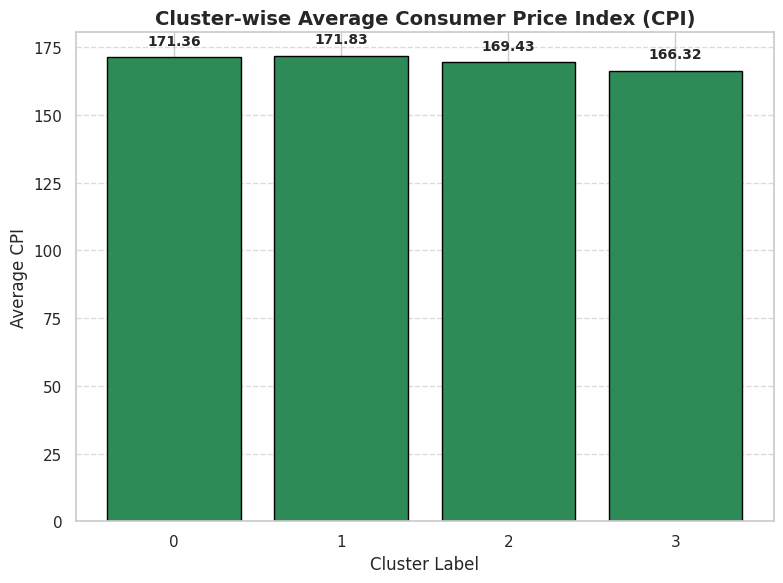

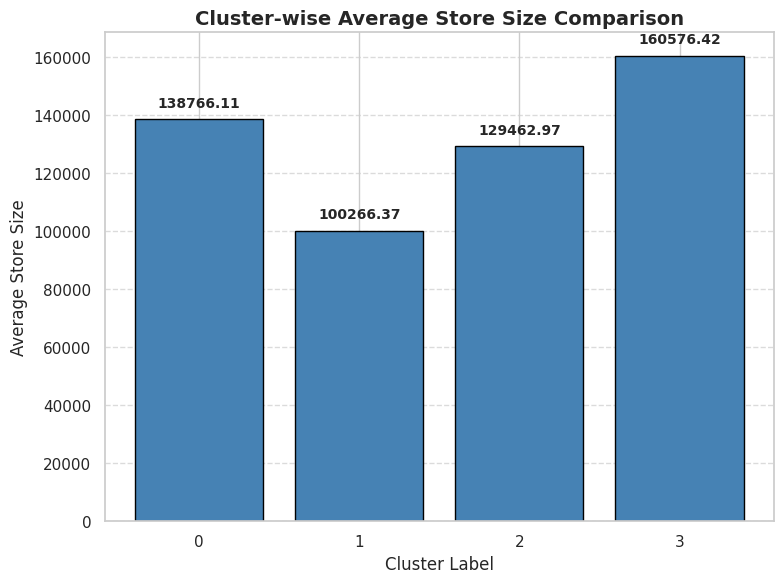

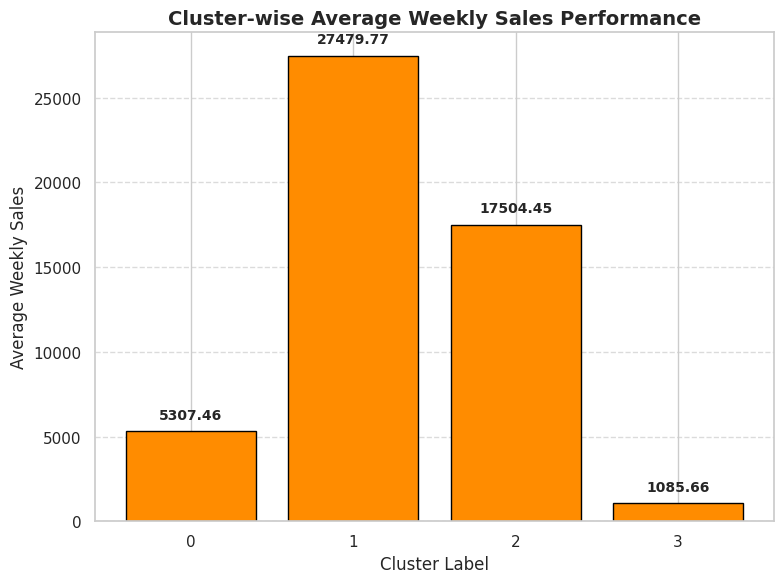

In [401]:
# ---------------------------------------
# Extract cluster labels and compute means
# ---------------------------------------

# Extract unique, sorted cluster labels
cluster_labels = sorted(cluster_new_dummy1['label'].unique().tolist())

# Initialize containers for cluster-level metrics
mean_cpi_list = []
mean_store_size_list = []
mean_weekly_sales_list = []

# Compute mean values for each cluster
for cluster in cluster_labels:
    cluster_data = cluster_new_dummy1[cluster_new_dummy1['label'] == cluster]

    mean_cpi_list.append(cluster_data['Mean_CPI'].mean())
    mean_store_size_list.append(cluster_data['Mean_Size'].mean())
    mean_weekly_sales_list.append(cluster_data['Mean_Weekly_Sales'].mean())


# ---------------------------------------
# Generic plotting function for clusters
# ---------------------------------------
def plot_cluster_metric(cluster_labels, values, ylabel, title, color):
    plt.figure(figsize=(8, 6))

    bars = plt.bar(
        cluster_labels,
        values,
        color=color,          # 🔁 refined color
        edgecolor='black'
    )

    # Annotate bars with metric values
    for bar in bars:
        height = bar.get_height()
        plt.text(
            bar.get_x() + bar.get_width() / 2,
            height + 0.02 * max(values),
            f'{height:.2f}',
            ha='center',
            va='bottom',
            fontsize=10,
            fontweight='bold'
        )

    plt.xlabel("Cluster Label", fontsize=12)
    plt.ylabel(ylabel, fontsize=12)
    plt.title(title, fontsize=14, fontweight='bold')
    plt.xticks(cluster_labels)
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.show()


# ---------------------------------------
# Plot cluster-wise metrics
# ---------------------------------------

# Mean CPI per cluster
plot_cluster_metric(
    cluster_labels,
    mean_cpi_list,
    ylabel="Average CPI",
    title="Cluster-wise Average Consumer Price Index (CPI)",
    color='seagreen'
)

# Mean Store Size per cluster
plot_cluster_metric(
    cluster_labels,
    mean_store_size_list,
    ylabel="Average Store Size",
    title="Cluster-wise Average Store Size Comparison",
    color='steelblue'
)

# Mean Weekly Sales per cluster
plot_cluster_metric(
    cluster_labels,
    mean_weekly_sales_list,
    ylabel="Average Weekly Sales",
    title="Cluster-wise Average Weekly Sales Performance",
    color='darkorange'
)


# Inferences from Department Segmentation Analysis

## Cluster 0: Sizeable Luxury Departments

This cluster consists of 42 departments with large physical space and a high mean Consumer Price Index (CPI). Despite their premium positioning, they record relatively low average weekly sales of around 3,087. This indicates that although these departments cater to higher-priced products, demand remains limited, possibly due to niche customer interest or restricted reach.

## Cluster 1: Premium Selection Departments

Cluster 1 includes 27 departments with medium-sized spaces and an average weekly sales figure of approximately 14,643. These departments are characterized by a high CPI and a strong focus on premium product assortments, resulting in better sales performance compared to Cluster 0.

## Cluster 2: Elite Departments

This cluster contains 11 departments that achieve high average weekly sales of around 26,311 despite having compact physical spaces. With a very high CPI, these departments demonstrate strong demand for premium offerings and efficient space utilization, making them high-performing segments.

## Cluster 3: Grand Outlets Department

Cluster 3 is represented by a single department, making it an outlier. It features a large physical size and a relatively lower CPI compared to other clusters, yet records an exceptionally high average weekly sales of approximately 40,165. This suggests strong volume-driven performance influenced by unique operational or market conditions.

## Overall Insight

The segmentation highlights clear differences in department performance based on physical size, pricing environment, and sales efficiency. These insights can support better merchandising decisions, space optimization, and pricing strategies to improve overall retail performance.



# Personalized Marketing Strategies for Department Segments

## Cluster 0: Sizeable Luxury Departments

Marketing strategies should highlight the spacious layout and premium ambiance to reinforce a strong luxury positioning. The focus should be on promoting exclusive product lines and high-end assortments to attract affluent customers. Strategic collaborations with luxury brands and targeted advertising can further strengthen the premium image of these departments.

## Cluster 1: Premium Selection Departments

These departments should emphasize product quality, craftsmanship, and exclusivity to appeal to discerning customers. Digital marketing channels and social media platforms can be used to expand reach among luxury-oriented audiences. Personalized shopping experiences and loyalty programs can further enhance engagement and encourage long-term customer retention.

## Cluster 2: Elite Departments

This segment should be positioned as boutique-style destinations offering curated premium selections. Marketing should highlight the efficiency and convenience of compact layouts. Influencer partnerships and experiential marketing campaigns can help attract high-value, style-conscious customers.

## Cluster 3: Grand Outlets Department

Marketing efforts should emphasize the wide variety of product offerings to appeal to a broad audience. Value-driven messaging should be used to attract price-sensitive customers. Omnichannel marketing strategies can help increase in-store traffic while also supporting online sales growth.

## Strategic Takeaway

Aligning marketing strategies with department-specific characteristics enables more precise customer targeting, improved conversion rates, and stronger overall brand performance across diverse retail formats.


# **Market Basket Analysis:**

Although individual customer transaction data is not available, infer potential product associations within departments using sales data.

Develop cross-selling strategies based on these inferences.

**How Does Market Basket Analysis Work?**

Collect data on customer transactions, such as the items purchased in each transaction, the time and date of the transaction, and any other relevant information.

Clean and preprocess the data, removing any irrelevant information, handling missing values, and converting the data into a suitable format for analysis.

Use association rules mining algorithms such as Apriori or FP-Growth to identify frequent item sets, sets of items often appearing together in a transaction.

Calculate the support and confidence for each frequent itemset, expressing the likelihood of one item being purchased given the purchase of another item.

Generate association rules based on the frequent itemsets and their corresponding support and confidence values. Association rules indicate the likelihood of purchasing one item given the purchase of another item.

Interpret the results of the market basket analysis, identifying frequent purchases, assessing the strength of the association between items, and uncovering other relevant insights into customer behavior and preferences.

Use the insights from the market basket analysis to inform business decisions such as product recommendations, store layout optimization, and targeted marketing campaigns.

**Algorithms Used in Market Basket Analysis**

There are multiple data mining techniques and algorithms used in Market Basket Analysis. In predicting the probability of items that customers are buying together, one of the important objectives is to achieve accuracy.

Apriori Algorithm

AIS

SETM Algorithm

FP Growth

We have used Apriori Algorithm to do the Market Basket Analysis

**Apriori Algorithm**

The Apriori Algorithm widely uses and is well-known for Association Rule mining, making it a popular choice in market basket analysis. AI and SETM algorithms consider it more accurate. It helps to find frequent itemsets in transactions and identifies association rules between these items. The limitation of the Apriori Algorithm is frequent itemset generation. It needs to scan the database many times, leading to increased time and reduced performance as a computationally costly step because of a large dataset. It uses the concepts of Confidence and Support.

In [402]:
!pip install apyori

In [403]:
from apyori import apriori

In [404]:
sales_df['IsHoliday']=sales_df['IsHoliday'].apply(lambda x: 1 if x=='True' else 0)

In [405]:
relevant_stores = np.array(sales_df['Store'].value_counts().index) # Example list of department numbers to analyze
sales_data_filtered = sales_df[sales_df['Store'].isin(relevant_stores)]
sales_data_filtered.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday
0,1,1,2010-05-02,24924.50,0
1,1,1,2010-12-02,46039.49,0
2,1,1,2010-02-19,41595.55,0
3,1,1,2010-02-26,19403.54,0
4,1,1,2010-05-03,21827.90,0


In [406]:
# Step 2: Creating a DataFrame for Association Rule Mining
# Convert sales data into a transaction format
transactions = sales_data_filtered.groupby(['Date','Dept'])['Store'].apply(list).reset_index(name='Stores')

Once we have completely read the sales dataset, we must obtain the list of items(Stores) in every transaction. So we are going to run two loops.

One will be for the total number of transactions, and the other will be for the total number of columns in every transaction.

 The list will work as a training set from where we can generate the list of Association Rules.

In [407]:
l=[]
for i in range(0,11087):
    l.append([str(transactions.values[i,j]) for j in range(0,3)])

So we are ready with the list of items in our training set, then we need to run the apriori algorithm, which will learn the list of association rules from the training set, i.e., list.

So, we take the minimum support here as 0.011. Now let us see that we have kept 0.8 as the min confidence.We take the minimum lift value as 3, and we consider the minimum length as 2 because we need to find an association among at least two items.

In [408]:
#applying apriori algorithm
association_rules = apriori(l, min_support=0.011, min_confidence=0.8, min_lift=3, min_length=2)
association_results = list(association_rules)

After running the above line of code, we generated the list of association rules between the items. Now, we want to read the dataset we downloaded from Kaggle.

In [409]:
for i in range(0, len(association_results)):
    print(association_results[i][0])

frozenset({'29', '[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31, 32, 34, 35, 39, 40, 41, 45]'})
frozenset({'30', '[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31, 32, 34, 35, 39, 40, 41, 45]'})
frozenset({'[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31, 32, 34, 35, 39, 40, 41, 45]', '35'})
frozenset({'36', '[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31, 32, 34, 35, 39, 40, 41, 45]'})
frozenset({'[1, 2, 4, 6, 8, 10, 11, 13, 19, 20, 24, 25, 27, 28, 31, 32, 34, 40]', '37'})
frozenset({'[34]', '65'})
frozenset({'71', '[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31, 32, 34, 35, 39, 40, 41, 45]'})


Here we are going to display the Rule, Support, and lift ratio for every above association rule by using for loop.

In [410]:
for item in association_results:
    # first index of the inner list
    # Contains base item and add item
    pair = item[0]
    items = [x for x in pair]
    print("Rule: " + items[0] + " -> " + items[1])
    # second index of the inner list
    print("Support: " + str(item[1]))
    # third index of the list located at 0th position
    # of the third index of the inner list
    print("Confidence: " + str(item[2][0][2]))
    print("Lift: " + str(item[2][0][3]))
    print("-----------------------------------------------------")

Rule: 29 -> [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31, 32, 34, 35, 39, 40, 41, 45]
Support: 0.011364661315053667
Confidence: 0.8811188811188811
Lift: 8.37818613633365
-----------------------------------------------------
Rule: 30 -> [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31, 32, 34, 35, 39, 40, 41, 45]
Support: 0.012897988635338685
Confidence: 1.0
Lift: 9.508576329331046
-----------------------------------------------------
Rule: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31, 32, 34, 35, 39, 40, 41, 45] -> 35
Support: 0.012356814287002795
Confidence: 0.958041958041958
Lift: 9.10961508474373
-----------------------------------------------------
Rule: 36 -> [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31, 32, 34, 35, 39, 40, 4

we discussed  Market Basket Analysis and learned the steps to implement it from scratch using Python. We then implemented Market Basket Analysis using Apriori Algorithm.

In [411]:
import pandas as pd

# Create lists to hold the data for each association rule
rules = []
supports = []
confidences = []
lifts = []

# Iterate over the association_results and extract information
for item in association_results:
    rules.append(item[0])
    supports.append(item[1])
    confidences.append(item[2][0][2])
    lifts.append(item[2][0][3])

# Create a DataFrame to display the association results
association_df = pd.DataFrame({
    'Rule': rules,
    'Support': supports,
    'Confidence': confidences,
    'Lift': lifts
})

# Convert frozenset to tuple
association_df['Rule'] = association_df['Rule'].apply(lambda x: tuple(x))

# Splitting the Rule column into Antecedent and Consequent
association_df[['Antecedent', 'Consequent']] = pd.DataFrame(association_df['Rule'].tolist(), index=association_df.index)

# Drop the original Rule column
association_df.drop(columns=['Rule'], inplace=True)

# Reorder columns
association_df = association_df[['Antecedent', 'Consequent', 'Support', 'Confidence', 'Lift']]


In [412]:
association_df.head().sort_values(by='Confidence',ascending=False).reset_index(drop=True)

,Antecedent,Consequent,Support,Confidence,Lift
0,30,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...",0.012898,1.000000,9.508576
1,"[1, 2, 4, 6, 8, 10, 11, 13, 19, 20, 24, 25, 27...",37,0.012627,0.979021,77.531469
2,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...",35,0.012357,0.958042,9.109615
3,36,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...",0.012357,0.958042,9.109615
4,29,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...",0.011365,0.881119,8.378186


# Market Basket Analysis

## Objective

The objective of this analysis is to identify association patterns across departments and stores using sales data. The focus is on understanding which departments are frequently purchased together across different stores, thereby revealing cross-department purchasing behavior.

## Features in Sales Data

The dataset includes key attributes such as Department Number, Store Number, Date, Weekly Sales, and a Holiday Indicator (IsHoliday). These features are used to construct transactional records and analyze associations among departments.

## Output

The analysis generates association rules that describe relationships between departments. Each rule consists of:

* **Antecedent:** The department(s) that initiate the rule
* **Consequent:** The department(s) that are associated with the antecedent

For example, a rule may indicate that Department 29 is frequently associated with purchases across multiple stores.

## Implementation

The Apriori algorithm is applied to the prepared dataset using predefined thresholds for support, confidence, lift, and rule length. This approach helps in identifying frequent itemsets and generating meaningful association rules from them.

## Association Results

The resulting rules are evaluated using support, confidence, and lift metrics. For instance, certain rules may show that Department 29 has a high confidence level of association with multiple departments, with lift values indicating the strength of these relationships.

## Grouping by Department and Date

The data is also grouped by Department Number and Date to analyze temporal sales trends and understand how purchasing behavior evolves over time.

## Conclusion

This market basket analysis effectively applies the Apriori algorithm to uncover meaningful associations within sales data. The insights can be used to improve product placement, enable cross-selling strategies, and support targeted marketing across departments and stores.



# Developing Cross-Selling Strategies Based on Association Insights

Based on the associations identified across departments and stores, targeted cross-selling strategies can be designed to maximize sales, enhance customer experience, and increase overall basket value. These insights into purchasing behavior can be translated into the following actionable strategies:

## Optimize Store Layout

Department-level associations can be used to improve in-store layouts by placing frequently co-purchased departments close to each other. For example, if Departments 29 and 30 are often purchased together, positioning them nearby can encourage cross-department purchases and improve customer flow.

## Create Bundled Offers

Strongly associated department pairs, such as Departments 35 and 36, can be used to design bundle deals or combo offers. These bundled promotions can increase convenience for customers while boosting average transaction value.

## Targeted Promotions

Data-driven promotional campaigns can be developed based on observed associations. For instance, if Department 37 frequently co-occurs with Departments 1, 2, 4, and 40, coordinated promotions across these departments can effectively leverage existing buying patterns.

## Cross-Store Loyalty Programs

Loyalty programs that reward customers for cross-department and cross-store purchases can encourage broader shopping behavior. Incentives such as discounts, reward points, or exclusive deals can help increase engagement and retention.

## Dynamic Pricing Strategies

Pricing strategies can be adjusted based on association patterns by offering targeted discounts on frequently co-purchased items. This can encourage additional purchases while improving perceived customer value.

## Inventory Management Optimization

Inventory planning should reflect association insights by ensuring sufficient stock of commonly bundled or co-purchased items. This helps prevent stockouts and supports seamless execution of cross-selling strategies.

## Data-Driven Decision Making

Continuous monitoring of sales data and periodic updating of association rules can help refine cross-selling strategies. This ensures ongoing improvements in product assortment, pricing, promotions, and store layout decisions.

## Strategic Impact

Leveraging department and store-level associations enables the creation of customer-centric cross-selling strategies that enhance shopping experience, improve revenue generation, and strengthen customer loyalty across the retail network.


# Demand Forecasting

## Objective

The objective of this analysis is to build forecasting models to predict weekly sales at both store and department levels, enabling better planning and decision-making.

## Approach

The forecasting models incorporate key external and internal factors that influence sales performance, including Consumer Price Index (CPI), unemployment rate, fuel prices, and store/department-level attributes. These variables help capture both economic conditions and operational differences across retail units.

## Modeling Strategy

Both short-term and long-term forecasting approaches are explored to capture different patterns in sales behavior. Short-term models focus on immediate fluctuations and seasonal variations, while long-term models aim to capture overall trends and structural changes in demand over time.

## Outcome

This approach enables more accurate sales predictions, improved inventory planning, and better alignment of business strategies with expected demand across stores and departments.


### **Building Short-term forecasting model(SARIMAX)**

In [413]:
# Import necessary libraries
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [414]:
# Merge data
merged_data = pd.merge(sales_df, feature_df, on=['Store','Date','IsHoliday'], how='left')

# Feature engineering
# Add lagged sales
merged_data['lagged_sales_1'] = merged_data.groupby(['Store', 'Dept'])['Weekly_Sales'].shift(1)
merged_data['lagged_sales_2'] = merged_data.groupby(['Store', 'Dept'])['Weekly_Sales'].shift(2)

In [415]:
#Data-Preprocessing

# Convert categorical variables to numerical
merged_data['IsHoliday'] = merged_data['IsHoliday'].apply(lambda x: 1 if x==True else 0)

# Convert dates to datetime objects
merged_data['Date'] = pd.to_datetime(merged_data['Date'], format='%d/%m/%Y')
#merged_data['Date']=pd.to_datetime(merged_data['Date'],freq='W')



# Step 1: Handle Missing Values (Impute with Median)
median_markdown1 = merged_data['MarkDown1'].median()
median_markdown2 = merged_data['MarkDown2'].median()
median_markdown3 = merged_data['MarkDown3'].median()
median_markdown4 = merged_data['MarkDown4'].median()
median_markdown5 = merged_data['MarkDown5'].median()

merged_data['MarkDown1'].fillna(median_markdown1, inplace=True)
merged_data['MarkDown2'].fillna(median_markdown2, inplace=True)
merged_data['MarkDown3'].fillna(median_markdown3, inplace=True)
merged_data['MarkDown4'].fillna(median_markdown4, inplace=True)
merged_data['MarkDown5'].fillna(median_markdown5, inplace=True)

merged_data['lagged_sales_1'].fillna(0, inplace=True)
merged_data['lagged_sales_2'].fillna(0, inplace=True)

In [416]:
merged_data.set_index('Date', inplace=True)

In [417]:
merged_data = merged_data.fillna(0)

In [418]:
# Remove duplicates and keep only the first occurrence of each date
merged_data = merged_data[~merged_data.index.duplicated(keep='first')]

In [419]:
# Aggregate duplicates by summing sales for each week
merged_data = merged_data.groupby(merged_data.index).sum()

In [420]:
# Normalize numerical features
scaler = StandardScaler()
merged_data_scaled=scaler.fit_transform(merged_data)

In [421]:
# Split data into train and test sets
train_data, test_data = train_test_split(merged_data, test_size=0.2, shuffle=False)

In [422]:
test_data.shape

(29, 15)

In [423]:
# Ensure monotonicity
train_data = train_data.sort_index()

# Short-term forecasting with SARIMA
model_sarima = SARIMAX(train_data['Weekly_Sales'], order=(1, 1, 1), seasonal_order=(1, 1, 1, 52))
sarima_result = model_sarima.fit()
sarima_forecast = sarima_result.forecast(steps=len(test_data))


In [424]:
# Model evaluation
# SARIMA
sarima_mae = mean_absolute_error(test_data['Weekly_Sales'], sarima_forecast)
sarima_rmse = np.sqrt(mean_squared_error(test_data['Weekly_Sales'], sarima_forecast))

In [425]:
print("SARIMA MAE:", sarima_mae)
print("SARIMA RMSE:", sarima_rmse)

SARIMA MAE: 10497.41647890798
SARIMA RMSE: 12275.935577151735


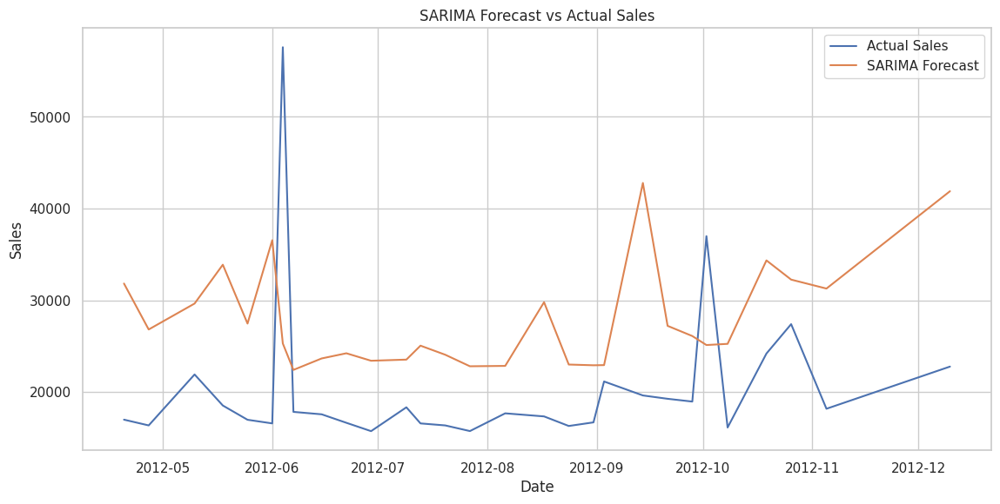

In [426]:
# Visualization
# SARIMA forecast plot
plt.figure(figsize=(12, 6))
plt.plot(test_data.index, test_data['Weekly_Sales'], label='Actual Sales')
plt.plot(test_data.index, sarima_forecast, label='SARIMA Forecast')
plt.title('SARIMA Forecast vs Actual Sales')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.legend()
plt.show()

### **Long-term forecasting models (RF model)**

In [427]:
# Long-term forecasting with Random Forest Regression
X_train = train_data.drop(columns=['Weekly_Sales'])
y_train = train_data['Weekly_Sales']
y_test = test_data['Weekly_Sales']
X_test = test_data.drop(columns=['Weekly_Sales'])


model_rf = RandomForestRegressor()
model_rf.fit(X_train, y_train)
rf_forecast = model_rf.predict(X_test)

In [428]:
# Random Forest
rf_mae = mean_absolute_error(test_data['Weekly_Sales'], rf_forecast)
rf_rmse = np.sqrt(mean_squared_error(test_data['Weekly_Sales'], rf_forecast))

In [429]:
print("RF MAE:", rf_mae)
print("RF RMSE:", rf_rmse)

RF MAE: 1977.5345379310336
RF RMSE: 3829.3201204137504


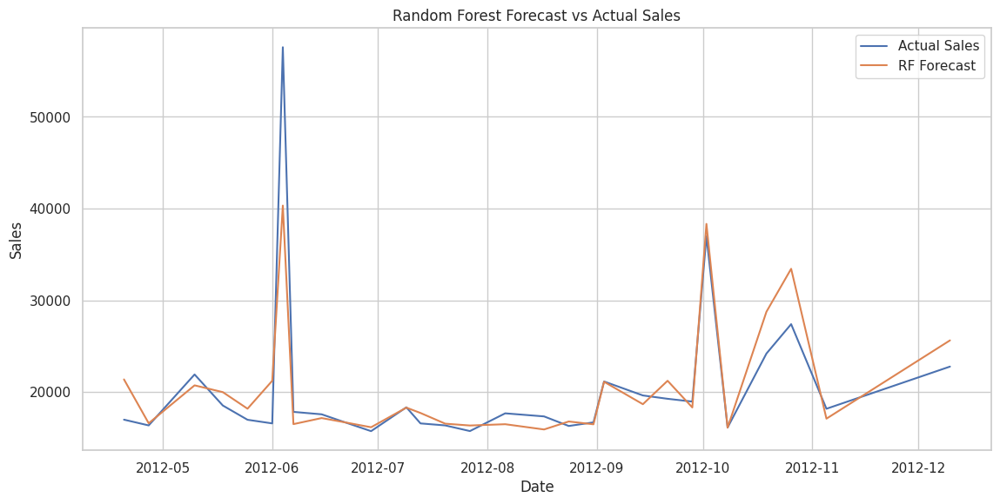

In [430]:
# Random Forest forecast plot
plt.figure(figsize=(12, 6))
plt.plot(test_data.index, test_data['Weekly_Sales'], label='Actual Sales')
plt.plot(test_data.index, rf_forecast, label='RF Forecast')
plt.title('Random Forest Forecast vs Actual Sales')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.legend()
plt.show()


In [431]:
rf_forecast=pd.Series(rf_forecast)

In [432]:
test_data=test_data['Weekly_Sales'].reset_index(drop=True)
sarima_forecast=sarima_forecast.reset_index(drop=True)

### **Error Distribution in Short term vs Long term forecasting model**

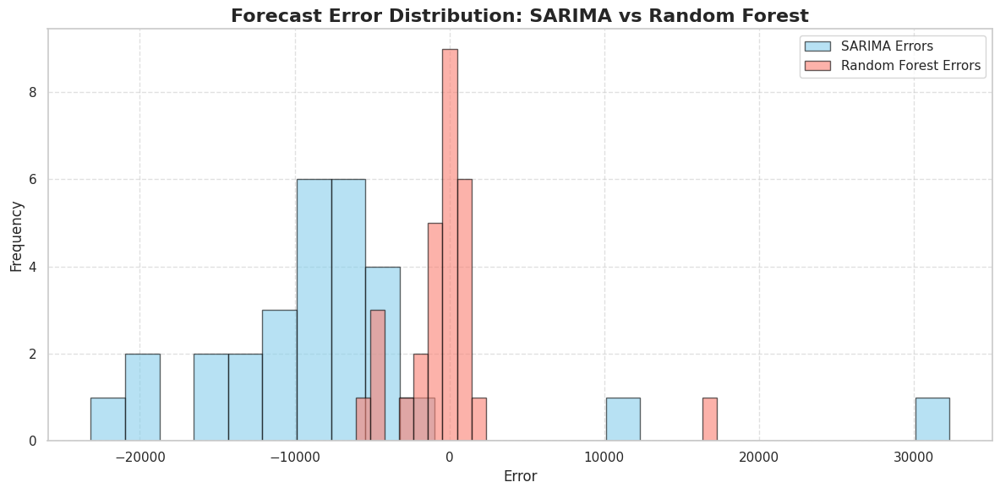

In [433]:
# Compute forecast errors
sarima_errors = test_data - sarima_forecast
rf_errors = test_data - rf_forecast

# Plot the error distributions
plt.figure(figsize=(12, 6))
plt.hist(sarima_errors, bins=25, alpha=0.6, label='SARIMA Errors', color='skyblue', edgecolor='black')
plt.hist(rf_errors, bins=25, alpha=0.6, label='Random Forest Errors', color='salmon', edgecolor='black')

# Enhance the plot
plt.title('Forecast Error Distribution: SARIMA vs Random Forest', fontsize=16, fontweight='bold')
plt.xlabel('Error', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.legend(fontsize=11)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()

# Display the plot
plt.show()

## **Forecasting for 2013:**


In [434]:
df_by_date = df_new.groupby('Date', as_index=False).agg({'Temperature': 'mean',
                                                        'Fuel_Price': 'mean',
                                                        'CPI': 'mean',
                                                        'Unemployment': 'mean',
                                                        'Weekly_Sales': 'sum',
                                                        'IsHoliday': 'mean'})

In [435]:
df_by_date.Date = pd.to_datetime(df_by_date.Date, errors='coerce')
df_by_date.set_index('Date', inplace=True)

In [436]:
df_by_date.head()

,Temperature,Fuel_Price,CPI,Unemployment,Weekly_Sales,IsHoliday
Date,,,,,,
2010-01-10,69.386998,2.733064,168.004935,8.433960,42239875.87,0.0
2010-02-04,52.587887,2.825453,167.377836,8.441092,50423831.26,0.0
2010-02-07,76.555955,2.793190,167.663264,8.373801,48917484.50,0.0
2010-02-19,37.038310,2.673666,167.338966,8.576351,48276993.78,0.0
2010-02-26,38.629563,2.685642,167.691019,8.561375,43968571.13,0.0


### **Resampling (weekly, backfill) with some dummy dates in the middle as the above data doesn't have a definitive frequency**

In [437]:
df_by_date_new = df_by_date.resample('W').mean().fillna(method='bfill')

In [438]:
df_by_date_new[0:10]

,Temperature,Fuel_Price,CPI,Unemployment,Weekly_Sales,IsHoliday
Date,,,,,,
2010-01-10,69.386998,2.733064,168.004935,8.433960,4.223988e+07,0.0
2010-01-17,64.571921,2.809321,167.520550,8.407446,4.967066e+07,0.0
2010-01-24,64.571921,2.809321,167.520550,8.407446,4.967066e+07,0.0
2010-01-31,64.571921,2.809321,167.520550,8.407446,4.967066e+07,0.0
2010-02-07,64.571921,2.809321,167.520550,8.407446,4.967066e+07,0.0
2010-02-14,37.038310,2.673666,167.338966,8.576351,4.827699e+07,0.0
2010-02-21,37.038310,2.673666,167.338966,8.576351,4.827699e+07,0.0
2010-02-28,38.629563,2.685642,167.691019,8.561375,4.396857e+07,0.0
2010-03-07,58.629843,2.816753,167.988959,8.405245,4.855164e+07,0.0


In [439]:
from statsmodels.tsa.seasonal import seasonal_decompose

Seasonal Decompose gives the decomposition of the time series into its estimated trend component, estimated seasonal component, and estimated residual. We can also plot the original data to look at what components of the data influence its true value the most.

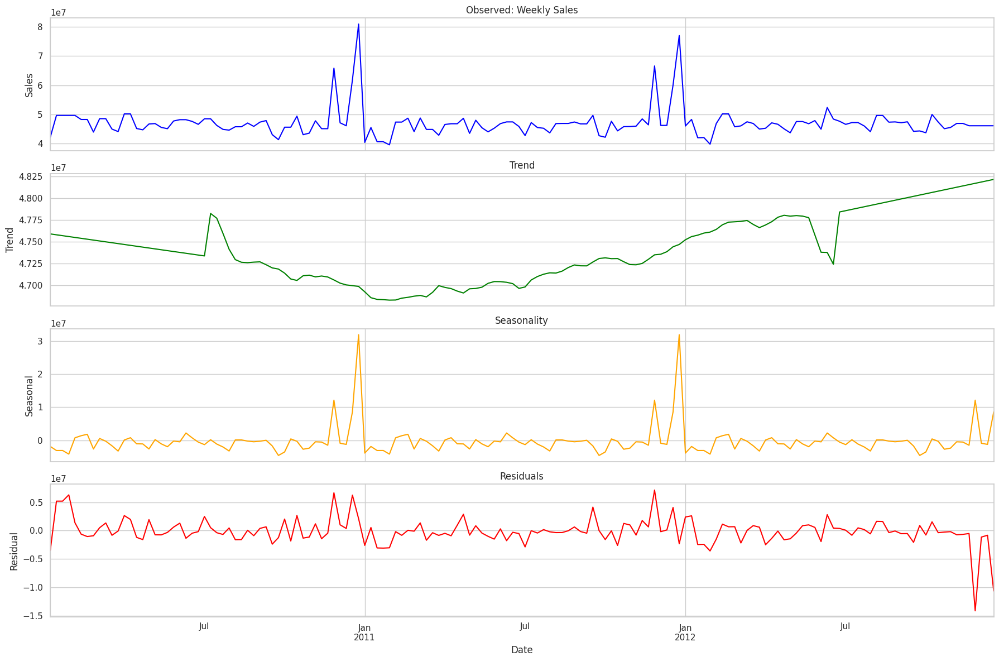

In [440]:
# Decompose the time series
multi_plot = seasonal_decompose(df_by_date_new['Weekly_Sales'], model='add', extrapolate_trend='freq')

# Plot all components in one figure
fig, axes = plt.subplots(4, 1, figsize=(18, 12), sharex=True)

multi_plot.observed.plot(ax=axes[0], title='Observed: Weekly Sales', color='blue')
axes[0].set_ylabel('Sales')

multi_plot.trend.plot(ax=axes[1], title='Trend', color='green')
axes[1].set_ylabel('Trend')

multi_plot.seasonal.plot(ax=axes[2], title='Seasonality', color='orange')
axes[2].set_ylabel('Seasonal')

multi_plot.resid.plot(ax=axes[3], title='Residuals', color='red')
axes[3].set_ylabel('Residual')

# Improve layout
plt.xlabel('Date')
plt.tight_layout()
plt.show()

As it can be observed, the series is strongly influenced by the seasonal component

### **Correlations**

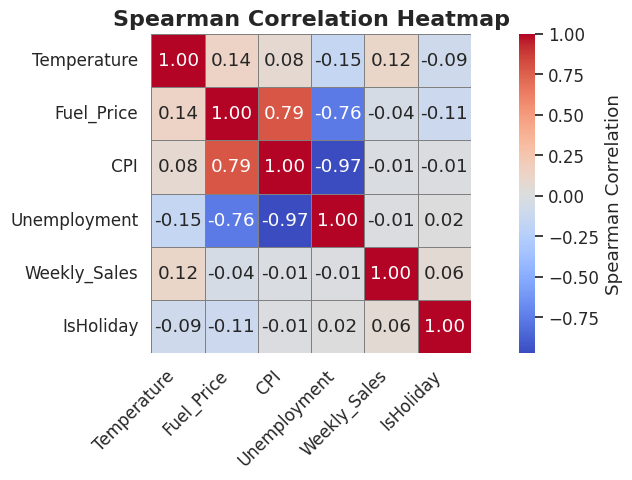

In [441]:
# Set plot aesthetics
plt.figure(figsize=(10, 5))
sns.set(font_scale=1.1)  # slightly larger font for annotations

# Generate the heatmap
heatmap = sns.heatmap(
    df_by_date_new.corr(method='spearman'),
    annot=True,
    fmt='.2f',
    cmap='coolwarm',
    cbar_kws={'label': 'Spearman Correlation'},
    linewidths=0.5,
    linecolor='gray',
    square=True
)

# Customize the plot
plt.title('Spearman Correlation Heatmap', fontsize=16, fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()

# Show plot
plt.show()

strong +ve correlation b/w Fuel_Price and CPI and strong -ve correlations b/w Unmeployment and Fuel_Price and Unemployment and CPI. surprisingly, unemployment rate doesn't really seem to affect the weekly sales (directly at least)

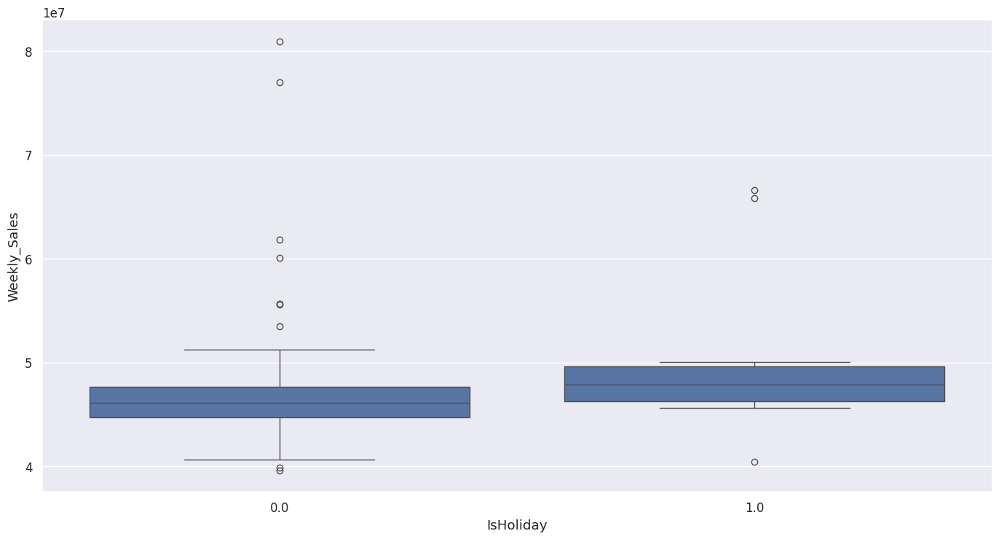

In [442]:
# Holiday weeks
plt.figure(figsize=(15,8))
sns.boxplot(data = df_by_date, x = 'IsHoliday', y = 'Weekly_Sales');


holiday weeks don't necessarily mean that the weekly sales go up but it is often the case

### **Forecasting using the Holt-Winters Model**

Exponential smoothing is a technique for smoothening time series data by giving different weights which are exponentially decreasing over time, unlike simple moving average method which assigns equal weightage to all observations. Holt Winters exponential smoothening applies exponential smoothing three times, usually done when high frequency signal has to be removed.

Train and test on 2012 data to determine accuracy

In [443]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing

In [444]:
fit_model = ExponentialSmoothing(df_by_date_new['Weekly_Sales'][:120],
                                 trend = 'add',
                                 seasonal = 'add',
                                 seasonal_periods = 52).fit()

prediction = fit_model.forecast(34)
prediction

,0
2012-04-29,4.423871e+07
2012-05-06,4.865764e+07
2012-05-13,4.610740e+07
2012-05-20,4.469169e+07
2012-05-27,4.595247e+07
2012-06-03,4.751265e+07
2012-06-10,4.810565e+07
2012-06-17,4.812148e+07
2012-06-24,4.663070e+07
2012-07-01,4.359984e+07


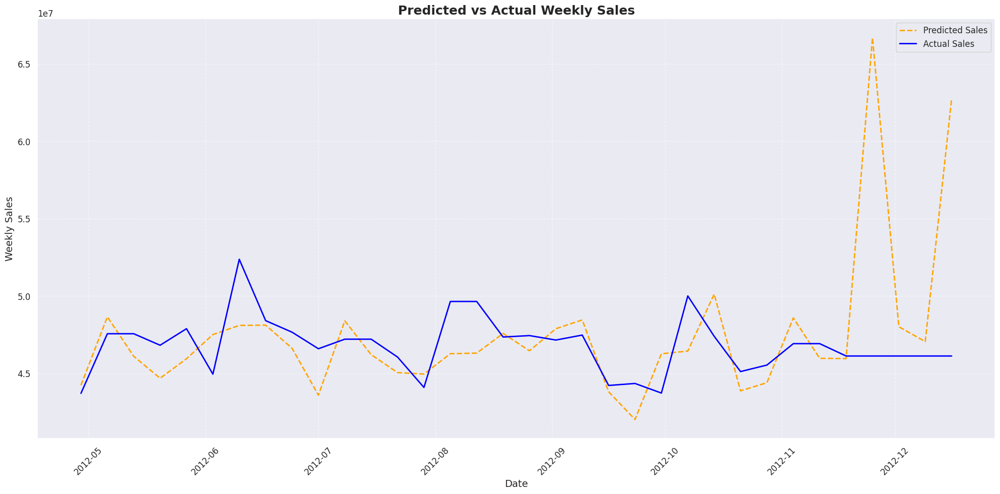

In [445]:
# Set the figure size
plt.figure(figsize=(20, 10))

# Plot predicted and actual sales
plt.plot(df_by_date_new.index[120:], prediction, label='Predicted Sales', color='orange', linestyle='--', linewidth=2)
plt.plot(df_by_date_new.index[120:], df_by_date_new['Weekly_Sales'][120:], label='Actual Sales', color='blue', linewidth=2)

# Title and axis labels
plt.title('Predicted vs Actual Weekly Sales', fontsize=18, fontweight='bold')
plt.xlabel('Date', fontsize=14)
plt.ylabel('Weekly Sales', fontsize=14)

# Add legend
plt.legend(fontsize=12)

# Improve x-axis formatting if needed
plt.xticks(rotation=45)
plt.grid(True, linestyle='--', alpha=0.5)

# Tight layout for clean spacing
plt.tight_layout()

# Show plot
plt.show()

In [446]:
def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
print("Mean Absolute Percentage Error = {a}%".format(a=mean_absolute_percentage_error(df_by_date_new.Weekly_Sales[120:],prediction)))

Mean Absolute Percentage Error = 5.571099127670492%


### **Forecasting 2013 sales**

In [447]:
fit_model = ExponentialSmoothing(df_by_date_new['Weekly_Sales'][:-2],
                                 trend = 'add',
                                 seasonal = 'add',
                                 seasonal_periods = 52).fit()

future_prediction = fit_model.forecast(56)
future_prediction

,0
2012-12-09,4.620324e+07
2012-12-16,6.173534e+07
2012-12-23,8.063976e+07
2012-12-30,4.105708e+07
2013-01-06,4.559893e+07
2013-01-13,4.156147e+07
2013-01-20,4.154913e+07
2013-01-27,4.046564e+07
2013-02-03,4.758652e+07
2013-02-10,4.776282e+07


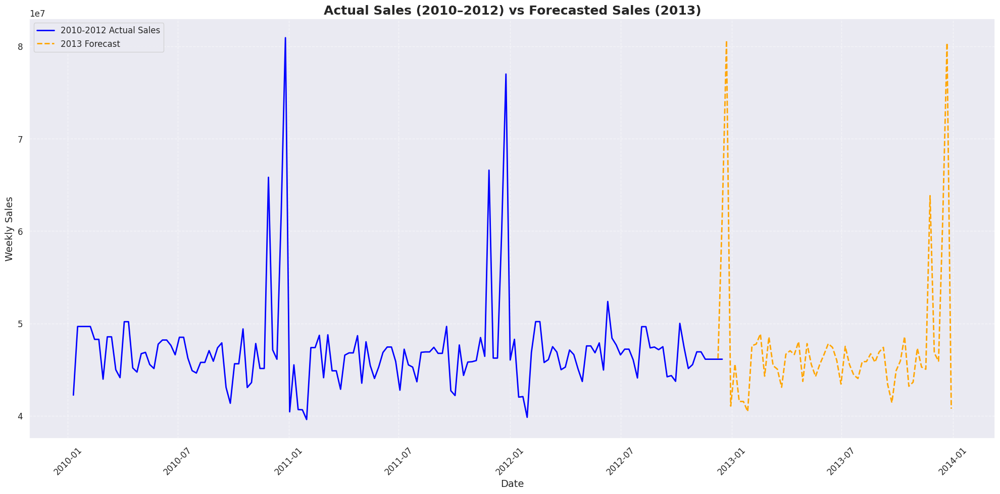

In [448]:
# Set figure size
plt.figure(figsize=(20, 10))

# Plot actual weekly sales
plt.plot(df_by_date_new.index, df_by_date_new['Weekly_Sales'], label='2010-2012 Actual Sales', color='blue', linewidth=2)

# Plot future predictions
plt.plot(future_prediction.index, future_prediction.values, linestyle='--', color='orange', linewidth=2, label='2013 Forecast')

# Title and axis labels
plt.title('Actual Sales (2010–2012) vs Forecasted Sales (2013)', fontsize=18, fontweight='bold')
plt.xlabel('Date', fontsize=14)
plt.ylabel('Weekly Sales', fontsize=14)

# Add legend
plt.legend(fontsize=12)

# Improve x-axis formatting
plt.xticks(rotation=45)

# Add grid
plt.grid(True, linestyle='--', alpha=0.5)

# Improve layout
plt.tight_layout()

# Show plot
plt.show()

# **Impact of External Factors:**

Examine how external factors (economic indicators, regional climate) influence sales.

Incorporate these insights into the demand forecasting models.

## **External factors (economic indicators, regional climate) influence sales**

Impact of External Factors on Demand:
         Feature  Importance
0          Store    0.000000
1           Dept    0.000000
2      IsHoliday    0.000000
7      MarkDown3    0.003325
6      MarkDown2    0.004494
5      MarkDown1    0.005093
8      MarkDown4    0.005107
9      MarkDown5    0.008796
4     Fuel_Price    0.015683
11  Unemployment    0.018458
10           CPI    0.028719
3    Temperature    0.061972


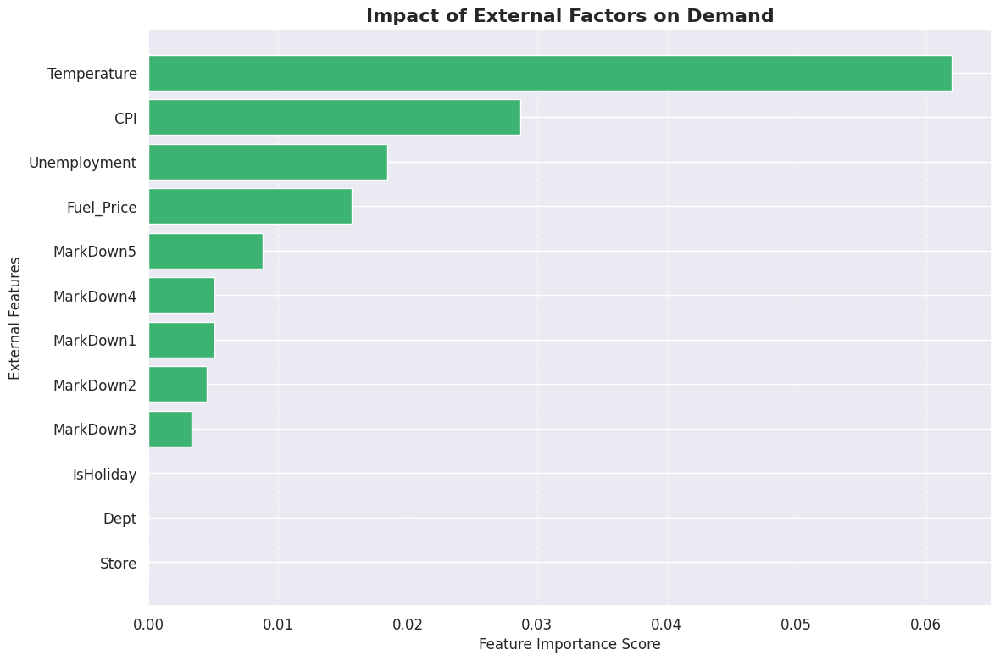

In [449]:
# Get feature importances from the trained model
importances = model_rf.feature_importances_

# Create a DataFrame for better structure
impact = pd.DataFrame({
    'Feature': X_train.columns[:12],  # First 12 external factors
    'Importance': importances[:12]
}).sort_values(by='Importance', ascending=True)  # Sort for better visualization

# Display DataFrame
print("Impact of External Factors on Demand:")
print(impact)

# Plotting the impact of external features
plt.figure(figsize=(12, 8))
plt.barh(impact['Feature'], impact['Importance'], color='mediumseagreen')
plt.title('Impact of External Factors on Demand', fontsize=16, fontweight='bold')
plt.xlabel('Feature Importance Score', fontsize=12)
plt.ylabel('External Features', fontsize=12)
plt.grid(axis='x', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# Findings: Impact of External Factors on Demand Forecasting

Incorporating external variables such as economic indicators and climatic conditions into demand forecasting models significantly improves prediction accuracy. The following insights describe how these factors influence sales behavior.

## Temperature

Regional temperature patterns strongly affect consumer demand. Colder regions typically show increased demand for winter clothing, heating products, and comfort-related goods, while warmer regions tend to drive higher sales of summer apparel, outdoor products, and cooling items.

Including temperature data in forecasting models helps capture seasonal demand shifts and enables better planning for inventory, product assortment, and marketing strategies.

## Consumer Price Index (CPI)

The Consumer Price Index (CPI) reflects inflation levels and changes in consumer purchasing power. Rising CPI often leads to more cautious spending behavior, with consumers prioritizing essential goods over discretionary purchases. Lower inflation, on the other hand, tends to encourage higher spending.

Incorporating CPI into forecasting models helps anticipate shifts in consumer behavior and supports better decisions related to pricing, promotions, and product positioning.

## Fuel Price

Fuel price variations impact both logistics costs and consumer disposable income. Higher fuel prices can increase transportation expenses and reduce discretionary spending, as more income is allocated toward essential fuel costs.

Including fuel price data in forecasting models allows businesses to account for cost-driven demand fluctuations and adjust supply chain, pricing, and distribution strategies accordingly.

## Conclusion

External factors such as temperature, CPI, and fuel prices play a crucial role in shaping demand patterns. Integrating these variables into forecasting models enhances predictive performance and supports more informed decision-making in inventory management, pricing strategy, and marketing planning.


## **Incorporate these insights into the demand forecasting models.**

In [450]:
merged_data['CPI_Percent_Change'] = merged_data['CPI'].pct_change()
merged_data['Temp_Percent_Change'] = merged_data['Temperature'].pct_change()
merged_data['Fuel_Price_Percent_Change'] = merged_data['Fuel_Price'].pct_change()

In [451]:
merged_data.fillna(0,inplace=True)

In [452]:
merged_data['CPI_Percent_Change'].value_counts()

,count
CPI_Percent_Change,
-1.000000,9
inf,9
0.000000,2
0.000311,1
0.001912,1
...,...
0.000897,1
0.006611,1
0.000083,1


In [453]:
merged_data

,Store,Dept,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,lagged_sales_1,lagged_sales_2,CPI_Percent_Change,Temp_Percent_Change,Fuel_Price_Percent_Change
Date,,,,,,,,,,,,,,,,,,
2010-01-10,1,1,20094.19,0,71.89,2.603,5369.61,180.02,21.38,1523.11,3402.66,211.671989,7.838,18122.52,19354.23,0.000000,0.000000,0.000000
2010-02-04,1,1,57258.43,0,62.27,2.719,5369.61,180.02,21.38,1523.11,3402.66,210.820450,7.808,26229.21,22136.64,-0.004023,-0.133816,0.044564
2010-02-07,1,1,16333.14,0,80.91,2.669,5369.61,180.02,21.38,1523.11,3402.66,211.223533,7.787,16328.72,16216.27,0.001912,0.299342,-0.018389
2010-02-19,1,1,41595.55,0,39.93,2.514,5369.61,180.02,21.38,1523.11,3402.66,211.289143,8.106,46039.49,24924.50,0.000311,-0.506489,-0.058074
2010-02-26,1,1,19403.54,0,46.63,2.561,5369.61,180.02,21.38,1523.11,3402.66,211.319643,8.106,41595.55,46039.49,0.000144,0.167794,0.018695
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2012-10-08,1,1,16119.92,0,85.05,3.494,11436.22,245.00,6.85,6964.26,4836.22,221.958433,6.908,16628.31,15731.18,inf,inf,inf
2012-10-19,1,1,24185.27,0,67.97,3.594,950.33,180.02,4.93,80.25,2312.85,223.425723,6.573,22764.01,21904.47,0.006611,-0.200823,0.028620
2012-10-26,1,1,27390.81,0,69.16,3.506,2585.85,31.75,6.00,1057.16,1305.01,223.444251,6.573,24185.27,22764.01,0.000083,0.017508,-0.024485


In [454]:
df = merged_data[~merged_data['CPI_Percent_Change'].isin([np.inf, -np.inf])]

In [455]:
# Split data into train and test sets
train_data, test_data = train_test_split(df, test_size=0.2, shuffle=False)

In [456]:
train_data.columns

Index(['Store', 'Dept', 'Weekly_Sales', 'IsHoliday', 'Temperature',
       'Fuel_Price', 'MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4',
       'MarkDown5', 'CPI', 'Unemployment', 'lagged_sales_1', 'lagged_sales_2',
       'CPI_Percent_Change', 'Temp_Percent_Change',
       'Fuel_Price_Percent_Change'],
      dtype='object')

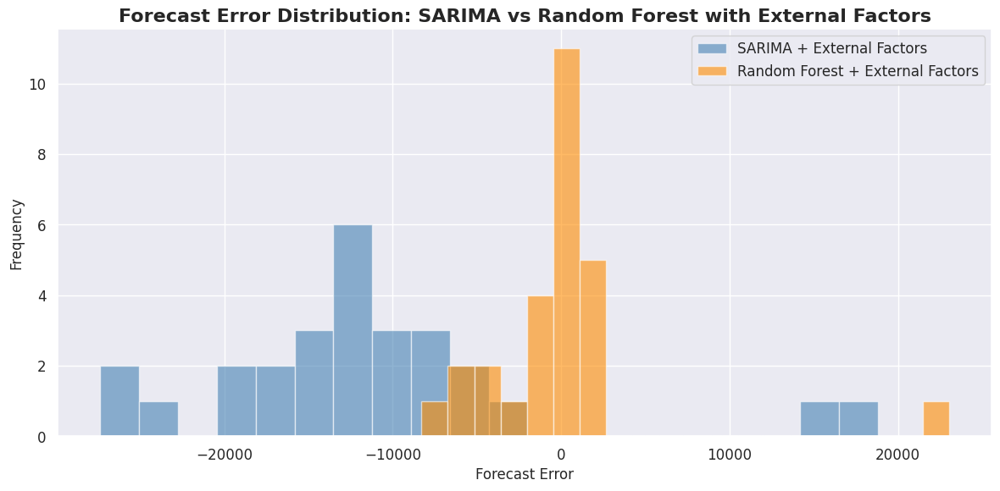

In [457]:
# --------------------------------------------------
# SARIMA Model with External Regressors
# --------------------------------------------------

# Fit SARIMA model using external macroeconomic factors
model_sarima_with_ext = SARIMAX(
    train_data['Weekly_Sales'],
    exog=train_data[['Temp_Percent_Change',
                     'CPI_Percent_Change',
                     'Fuel_Price_Percent_Change']],
    order=(1, 1, 1),
    seasonal_order=(1, 1, 1, 52)
)

sarima_ext_result = model_sarima_with_ext.fit()

# Generate SARIMA forecasts for test period
sarima_ext_forecast = sarima_ext_result.forecast(
    steps=len(test_data),
    exog=test_data[['Temp_Percent_Change',
                    'CPI_Percent_Change',
                    'Fuel_Price_Percent_Change']]
)


# --------------------------------------------------
# Random Forest Regression with External Features
# --------------------------------------------------

# Prepare training and testing datasets
X_train = train_data.drop(columns=['Weekly_Sales'])
y_train = train_data['Weekly_Sales']
y_test = test_data['Weekly_Sales']

X_test = test_data[['Store', 'Dept', 'IsHoliday', 'Temperature',
                     'Fuel_Price', 'MarkDown1', 'MarkDown2',
                     'MarkDown3', 'MarkDown4', 'MarkDown5',
                     'CPI', 'Unemployment',
                     'lagged_sales_1', 'lagged_sales_2',
                     'CPI_Percent_Change',
                     'Temp_Percent_Change',
                     'Fuel_Price_Percent_Change']]

# Train Random Forest model
model_rf_with_ext = RandomForestRegressor(random_state=42)
model_rf_with_ext.fit(X_train, y_train)

# Generate Random Forest predictions
rf_ext_forecast = model_rf_with_ext.predict(X_test)


# --------------------------------------------------
# Error Analysis & Visualization
# --------------------------------------------------

# Convert predictions to aligned Series
rf_ext_forecast = pd.Series(rf_ext_forecast)
test_data = test_data['Weekly_Sales'].reset_index(drop=True)
sarima_ext_forecast = sarima_ext_forecast.reset_index(drop=True)

# Compute forecast errors
sarima_ext_errors = test_data - sarima_ext_forecast
rf_ext_errors = test_data - rf_ext_forecast

# Plot error distributions
plt.figure(figsize=(12, 6))
plt.hist(
    sarima_ext_errors,
    bins=20,
    alpha=0.6,
    color='steelblue',          # 🔁 color refined
    label='SARIMA + External Factors'
)
plt.hist(
    rf_ext_errors,
    bins=20,
    alpha=0.6,
    color='darkorange',         # 🔁 color refined
    label='Random Forest + External Factors'
)

# Titles and labels
plt.title(
    "Forecast Error Distribution: SARIMA vs Random Forest with External Factors",
    fontsize=16,
    fontweight='bold'
)
plt.xlabel("Forecast Error", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.legend()
plt.tight_layout()
plt.show()


In [458]:
# Random Forest
rf_mae_ext = mean_absolute_error(test_data, rf_ext_forecast)
rf_rmse_ext = np.sqrt(mean_squared_error(test_data, rf_ext_forecast))

In [459]:
print("RF MAE:", rf_mae_ext)
print("RF RMSE:", rf_rmse_ext)

RF MAE: 2650.7602777777765
RF RMSE: 5262.354758026428


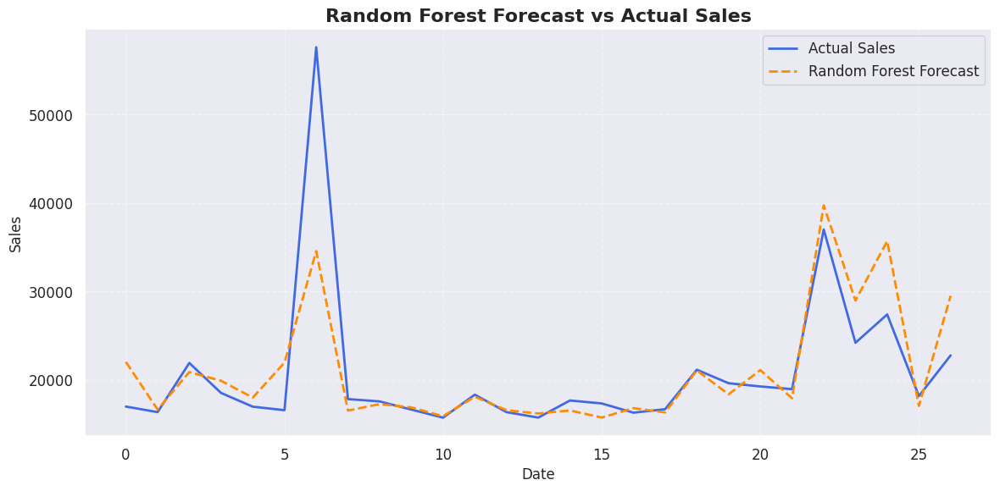

In [460]:
# Check if test_data is a Series (no column access needed)
plt.figure(figsize=(12, 6))
plt.plot(test_data.index, test_data, label='Actual Sales', color='royalblue', linewidth=2)
plt.plot(test_data.index, rf_ext_forecast, label='Random Forest Forecast', color='darkorange', linestyle='--', linewidth=2)

plt.title('Random Forest Forecast vs Actual Sales', fontsize=16, fontweight='bold')
plt.xlabel('Date', fontsize=12)
plt.ylabel('Sales', fontsize=12)
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

# Real-World Application and Strategy Formulation

Based on the insights from sales analysis and demand forecasting, a comprehensive strategy can be developed across inventory management, marketing, and store optimization to improve overall business performance.

## Inventory Management Strategy

Seasonal forecasting can be used to align inventory levels with temperature-driven demand patterns, ensuring appropriate stock availability for seasonal products. Dynamic pricing strategies can be implemented using CPI trends to adjust prices according to changes in consumer purchasing power, including promotions during periods of lower inflation. Additionally, supply chain operations can be optimized by monitoring fuel price fluctuations to manage transportation costs and improve distribution efficiency.

## Marketing Strategy

Marketing campaigns should be tailored to regional climate variations, promoting relevant seasonal products such as winter apparel in colder regions and summer goods in warmer areas. CPI-based price sensitivity analysis can help refine pricing strategies to remain competitive while maximizing revenue. Promotional timing can also be aligned with fuel price trends, offering targeted discounts during favorable periods to support consumer demand.

## Store Optimization Strategy

Store layouts should reflect seasonal demand patterns, with high-demand seasonal products placed in more visible areas to improve sales. Inventory turnover can be optimized using CPI insights to align stock levels with changing consumer spending behavior. Additionally, customer experience can be enhanced by offering flexible services such as online ordering and convenient delivery options, especially during periods of high fuel prices.

## Challenges in Implementation

Several challenges may arise while implementing these strategies. Integrating multiple external data sources such as temperature, CPI, and fuel prices into existing systems can be complex. Effective resource allocation is required to support dynamic pricing and targeted marketing initiatives. Operational flexibility is also essential to quickly respond to sudden changes in external conditions such as fuel price fluctuations or demand shifts. Furthermore, competitive market pressures may limit pricing adjustments and require careful balancing between profitability and market share.

## Conclusion

Overall, successfully implementing these strategies requires strong data integration capabilities, agile operations, and well-planned decision-making frameworks. Leveraging external factors effectively can significantly improve forecasting accuracy, optimize operations, and enhance overall business performance.


In [461]:
sales_df['Store'] = sales_df['Store'].astype('category')
sales_df['Dept'] = sales_df['Dept'].astype('string')
sales_df['Date'] = pd.to_datetime(sales_df['Date'], format='%d/%m/%Y')
sales_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 421570 entries, 0 to 421569
Data columns (total 5 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   Store         421570 non-null  category      
 1   Dept          421570 non-null  string        
 2   Date          421570 non-null  datetime64[ns]
 3   Weekly_Sales  421570 non-null  float64       
 4   IsHoliday     421570 non-null  int64         
dtypes: category(1), datetime64[ns](1), float64(1), int64(1), string(1)
memory usage: 13.3 MB


In [462]:
print("Total number of stores:", sales_df.Store.nunique())
print("Total number of departments:", sales_df.Dept.nunique())

Total number of stores: 45
Total number of departments: 81


In [463]:
df_sales_new=sales_df[(sales_df['Store'] == 10) & (sales_df['Dept'].isin(['1', '2', '3', '4','5' ]))].drop(columns=['IsHoliday'])

In [464]:
df_sales_new.info()

<class 'pandas.core.frame.DataFrame'>
Index: 715 entries, 87524 to 88238
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Store         715 non-null    category      
 1   Dept          715 non-null    string        
 2   Date          715 non-null    datetime64[ns]
 3   Weekly_Sales  715 non-null    float64       
dtypes: category(1), datetime64[ns](1), float64(1), string(1)
memory usage: 24.4 KB


In [465]:
df_sales_new.Date.min(), df_sales_new.Date.max()

(Timestamp('2010-01-10 00:00:00'), Timestamp('2012-12-10 00:00:00'))

In [466]:
df_sales_new.shape

(715, 4)

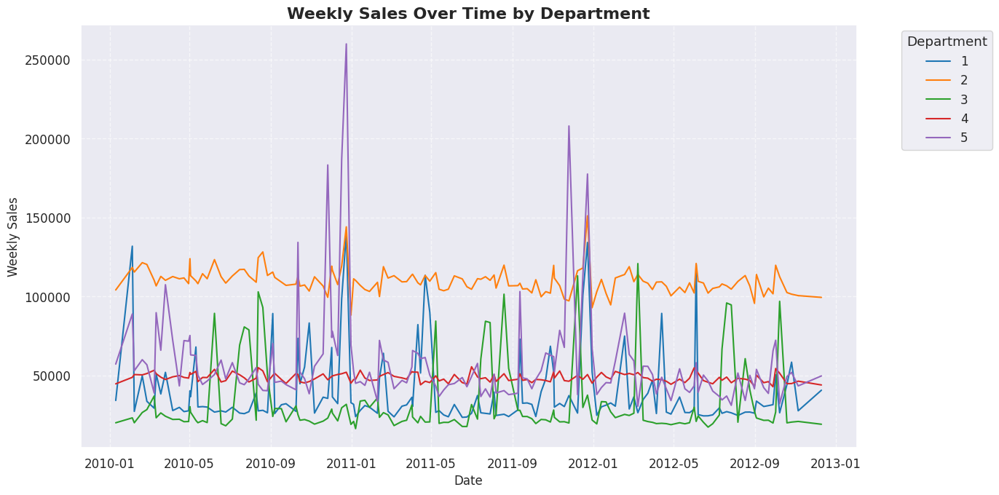

In [467]:
# Ensure 'Date' is in datetime format
df_sales_new['Date'] = pd.to_datetime(df_sales_new['Date'])

# Optional: Limit to a subset of departments to avoid overplotting
top_depts = df_sales_new['Dept'].value_counts().nlargest(5).index  # Top 5 most frequent departments
filtered_df = df_sales_new[df_sales_new['Dept'].isin(top_depts)]

# Plot
plt.figure(figsize=(14, 7))
sns.lineplot(data=filtered_df, x='Date', y='Weekly_Sales', hue='Dept', palette='tab10')

plt.title('Weekly Sales Over Time by Department', fontsize=16, fontweight='bold')
plt.xlabel('Date', fontsize=12)
plt.ylabel('Weekly Sales', fontsize=12)
plt.legend(title='Department', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

Dept-wise trends show clear seasonal patterns. Dept 1 peaks in April and again in November–December. Dept 2 steadily grows till September, then spikes sharply in December. Dept 3 remains mostly stable with increases in August–September and smaller rises in December–January, suggesting seasonal or academic influence. Dept 4 stays relatively consistent with minor fluctuations throughout the year. Dept 5 shows an early-year rise followed by a strong peak in December, indicating year-end seasonality.


## Marketing Campaign

To perform causal inference analysis, we introduce a controlled intervention in the dataset and observe its impact on sales behavior.

Since Dept 4 shows a stable and consistent sales pattern, it is suitable for evaluating the effect of an external shock. We simulate a scenario where a marketing campaign is launched in Q3-2012 (July to September), and assume it leads to a measurable increase in sales during this period.

This induced change allows us to compare pre-campaign and post-campaign performance, helping assess whether the marketing intervention has a significant impact on sales trends in Dept 4 while controlling for its historically stable behavior.

In [468]:
df_dept4_marketing=df_sales_new.copy()
df_dept4_marketing['Marketing_Campaign'] = np.where((df_dept4_marketing['Dept'] == '4') & (df_dept4_marketing['Date'] > "2012-06-30") &
    (df_dept4_marketing['Date'] < "2012-10-01"),'Active', 'Inactive')

In [469]:
df_dept4_marketing

,Store,Dept,Date,Weekly_Sales,Marketing_Campaign
87524,10,1,2010-05-02,40212.84,Inactive
87525,10,1,2010-12-02,67699.32,Inactive
87526,10,1,2010-02-19,49748.33,Inactive
87527,10,1,2010-02-26,33601.22,Inactive
87528,10,1,2010-05-03,36572.44,Inactive
...,...,...,...,...,...
88234,10,5,2012-09-28,65585.96,Inactive
88235,10,5,2012-05-10,54202.85,Inactive
88236,10,5,2012-12-10,49683.63,Inactive
88237,10,5,2012-10-19,49277.87,Inactive


In [470]:
new_sales = df_dept4_marketing.copy()
new_sales['New_sales']=np.where(new_sales['Marketing_Campaign']=="Active",new_sales['Weekly_Sales'] * 1.45 ,new_sales['Weekly_Sales'])
new_sales

,Store,Dept,Date,Weekly_Sales,Marketing_Campaign,New_sales
87524,10,1,2010-05-02,40212.84,Inactive,40212.84
87525,10,1,2010-12-02,67699.32,Inactive,67699.32
87526,10,1,2010-02-19,49748.33,Inactive,49748.33
87527,10,1,2010-02-26,33601.22,Inactive,33601.22
87528,10,1,2010-05-03,36572.44,Inactive,36572.44
...,...,...,...,...,...,...
88234,10,5,2012-09-28,65585.96,Inactive,65585.96
88235,10,5,2012-05-10,54202.85,Inactive,54202.85
88236,10,5,2012-12-10,49683.63,Inactive,49683.63
88237,10,5,2012-10-19,49277.87,Inactive,49277.87


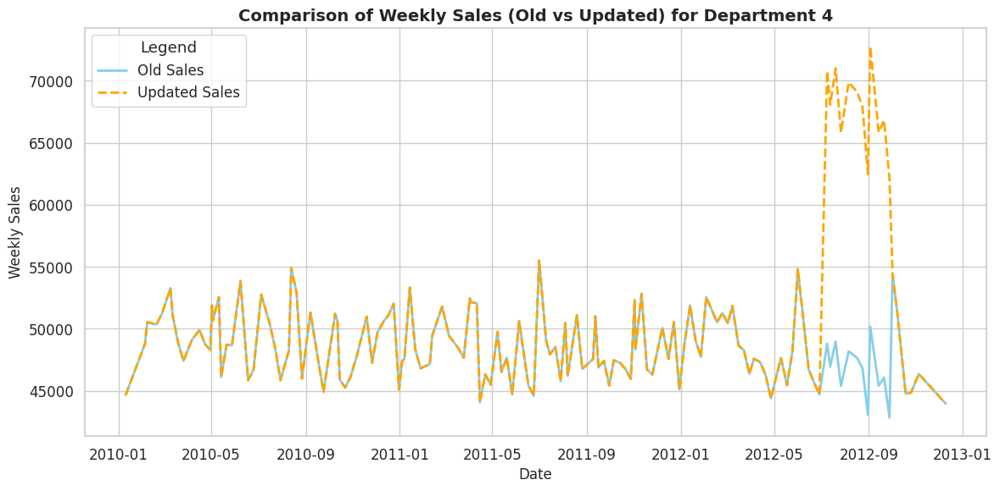

In [471]:
# Set the figure size and style
plt.figure(figsize=(12, 6))
sns.set_style("whitegrid")

# Plot old sales
sns.lineplot(
    data=df_sales_new.query("Dept == '4'"),
    x="Date", y="Weekly_Sales", label='Old Sales', color='skyblue', linewidth=2
)

# Plot new/updated sales
sns.lineplot(
    data=new_sales.query("Dept == '4'"),
    x="Date", y="New_sales", label='Updated Sales', color='orange', linewidth=2, linestyle='--'
)

# Add titles and labels
plt.title('Comparison of Weekly Sales (Old vs Updated) for Department 4', fontsize=14, fontweight='bold')
plt.xlabel('Date', fontsize=12)
plt.ylabel('Weekly Sales', fontsize=12)
plt.legend(title='Legend')
plt.tight_layout()
plt.show()

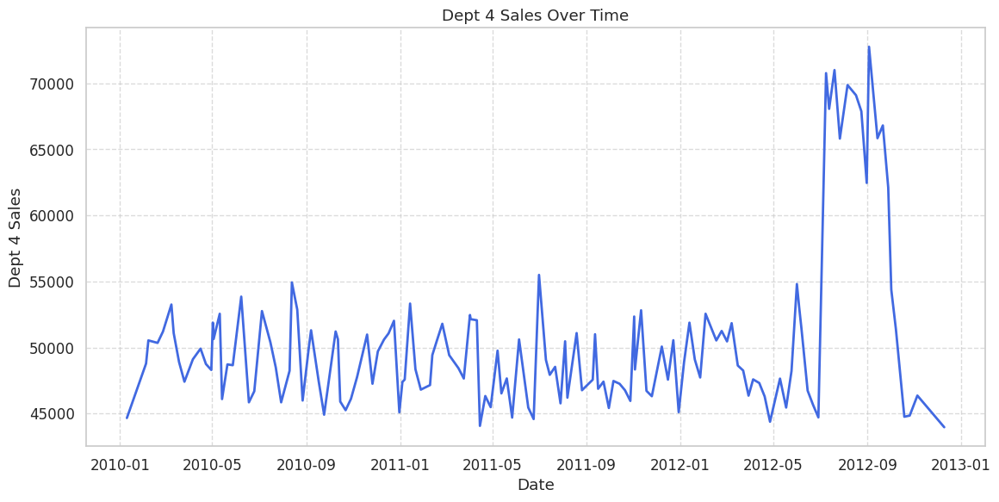

In [472]:
# After pivoting, 'Date' is the index, so reset it to make it a column for plotting
df_sales_causal = new_sales.pivot(index="Date", columns="Dept", values="New_sales")
df_sales_causal.columns = ['Dept_1', 'Dept_2', 'Dept_3', 'Dept_4', 'Dept_5']
df_sales_causal = df_sales_causal.sort_index()  # Sort by index (Date)

# Keep only Dept_4
df_final = df_sales_causal[['Dept_4']].reset_index()

# Plot Dept_4 sales over time
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_final, x='Date', y='Dept_4', color='royalblue', linewidth=2)
plt.title('Dept 4 Sales Over Time')
plt.xlabel('Date')
plt.ylabel('Dept 4 Sales')
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()